In [ ]:
# Load drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
from pandas import read_csv
import numpy as np
from numpy import arange
import matplotlib.pyplot as plt
from tifffile import *
from glob import glob
!pip install rasterio
!pip install earthpy
import rasterio
import tensorflow as tf
from tensorflow import keras
from sklearn.model_selection import train_test_split


import matplotlib.pyplot as plt
import sklearn
from sklearn.model_selection import train_test_split
from sklearn import linear_model
import statsmodels.api as sm
from matplotlib.patches import Patch
from sklearn import datasets, linear_model
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import cross_val_predict
from sklearn import metrics
import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib.colors as mcolors

from matplotlib.colors import Normalize
from scipy.interpolate import interpn
import rasterio as rio
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import plotly.graph_objects as go

# Import libraries
import pandas as pd
from pandas import read_csv
import numpy as np
from numpy import arange
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.colors import Normalize
from scipy.interpolate import interpn
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error
from sklearn.inspection import permutation_importance

# Import Python 3's print function and division
from __future__ import print_function, division

# Import GDAL, NumPy, and matplotlib
from osgeo import gdal, gdal_array
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

from osgeo import gdal
import os
import glob
import numpy as np
import re
import matplotlib.pyplot as plt

from sklearn.ensemble import RandomForestClassifier
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split
from sklearn.metrics import (accuracy_score, confusion_matrix, classification_report)


from scipy.ndimage.filters import generic_filter
from scipy.stats import mode

import earthpy as et
import earthpy.spatial as es
import earthpy.plot as ep
import xgboost as xgb

# Import libraries
import tensorflow as tf
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler
import os
import matplotlib.pyplot as plt
from sklearn import metrics
from sklearn.metrics import mean_squared_error
from matplotlib import cm
from matplotlib.colors import Normalize
from scipy.interpolate import interpn
from google.colab import files

np.seterr(divide='ignore', invalid='ignore')

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 44.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 27.7 MB/s eta 0:00:00


<ipython-input-2-4f6808ef3848>:77: DeprecationWarning: Please use `generic_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import generic_filter


{'divide': 'warn', 'over': 'warn', 'under': 'ignore', 'invalid': 'warn'}

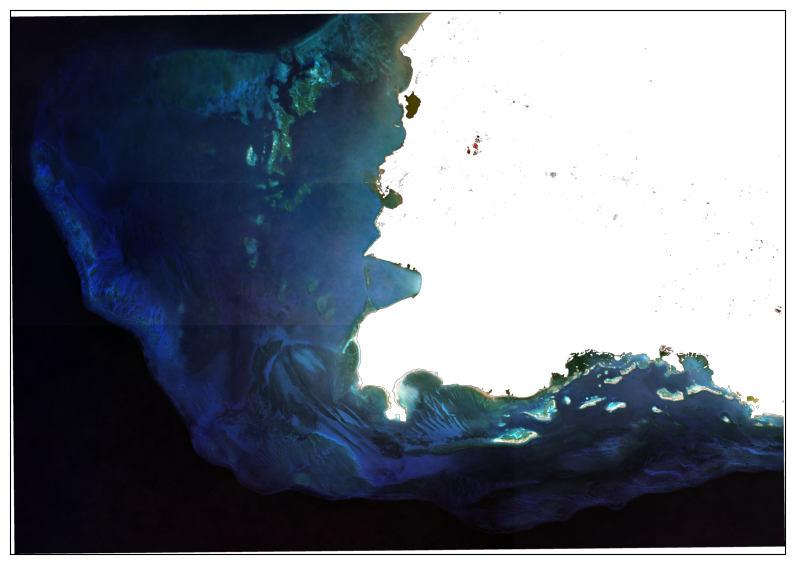

In [ ]:
## Get reference data and set all values to 1.
# Sentinel-2 image:
with rasterio.open('/content/drive/MyDrive/GEE_composites/median_reflectance.tif') as src:
    image = src.read()

image = image.astype(np.float32) # from integer to float

image[image==0] = np.nan
image[image<-1000] = np.nan
image.shape

ep.plot_rgb(image,
            rgb=(3, 2, 1),
            stretch=True,
            str_clip=0.2,
            figsize=(10, 16))
plt.show()

In [ ]:
image.shape

(13, 3783, 5389)

In [ ]:
## Stack image with reference
with rasterio.open('/content/drive/MyDrive/GEE_composites/median_reflectance.tif') as src:
    reference = src.read()
reference = reference[-1,:,:]
reference.shape

(3783, 5389)

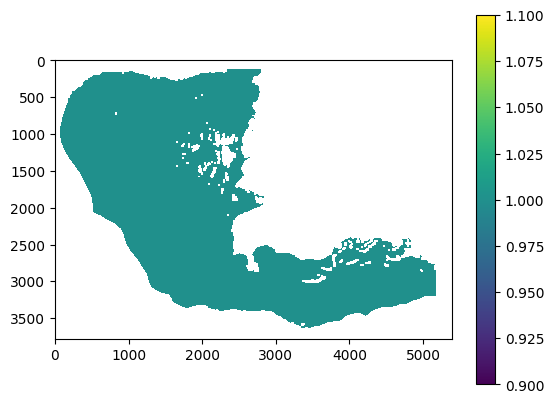

In [ ]:
## Stack image with reference
with rasterio.open('/content/drive/MyDrive/GEE_composites/median_reflectance.tif') as src:
    ref = src.read()

ref[-1,:,:][ref[-1,:,:] > 0] = 1
ref[-1,:,:][ref[-1,:,:] < 0] = 1
ref[-1,:,:][ref[-1,:,:] == 0] = 1
ref = ref[-1,:,:]

pc = plt.imshow(ref)
plt.colorbar(pc)

In [ ]:
def remove_nan(image):
    image = image.astype(np.float32) # from integer to float
    nan_mask = np.any(np.isnan(image), axis=0)
    image[:, nan_mask] = np.nan

    return image

In [ ]:
def masked_rmse(y_true, y_pred):
    # Create a mask of non-NaN and non-zero values
    mask = tf.math.logical_and(~tf.math.is_nan(y_true), y_true != 0)

    # Apply the mask to both y_true and y_pred
    y_true = tf.boolean_mask(y_true, mask)
    y_pred = tf.boolean_mask(y_pred, mask)

    # Calculate the RMSE between non-NaN, non-zero elements
    mse = tf.keras.losses.mean_squared_error(y_true, y_pred)
    rmse = tf.math.sqrt(mse)

    return rmse

In [ ]:
image = remove_nan(image)
image.shape

(13, 3783, 5389)

In [ ]:
image_1 = image[:,70:1035,:]
image_2 = image[:,1035:2000,:]
image_3 = image[:,2000:,:2800]
image_4 = image[:,2000:,2800:]

In [ ]:
image = np.transpose(image,(1,2,0))
image.shape

(3783, 5389, 13)

In [ ]:
image2 = image

In [ ]:
# NEW

def remove_patches_with_too_many_NaN(patches, threshold=0.7):
    # Create an array of the same shape as patches to store the mask
    mask = np.zeros(patches.shape, dtype=bool)
    # Find the indices of the NaN values in each patch
    nan_indices = np.isnan(patches)
    # Use the nan_indices to create the mask
    mask[nan_indices] = True
    # Calculate the fraction of NaN values in each patch
    fraction_NaN = np.mean(mask, axis=(1, 2, 3))
    # Keep only the patches with fewer than the threshold fraction of NaN values
    kept_patches = patches[fraction_NaN < threshold, :, :, :]
    # Get the indices of the removed patches
    removed_indices = np.where(fraction_NaN >= threshold)[0]
    return kept_patches, removed_indices

def set_NaN_to_zero(patches):
    # Replace the NaN values in each patch with 0
    patches[np.isnan(patches)] = 0
    return patches

def extract_patches(image, patch_size):
    # Calculate the number of patches in each dimension
    n_rows = (image.shape[0] - patch_size[0]) // patch_size[0] + 1
    n_cols = (image.shape[1] - patch_size[1]) // patch_size[1] + 1
    n_patches = n_rows * n_cols
    patches = np.zeros((n_patches, patch_size[0], patch_size[1], image.shape[2]))

    # Loop over the patches and extract them using slicing
    patch_index = 0
    for i in range(0, image.shape[0] - patch_size[0] + 1, patch_size[0]):
        for j in range(0, image.shape[1] - patch_size[1] + 1, patch_size[1]):
            patch = image[i:i + patch_size[0], j:j + patch_size[1], :]
            patches[patch_index, :, :, :] = patch
            patch_index += 1
    return patches


## 2D CNN

### Image 1

In [ ]:
## IMAGE 1
image_no_1 = np.copy(image2)
# Set pixels in specified slice to NaN
image_no_1[70:1035,:, :] = np.nan

# Train set
image_1 = image2[70:1035,:, :]


In [ ]:
# Define the patch size
patch_size = (16, 16, 13)

# Extract the patches for train area
patches_train = extract_patches(image_no_1, patch_size)
print('Number of patches:', patches_train.shape[0])
print('Patch shape:', patches_train.shape[1:])
# Remove patches with more than 70% NaN values
kept_patches_train, removed_indices = remove_patches_with_too_many_NaN(patches_train, threshold=0.7)
print(kept_patches_train.shape)
# Set the NaN values in the kept patches to 0
zeroed_patches_train = set_NaN_to_zero(kept_patches_train)
print(zeroed_patches_train.shape)

Number of patches: 79296
Patch shape: (16, 16, 13)
(25944, 16, 16, 13)
(25944, 16, 16, 13)


In [ ]:
# Extract the patches for test area
patches_test = extract_patches(image_1, patch_size)
print('Number of patches:', patches_test.shape[0])
print('Patch shape:', patches_test.shape[1:])
# Remove patches with more than 70% NaN values
kept_patches_test, removed_indices = remove_patches_with_too_many_NaN(patches_test, threshold=0.7)
print(kept_patches_test.shape)
# Set the NaN values in the kept patches to 0
zeroed_patches_test = set_NaN_to_zero(kept_patches_test)
print(zeroed_patches_test.shape)

Number of patches: 20160
Patch shape: (16, 16, 13)
(8672, 16, 16, 13)
(8672, 16, 16, 13)


In [ ]:
  # Get the shape of the original test area image
  test_area_shape = image_1.shape

  # Create a new array with the same shape as the test area image, filled with NaN values
  reconstructed_test_area = np.full(test_area_shape, np.nan)

  # Calculate the number of patches in each dimension
  n_rows = (test_area_shape[0] - patch_size[0]) // patch_size[0] + 1
  n_cols = (test_area_shape[1] - patch_size[1]) // patch_size[1] + 1

  # Create a mask with True values for the removed patches
  removed_mask = np.zeros((n_rows, n_cols), dtype=bool)
  removed_mask[np.unravel_index(removed_indices, (n_rows, n_cols))] = True

  # Loop over the patches and fill in the corresponding elements in the reconstructed test area
  patch_index = 0
  for i in range(0, test_area_shape[0] - patch_size[0] + 1, patch_size[0]):
      for j in range(0, test_area_shape[1] - patch_size[1] + 1, patch_size[1]):
          if not removed_mask[i // patch_size[0], j // patch_size[1]]:
              # If the patch was not removed, use the corresponding patch from zeroed_patches_test
              patch = zeroed_patches_test[patch_index, :, :, :]
              reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = patch
              patch_index += 1
          else:
              # If the patch was removed, fill in the corresponding region with NaNs
              reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = np.nan

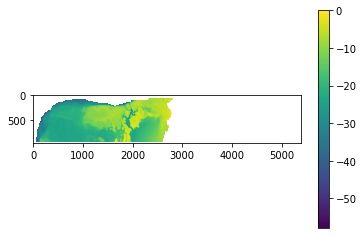

In [ ]:
# Visualize the reshaped zeroed_patches_test array
plt.imshow(reconstructed_test_area[:,:,12])
plt.colorbar()
plt.show()

In [ ]:
# Split the zeroed_patches array into inputs and targets
X_train = zeroed_patches_train[:, :, :, :-1]
y_train = zeroed_patches_train[:, :, :, -1]
y_train = tf.reshape(y_train, (-1, patch_size[0], patch_size[1], 1))

X_test = zeroed_patches_test[:, :, :, :-1]
y_test = zeroed_patches_test[:, :, :, -1]
y_test = tf.reshape(y_test, (-1, patch_size[0], patch_size[1], 1))

# # Calculate the number of samples in the validation set
val_samples = int(X_train.shape[0] * 0.25)

# # Split the training data into training and validation sets
X_val = X_train[-val_samples:, :, :, :]
y_val = y_train[-val_samples:, :, :, :]
X_train = X_train[:-val_samples, :, :, :]
y_train = y_train[:-val_samples, :, :, :]

In [ ]:
# BEST
# Define the model architecture
model = keras.Sequential([
    keras.layers.Conv2D(32, (3, 3), padding='same', activation='relu', input_shape=(16,16,12)),
    keras.layers.BatchNormalization(),
    keras.layers.Dropout(0.25),

    keras.layers.Conv2D(64, (3, 3), padding='same', activation='relu'),
    keras.layers.BatchNormalization(),
    keras.layers.Dropout(0.25),

    keras.layers.Conv2D(128, (3, 3), padding='same', activation='relu'),
    keras.layers.BatchNormalization(),

    keras.layers.Conv2D(256, (3, 3), padding='same', activation='relu'),
    keras.layers.BatchNormalization(),

    keras.layers.Conv2D(1, (1, 1), padding='same', activation='linear')
])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 16, 16, 32)        3488      
                                                                 
 batch_normalization (BatchN  (None, 16, 16, 32)       128       
 ormalization)                                                   
                                                                 
 dropout (Dropout)           (None, 16, 16, 32)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 16, 16, 64)        18496     
                                                                 
 batch_normalization_1 (Batc  (None, 16, 16, 64)       256       
 hNormalization)                                                 
                                                                 
 dropout_1 (Dropout)         (None, 16, 16, 64)        0

In [ ]:
import random
# Set random seed for NumPy
np.random.seed(1)
# Set random seed for Python's built-in random module
random.seed(1)
# Set random seed for TensorFlow
tf.random.set_seed(1)

keras.backend.clear_session()

model.compile(optimizer=keras.optimizers.Adam(lr=0.001), loss=masked_rmse)

# Train the model on the training data
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_val, y_val))

# Evaluate the model on the testing data
predictions = model.predict(X_test)
print(predictions.shape)

Epoch 1/100
609/609 [==============================] - 17s 9ms/step - loss: 5.6382 - val_loss: 3.9468
Epoch 2/100
609/609 [==============================] - 5s 8ms/step - loss: 2.8427 - val_loss: 3.7918
Epoch 3/100
609/609 [==============================] - 5s 8ms/step - loss: 2.6477 - val_loss: 6.1623
Epoch 4/100
609/609 [==============================] - 5s 8ms/step - loss: 2.5265 - val_loss: 3.0463
Epoch 5/100
609/609 [==============================] - 5s 8ms/step - loss: 2.4751 - val_loss: 2.7636
Epoch 6/100
609/609 [==============================] - 5s 8ms/step - loss: 2.3820 - val_loss: 2.5337
Epoch 7/100
609/609 [==============================] - 5s 8ms/step - loss: 2.3308 - val_loss: 7.3143
Epoch 8/100
609/609 [==============================] - 5s 8ms/step - loss: 2.3186 - val_loss: 2.1333
Epoch 9/100
609/609 [==============================] - 5s 8ms/step - loss: 2.2520 - val_loss: 5.4867
Epoch 10/100
609/609 [==============================] - 5s 8ms/step - loss: 2.2070 - val_l

In [ ]:
predictions = np.array(predictions)
y_test = np.array(y_test)
print(predictions.shape)

# Calculate the RMSE
rmse = np.sqrt(np.nanmean((predictions - y_test) ** 2))
print('RMSE:', rmse)

y_test_flat = y_test.flatten()
predictions_flat = predictions.flatten()
df_pred = pd.DataFrame(predictions_flat)
df_test = pd.DataFrame(y_test_flat)
df = pd.concat([df_test, df_pred], axis =1)
df2 = df.dropna() # Remove NaN values
df2.columns = ['Reference','Predicted']
df2= df2[df2['Reference'] < 0] # set max ref depth
df2= df2[df2['Predicted'] > -50] # set max ref depth
df2= df2[df2['Predicted'] < 0] # set max ref depth

#df2= df2[df2['Reference'] > -10] # set max ref depth
#df2 = df2.dropna() # Remove NaN values
df3 = df2.reset_index(drop=True)
df3['Error'] = df3['Predicted'] - df3['Reference']
df3
# Metrics
rmse = mean_squared_error(df3.Reference, df3.Predicted, squared=False)
r2 = metrics.r2_score(df3.Reference, df3.Predicted)
mae = np.mean(abs(df3.Reference - df3.Predicted))
print('MAE:',mae)
print('RMSE', rmse)
print('R2:',r2)

(8672, 16, 16, 1)
RMSE: 5.215182814930825
MAE: 2.1813157103108956
RMSE 3.2360379294129915
R2: 0.8680548173795468


In [ ]:
####### RESHAPE PREDICTIONS

# Get the shape of the original test area image
test_area_shape = image_1.shape

# Create a new array with the same shape as the test area image, filled with NaN values
reconstructed_test_area = np.full(test_area_shape, np.nan)

# Calculate the number of patches in each dimension
n_rows = (test_area_shape[0] - patch_size[0]) // patch_size[0] + 1
n_cols = (test_area_shape[1] - patch_size[1]) // patch_size[1] + 1

# Create a mask with True values for the removed patches
removed_mask = np.zeros((n_rows, n_cols), dtype=bool)
removed_mask[np.unravel_index(removed_indices, (n_rows, n_cols))] = True

# Loop over the patches and fill in the corresponding elements in the reconstructed test area
patch_index = 0
for i in range(0, test_area_shape[0] - patch_size[0] + 1, patch_size[0]):
    for j in range(0, test_area_shape[1] - patch_size[1] + 1, patch_size[1]):
        if not removed_mask[i // patch_size[0], j // patch_size[1]]:
            # If the patch was not removed, use the corresponding patch from zeroed_patches_test
            patch = predictions[patch_index, :, :, :]
            reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = patch
            patch_index += 1
        else:
            # If the patch was removed, fill in the corresponding region with NaNs
            reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = np.nan

pred_image_1 = reconstructed_test_area

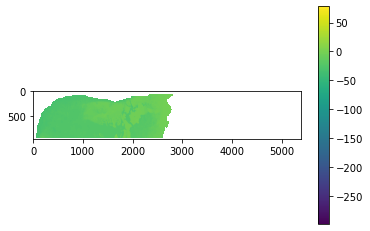

In [ ]:
# Visualize the reshaped zeroed_patches_test array
plt.imshow(reconstructed_test_area[:,:,12])
plt.colorbar()
plt.show()

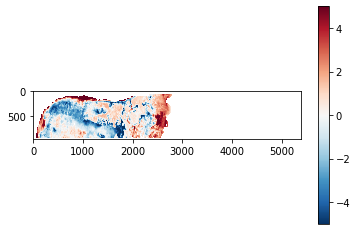

In [ ]:
error = reconstructed_test_area[:,:,12] - image2[70:1035,:, 12]

# Visualize the reshaped zeroed_patches_test array
import matplotlib.colors as mcolors
norm = mcolors.TwoSlopeNorm(vmin=-5, vmax = 5, vcenter=0)
pc = plt.imshow(error, norm=norm, cmap="RdBu_r")
plt.colorbar(pc)

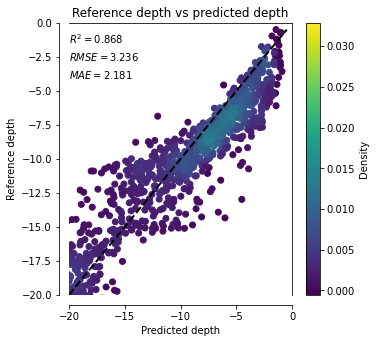

In [ ]:
df3_sample = df3.sample(n = 2000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-20,0])
    ax.set_ylim([-20,0])
    ax.set_xlabel("Predicted depth")
    ax.set_ylabel("Reference depth")
    ax.annotate("$R^2={:.3f}$".format(r2), (-20, -1.5))
    ax.annotate("$RMSE={:.3f}$".format(rmse), (-20, -2.8))
    ax.annotate("$MAE={:.3f}$".format(mae), (-20, -4.1))

    ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
    plt.title("Reference depth vs predicted depth")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('linear_regression.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Predicted'], df3_sample['Reference'], bins = [30,30])

### Image 2

In [ ]:
### IMAGE 2
image_no_2 = np.copy(image2)
# Set pixels in specified slice to NaN
image_no_2[1035:2000,:,:] = np.nan
image_2 = image2[1035:2000,:,:]


In [ ]:
# Define the patch size
patch_size = (16, 16, 13)

# Extract the patches for train area
patches_train = extract_patches(image_no_2, patch_size)
print('Number of patches:', patches_train.shape[0])
print('Patch shape:', patches_train.shape[1:])
# Remove patches with more than 70% NaN values
kept_patches_train, removed_indices = remove_patches_with_too_many_NaN(patches_train, threshold=0.7)
print(kept_patches_train.shape)
# Set the NaN values in the kept patches to 0
zeroed_patches_train = set_NaN_to_zero(kept_patches_train)
print(zeroed_patches_train.shape)

Number of patches: 79296
Patch shape: (16, 16, 13)
(25806, 16, 16, 13)
(25806, 16, 16, 13)


In [ ]:
# Extract the patches for test area
patches_test = extract_patches(image_2, patch_size)
print('Number of patches:', patches_test.shape[0])
print('Patch shape:', patches_test.shape[1:])
# Remove patches with more than 70% NaN values
kept_patches_test, removed_indices = remove_patches_with_too_many_NaN(patches_test, threshold=0.7)
print(kept_patches_test.shape)
# Set the NaN values in the kept patches to 0
zeroed_patches_test = set_NaN_to_zero(kept_patches_test)
print(zeroed_patches_test.shape)

Number of patches: 20160
Patch shape: (16, 16, 13)
(8736, 16, 16, 13)
(8736, 16, 16, 13)


In [ ]:
  # Get the shape of the original test area image
  test_area_shape = image_2.shape

  # Create a new array with the same shape as the test area image, filled with NaN values
  reconstructed_test_area = np.full(test_area_shape, np.nan)

  # Calculate the number of patches in each dimension
  n_rows = (test_area_shape[0] - patch_size[0]) // patch_size[0] + 1
  n_cols = (test_area_shape[1] - patch_size[1]) // patch_size[1] + 1

  # Create a mask with True values for the removed patches
  removed_mask = np.zeros((n_rows, n_cols), dtype=bool)
  removed_mask[np.unravel_index(removed_indices, (n_rows, n_cols))] = True

  # Loop over the patches and fill in the corresponding elements in the reconstructed test area
  patch_index = 0
  for i in range(0, test_area_shape[0] - patch_size[0] + 1, patch_size[0]):
      for j in range(0, test_area_shape[1] - patch_size[1] + 1, patch_size[1]):
          if not removed_mask[i // patch_size[0], j // patch_size[1]]:
              # If the patch was not removed, use the corresponding patch from zeroed_patches_test
              patch = zeroed_patches_test[patch_index, :, :, :]
              reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = patch
              patch_index += 1
          else:
              # If the patch was removed, fill in the corresponding region with NaNs
              reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = np.nan

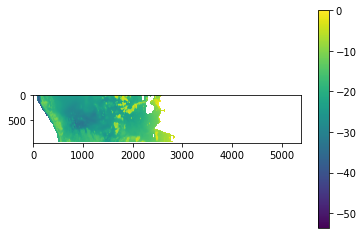

In [ ]:
# Visualize the reshaped zeroed_patches_test array
plt.imshow(reconstructed_test_area[:,:,12])
plt.colorbar()
plt.show()

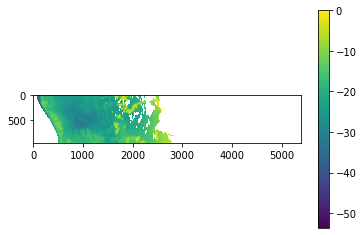

In [ ]:
# Visualize the reshaped zeroed_patches_test array
plt.imshow(image_2[:,:,12])
plt.colorbar()
plt.show()

In [ ]:
# Split the zeroed_patches array into inputs and targets
X_train = zeroed_patches_train[:, :, :, :-1]
y_train = zeroed_patches_train[:, :, :, -1]
y_train = tf.reshape(y_train, (-1, patch_size[0], patch_size[1], 1))

X_test = zeroed_patches_test[:, :, :, :-1]
y_test = zeroed_patches_test[:, :, :, -1]
y_test = tf.reshape(y_test, (-1, patch_size[0], patch_size[1], 1))

# # Calculate the number of samples in the validation set
val_samples = int(X_train.shape[0] * 0.25)

# # Split the training data into training and validation sets
X_val = X_train[-val_samples:, :, :, :]
y_val = y_train[-val_samples:, :, :, :]
X_train = X_train[:-val_samples, :, :, :]
y_train = y_train[:-val_samples, :, :, :]

In [ ]:
# BEST
# Define the model architecture
model = keras.Sequential([
    keras.layers.Conv2D(32, (3, 3), padding='same', activation='relu', input_shape=(16,16,12)),
    keras.layers.BatchNormalization(),
    keras.layers.Dropout(0.25),

    keras.layers.Conv2D(64, (3, 3), padding='same', activation='relu'),
    keras.layers.BatchNormalization(),
    keras.layers.Dropout(0.25),

    keras.layers.Conv2D(128, (3, 3), padding='same', activation='relu'),
    keras.layers.BatchNormalization(),

    keras.layers.Conv2D(256, (3, 3), padding='same', activation='relu'),
    keras.layers.BatchNormalization(),

    keras.layers.Conv2D(1, (1, 1), padding='same', activation='linear')
])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 16, 16, 32)        3488      
                                                                 
 batch_normalization (BatchN  (None, 16, 16, 32)       128       
 ormalization)                                                   
                                                                 
 dropout (Dropout)           (None, 16, 16, 32)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 16, 16, 64)        18496     
                                                                 
 batch_normalization_1 (Batc  (None, 16, 16, 64)       256       
 hNormalization)                                                 
                                                                 
 dropout_1 (Dropout)         (None, 16, 16, 64)        0

In [ ]:
import random
# Set random seed for NumPy
np.random.seed(1)
# Set random seed for Python's built-in random module
random.seed(1)
# Set random seed for TensorFlow
tf.random.set_seed(1)

keras.backend.clear_session()

model.compile(optimizer=keras.optimizers.Adam(lr=0.001), loss=masked_rmse)

# Train the model on the training data
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_val, y_val))

# Evaluate the model on the testing data
predictions = model.predict(X_test)
print(predictions.shape)

Epoch 1/100
605/605 [==============================] - 8s 9ms/step - loss: 5.4107 - val_loss: 3.5948
Epoch 2/100
605/605 [==============================] - 5s 8ms/step - loss: 2.8182 - val_loss: 6.6780
Epoch 3/100
605/605 [==============================] - 5s 8ms/step - loss: 2.6961 - val_loss: 6.2746
Epoch 4/100
605/605 [==============================] - 5s 8ms/step - loss: 2.6183 - val_loss: 2.7870
Epoch 5/100
605/605 [==============================] - 5s 8ms/step - loss: 2.5613 - val_loss: 2.5414
Epoch 6/100
605/605 [==============================] - 5s 8ms/step - loss: 2.4902 - val_loss: 4.8370
Epoch 7/100
605/605 [==============================] - 5s 8ms/step - loss: 2.4691 - val_loss: 3.3734
Epoch 8/100
605/605 [==============================] - 5s 8ms/step - loss: 2.4182 - val_loss: 2.4759
Epoch 9/100
605/605 [==============================] - 5s 8ms/step - loss: 2.3957 - val_loss: 2.5966
Epoch 10/100
605/605 [==============================] - 5s 8ms/step - loss: 2.3463 - val_lo

In [ ]:
predictions = np.array(predictions)
y_test = np.array(y_test)
print(predictions.shape)

# Calculate the RMSE
rmse = np.sqrt(np.nanmean((predictions - y_test) ** 2))
print('RMSE:', rmse)

y_test_flat = y_test.flatten()
predictions_flat = predictions.flatten()
df_pred = pd.DataFrame(predictions_flat)
df_test = pd.DataFrame(y_test_flat)
df = pd.concat([df_test, df_pred], axis =1)
df2 = df.dropna() # Remove NaN values
df2.columns = ['Reference','Predicted']
df2= df2[df2['Reference'] < 0] # set max ref depth
df2= df2[df2['Predicted'] > -50] # set max ref depth
df2= df2[df2['Predicted'] < 0] # set max ref depth

#df2= df2[df2['Reference'] > -10] # set max ref depth
#df2 = df2.dropna() # Remove NaN values
df3 = df2.reset_index(drop=True)
df3['Error'] = df3['Predicted'] - df3['Reference']
df3
# Metrics
rmse = mean_squared_error(df3.Reference, df3.Predicted, squared=False)
r2 = metrics.r2_score(df3.Reference, df3.Predicted)
mae = np.mean(abs(df3.Reference - df3.Predicted))
print('MAE:',mae)
print('RMSE', rmse)
print('R2:',r2)

(8736, 16, 16, 1)
RMSE: 6.5089934712426585
MAE: 2.983469672461101
RMSE 3.897662378047054
R2: 0.6649916554704001


In [ ]:
####### RESHAPE PREDICTIONS

# Get the shape of the original test area image
test_area_shape = image_2.shape

# Create a new array with the same shape as the test area image, filled with NaN values
reconstructed_test_area = np.full(test_area_shape, np.nan)

# Calculate the number of patches in each dimension
n_rows = (test_area_shape[0] - patch_size[0]) // patch_size[0] + 1
n_cols = (test_area_shape[1] - patch_size[1]) // patch_size[1] + 1

# Create a mask with True values for the removed patches
removed_mask = np.zeros((n_rows, n_cols), dtype=bool)
removed_mask[np.unravel_index(removed_indices, (n_rows, n_cols))] = True

# Loop over the patches and fill in the corresponding elements in the reconstructed test area
patch_index = 0
for i in range(0, test_area_shape[0] - patch_size[0] + 1, patch_size[0]):
    for j in range(0, test_area_shape[1] - patch_size[1] + 1, patch_size[1]):
        if not removed_mask[i // patch_size[0], j // patch_size[1]]:
            # If the patch was not removed, use the corresponding patch from zeroed_patches_test
            patch = predictions[patch_index, :, :, :]
            reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = patch
            patch_index += 1
        else:
            # If the patch was removed, fill in the corresponding region with NaNs
            reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = np.nan

pred_image_2 = reconstructed_test_area

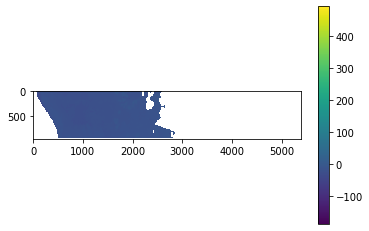

In [ ]:
# Visualize the reshaped zeroed_patches_test array
plt.imshow(reconstructed_test_area[:,:,12])
plt.colorbar()
plt.show()

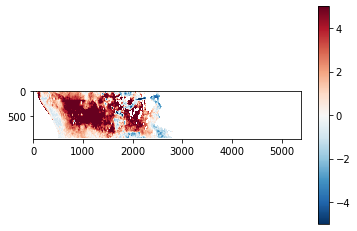

In [ ]:
error = reconstructed_test_area[:,:,12] - image2[1035:2000,:,12]

# Visualize the reshaped zeroed_patches_test array
import matplotlib.colors as mcolors
norm = mcolors.TwoSlopeNorm(vmin=-5, vmax = 5, vcenter=0)
pc = plt.imshow(error, norm=norm, cmap="RdBu_r")
plt.colorbar(pc)

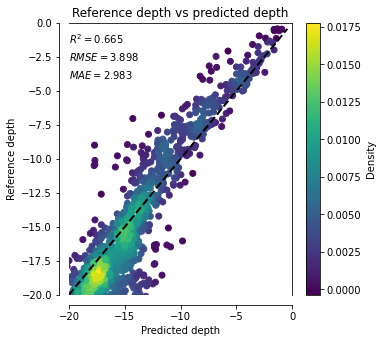

In [ ]:
df3_sample = df3.sample(n = 2000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-20,0])
    ax.set_ylim([-20,0])
    ax.set_xlabel("Predicted depth")
    ax.set_ylabel("Reference depth")
    ax.annotate("$R^2={:.3f}$".format(r2), (-20, -1.5))
    ax.annotate("$RMSE={:.3f}$".format(rmse), (-20, -2.8))
    ax.annotate("$MAE={:.3f}$".format(mae), (-20, -4.1))

    ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
    plt.title("Reference depth vs predicted depth")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('linear_regression.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Predicted'], df3_sample['Reference'], bins = [30,30])

### Image 3

In [ ]:
### IMAGE 2
image_no_3 = np.copy(image2)
# Set pixels in specified slice to NaN
image_no_3[2000:,:2800,:] = np.nan
image_3 = image2[2000:,:2800,:]


In [ ]:
# Define the patch size
patch_size = (16, 16, 13)

# Extract the patches for train area
patches_train = extract_patches(image_no_3, patch_size)
print('Number of patches:', patches_train.shape[0])
print('Patch shape:', patches_train.shape[1:])
# Remove patches with more than 70% NaN values
kept_patches_train, removed_indices = remove_patches_with_too_many_NaN(patches_train, threshold=0.7)
print(kept_patches_train.shape)
# Set the NaN values in the kept patches to 0
zeroed_patches_train = set_NaN_to_zero(kept_patches_train)
print(zeroed_patches_train.shape)

Number of patches: 79296
Patch shape: (16, 16, 13)
(26051, 16, 16, 13)
(26051, 16, 16, 13)


In [ ]:
# Extract the patches for test area
patches_test = extract_patches(image_3, patch_size)
print('Number of patches:', patches_test.shape[0])
print('Patch shape:', patches_test.shape[1:])
# Remove patches with more than 70% NaN values
kept_patches_test, removed_indices = remove_patches_with_too_many_NaN(patches_test, threshold=0.7)
print(kept_patches_test.shape)
# Set the NaN values in the kept patches to 0
zeroed_patches_test = set_NaN_to_zero(kept_patches_test)
print(zeroed_patches_test.shape)

Number of patches: 19425
Patch shape: (16, 16, 13)
(8486, 16, 16, 13)
(8486, 16, 16, 13)


In [ ]:
  # Get the shape of the original test area image
  test_area_shape = image_3.shape

  # Create a new array with the same shape as the test area image, filled with NaN values
  reconstructed_test_area = np.full(test_area_shape, np.nan)

  # Calculate the number of patches in each dimension
  n_rows = (test_area_shape[0] - patch_size[0]) // patch_size[0] + 1
  n_cols = (test_area_shape[1] - patch_size[1]) // patch_size[1] + 1

  # Create a mask with True values for the removed patches
  removed_mask = np.zeros((n_rows, n_cols), dtype=bool)
  removed_mask[np.unravel_index(removed_indices, (n_rows, n_cols))] = True

  # Loop over the patches and fill in the corresponding elements in the reconstructed test area
  patch_index = 0
  for i in range(0, test_area_shape[0] - patch_size[0] + 1, patch_size[0]):
      for j in range(0, test_area_shape[1] - patch_size[1] + 1, patch_size[1]):
          if not removed_mask[i // patch_size[0], j // patch_size[1]]:
              # If the patch was not removed, use the corresponding patch from zeroed_patches_test
              patch = zeroed_patches_test[patch_index, :, :, :]
              reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = patch
              patch_index += 1
          else:
              # If the patch was removed, fill in the corresponding region with NaNs
              reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = np.nan

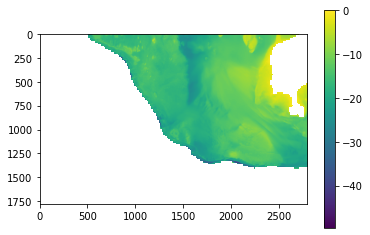

In [ ]:
# Visualize the reshaped zeroed_patches_test array
plt.imshow(reconstructed_test_area[:,:,12])
plt.colorbar()
plt.show()

In [ ]:
# Split the zeroed_patches array into inputs and targets
X_train = zeroed_patches_train[:, :, :, :-1]
y_train = zeroed_patches_train[:, :, :, -1]
y_train = tf.reshape(y_train, (-1, patch_size[0], patch_size[1], 1))

X_test = zeroed_patches_test[:, :, :, :-1]
y_test = zeroed_patches_test[:, :, :, -1]
y_test = tf.reshape(y_test, (-1, patch_size[0], patch_size[1], 1))

# # Calculate the number of samples in the validation set
val_samples = int(X_train.shape[0] * 0.25)

# # Split the training data into training and validation sets
X_val = X_train[-val_samples:, :, :, :]
y_val = y_train[-val_samples:, :, :, :]
X_train = X_train[:-val_samples, :, :, :]
y_train = y_train[:-val_samples, :, :, :]

In [ ]:
# BEST
# Define the model architecture
model = keras.Sequential([
    keras.layers.Conv2D(32, (3, 3), padding='same', activation='relu', input_shape=(16,16,12)),
    keras.layers.BatchNormalization(),
    keras.layers.Dropout(0.25),

    keras.layers.Conv2D(64, (3, 3), padding='same', activation='relu'),
    keras.layers.BatchNormalization(),
    keras.layers.Dropout(0.25),

    keras.layers.Conv2D(128, (3, 3), padding='same', activation='relu'),
    keras.layers.BatchNormalization(),

    keras.layers.Conv2D(256, (3, 3), padding='same', activation='relu'),
    keras.layers.BatchNormalization(),

    keras.layers.Conv2D(1, (1, 1), padding='same', activation='linear')
])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 16, 16, 32)        3488      
                                                                 
 batch_normalization (BatchN  (None, 16, 16, 32)       128       
 ormalization)                                                   
                                                                 
 dropout (Dropout)           (None, 16, 16, 32)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 16, 16, 64)        18496     
                                                                 
 batch_normalization_1 (Batc  (None, 16, 16, 64)       256       
 hNormalization)                                                 
                                                                 
 dropout_1 (Dropout)         (None, 16, 16, 64)        0

In [ ]:
import random
# Set random seed for NumPy
np.random.seed(1)
# Set random seed for Python's built-in random module
random.seed(1)
# Set random seed for TensorFlow
tf.random.set_seed(1)

keras.backend.clear_session()

model.compile(optimizer=keras.optimizers.Adam(lr=0.001), loss=masked_rmse)

# Train the model on the training data
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_val, y_val))

# Evaluate the model on the testing data
predictions = model.predict(X_test)
print(predictions.shape)

Epoch 1/100
611/611 [==============================] - 8s 9ms/step - loss: 6.3643 - val_loss: 3.9691
Epoch 2/100
611/611 [==============================] - 5s 9ms/step - loss: 3.2449 - val_loss: 8.3061
Epoch 3/100
611/611 [==============================] - 5s 8ms/step - loss: 3.0658 - val_loss: 3.9172
Epoch 4/100
611/611 [==============================] - 5s 9ms/step - loss: 2.9972 - val_loss: 3.4085
Epoch 5/100
611/611 [==============================] - 5s 8ms/step - loss: 2.9075 - val_loss: 7.6940
Epoch 6/100
611/611 [==============================] - 5s 9ms/step - loss: 2.8882 - val_loss: 3.9268
Epoch 7/100
611/611 [==============================] - 5s 9ms/step - loss: 2.7899 - val_loss: 4.0156
Epoch 8/100
611/611 [==============================] - 5s 8ms/step - loss: 2.7812 - val_loss: 3.5218
Epoch 9/100
611/611 [==============================] - 5s 9ms/step - loss: 2.7699 - val_loss: 3.5319
Epoch 10/100
611/611 [==============================] - 5s 8ms/step - loss: 2.7178 - val_lo

In [ ]:
predictions = np.array(predictions)
y_test = np.array(y_test)
print(predictions.shape)

# Calculate the RMSE
rmse = np.sqrt(np.nanmean((predictions - y_test) ** 2))
print('RMSE:', rmse)

y_test_flat = y_test.flatten()
predictions_flat = predictions.flatten()
df_pred = pd.DataFrame(predictions_flat)
df_test = pd.DataFrame(y_test_flat)
df = pd.concat([df_test, df_pred], axis =1)
df2 = df.dropna() # Remove NaN values
df2.columns = ['Reference','Predicted']
df2= df2[df2['Reference'] < 0] # set max ref depth
df2= df2[df2['Predicted'] > -50] # set max ref depth
df2= df2[df2['Predicted'] < 0] # set max ref depth

#df2= df2[df2['Reference'] > -10] # set max ref depth
#df2 = df2.dropna() # Remove NaN values
df3 = df2.reset_index(drop=True)
df3['Error'] = df3['Predicted'] - df3['Reference']
df3
# Metrics
rmse = mean_squared_error(df3.Reference, df3.Predicted, squared=False)
r2 = metrics.r2_score(df3.Reference, df3.Predicted)
mae = np.mean(abs(df3.Reference - df3.Predicted))
print('MAE:',mae)
print('RMSE', rmse)
print('R2:',r2)

(8486, 16, 16, 1)
RMSE: 5.353679901361183
MAE: 1.685331556134482
RMSE 2.1929793912000264
R2: 0.8138404893710359


In [ ]:
####### RESHAPE PREDICTIONS

# Get the shape of the original test area image
test_area_shape = image_3.shape

# Create a new array with the same shape as the test area image, filled with NaN values
reconstructed_test_area = np.full(test_area_shape, np.nan)

# Calculate the number of patches in each dimension
n_rows = (test_area_shape[0] - patch_size[0]) // patch_size[0] + 1
n_cols = (test_area_shape[1] - patch_size[1]) // patch_size[1] + 1

# Create a mask with True values for the removed patches
removed_mask = np.zeros((n_rows, n_cols), dtype=bool)
removed_mask[np.unravel_index(removed_indices, (n_rows, n_cols))] = True

# Loop over the patches and fill in the corresponding elements in the reconstructed test area
patch_index = 0
for i in range(0, test_area_shape[0] - patch_size[0] + 1, patch_size[0]):
    for j in range(0, test_area_shape[1] - patch_size[1] + 1, patch_size[1]):
        if not removed_mask[i // patch_size[0], j // patch_size[1]]:
            # If the patch was not removed, use the corresponding patch from zeroed_patches_test
            patch = predictions[patch_index, :, :, :]
            reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = patch
            patch_index += 1
        else:
            # If the patch was removed, fill in the corresponding region with NaNs
            reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = np.nan

pred_image_3 = reconstructed_test_area

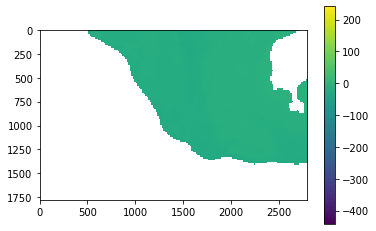

In [ ]:
# Visualize the reshaped zeroed_patches_test array
plt.imshow(reconstructed_test_area[:,:,12])
plt.colorbar()
plt.show()

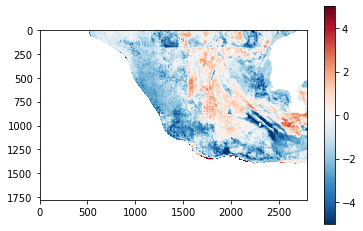

In [ ]:
error = reconstructed_test_area[:,:,12] - image2[2000:,:2800,12]
# Visualize the reshaped zeroed_patches_test array
import matplotlib.colors as mcolors
norm = mcolors.TwoSlopeNorm(vmin=-5, vmax = 5, vcenter=0)
pc = plt.imshow(error, norm=norm, cmap="RdBu_r")
plt.colorbar(pc)

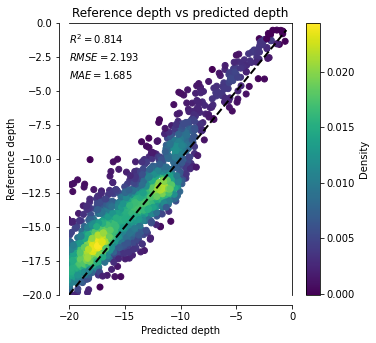

In [ ]:
df3_sample = df3.sample(n = 2000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-20,0])
    ax.set_ylim([-20,0])
    ax.set_xlabel("Predicted depth")
    ax.set_ylabel("Reference depth")
    ax.annotate("$R^2={:.3f}$".format(r2), (-20, -1.5))
    ax.annotate("$RMSE={:.3f}$".format(rmse), (-20, -2.8))
    ax.annotate("$MAE={:.3f}$".format(mae), (-20, -4.1))

    ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
    plt.title("Reference depth vs predicted depth")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('linear_regression.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Predicted'], df3_sample['Reference'], bins = [30,30])

### Image 4

In [ ]:
### IMAGE 4
image_no_4 = np.copy(image2)
image_no_4[2000:,2800:,:] = np.nan
image_4 = image2[2000:,2800:,:]

In [ ]:
# Define the patch size
patch_size = (16, 16, 13)

# Extract the patches for train area
patches_train = extract_patches(image_no_4, patch_size)
print('Number of patches:', patches_train.shape[0])
print('Patch shape:', patches_train.shape[1:])
# Remove patches with more than 70% NaN values
kept_patches_train, removed_indices = remove_patches_with_too_many_NaN(patches_train, threshold=0.7)
print(kept_patches_train.shape)
# Set the NaN values in the kept patches to 0
zeroed_patches_train = set_NaN_to_zero(kept_patches_train)
print(zeroed_patches_train.shape)

Number of patches: 79296
Patch shape: (16, 16, 13)
(25960, 16, 16, 13)
(25960, 16, 16, 13)


In [ ]:
# Extract the patches for test area
patches_test = extract_patches(image_4, patch_size)
print('Number of patches:', patches_test.shape[0])
print('Patch shape:', patches_test.shape[1:])
# Remove patches with more than 70% NaN values
kept_patches_test, removed_indices = remove_patches_with_too_many_NaN(patches_test, threshold=0.7)
print(kept_patches_test.shape)
# Set the NaN values in the kept patches to 0
zeroed_patches_test = set_NaN_to_zero(kept_patches_test)
print(zeroed_patches_test.shape)

Number of patches: 17871
Patch shape: (16, 16, 13)
(8577, 16, 16, 13)
(8577, 16, 16, 13)


In [ ]:
  # Get the shape of the original test area image
  test_area_shape = image_4.shape

  # Create a new array with the same shape as the test area image, filled with NaN values
  reconstructed_test_area = np.full(test_area_shape, np.nan)

  # Calculate the number of patches in each dimension
  n_rows = (test_area_shape[0] - patch_size[0]) // patch_size[0] + 1
  n_cols = (test_area_shape[1] - patch_size[1]) // patch_size[1] + 1

  # Create a mask with True values for the removed patches
  removed_mask = np.zeros((n_rows, n_cols), dtype=bool)
  removed_mask[np.unravel_index(removed_indices, (n_rows, n_cols))] = True

  # Loop over the patches and fill in the corresponding elements in the reconstructed test area
  patch_index = 0
  for i in range(0, test_area_shape[0] - patch_size[0] + 1, patch_size[0]):
      for j in range(0, test_area_shape[1] - patch_size[1] + 1, patch_size[1]):
          if not removed_mask[i // patch_size[0], j // patch_size[1]]:
              # If the patch was not removed, use the corresponding patch from zeroed_patches_test
              patch = zeroed_patches_test[patch_index, :, :, :]
              reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = patch
              patch_index += 1
          else:
              # If the patch was removed, fill in the corresponding region with NaNs
              reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = np.nan

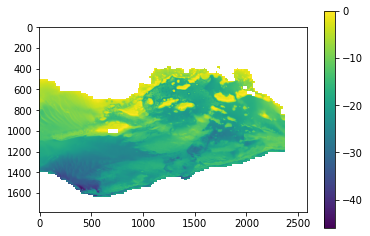

In [ ]:
# Visualize the reshaped zeroed_patches_test array
plt.imshow(reconstructed_test_area[:,:,12])
plt.colorbar()
plt.show()

In [ ]:
# Split the zeroed_patches array into inputs and targets
X_train = zeroed_patches_train[:, :, :, :-1]
y_train = zeroed_patches_train[:, :, :, -1]
y_train = tf.reshape(y_train, (-1, patch_size[0], patch_size[1], 1))

X_test = zeroed_patches_test[:, :, :, :-1]
y_test = zeroed_patches_test[:, :, :, -1]
y_test = tf.reshape(y_test, (-1, patch_size[0], patch_size[1], 1))

# # Calculate the number of samples in the validation set
val_samples = int(X_train.shape[0] * 0.25)

# # Split the training data into training and validation sets
X_val = X_train[-val_samples:, :, :, :]
y_val = y_train[-val_samples:, :, :, :]
X_train = X_train[:-val_samples, :, :, :]
y_train = y_train[:-val_samples, :, :, :]

In [ ]:
# BEST
# Define the model architecture
model = keras.Sequential([
    keras.layers.Conv2D(32, (3, 3), padding='same', activation='relu', input_shape=(16,16,12)),
    keras.layers.BatchNormalization(),
    keras.layers.Dropout(0.25),

    keras.layers.Conv2D(64, (3, 3), padding='same', activation='relu'),
    keras.layers.BatchNormalization(),
    keras.layers.Dropout(0.25),

    keras.layers.Conv2D(128, (3, 3), padding='same', activation='relu'),
    keras.layers.BatchNormalization(),

    keras.layers.Conv2D(256, (3, 3), padding='same', activation='relu'),
    keras.layers.BatchNormalization(),

    keras.layers.Conv2D(1, (1, 1), padding='same', activation='linear')
])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 16, 16, 32)        3488      
                                                                 
 batch_normalization (BatchN  (None, 16, 16, 32)       128       
 ormalization)                                                   
                                                                 
 dropout (Dropout)           (None, 16, 16, 32)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 16, 16, 64)        18496     
                                                                 
 batch_normalization_1 (Batc  (None, 16, 16, 64)       256       
 hNormalization)                                                 
                                                                 
 dropout_1 (Dropout)         (None, 16, 16, 64)        0

In [ ]:
import random
# Set random seed for NumPy
np.random.seed(1)
# Set random seed for Python's built-in random module
random.seed(1)
# Set random seed for TensorFlow
tf.random.set_seed(1)

keras.backend.clear_session()

model.compile(optimizer=keras.optimizers.Adam(lr=0.001), loss=masked_rmse)

# Train the model on the training data
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_val, y_val))

# Evaluate the model on the testing data
predictions = model.predict(X_test)
print(predictions.shape)

Epoch 1/100
609/609 [==============================] - 8s 9ms/step - loss: 6.5199 - val_loss: 5.2791
Epoch 2/100
609/609 [==============================] - 5s 8ms/step - loss: 3.1528 - val_loss: 2.2189
Epoch 3/100
609/609 [==============================] - 5s 8ms/step - loss: 2.9760 - val_loss: 4.4708
Epoch 4/100
609/609 [==============================] - 5s 9ms/step - loss: 2.8787 - val_loss: 3.9444
Epoch 5/100
609/609 [==============================] - 5s 8ms/step - loss: 2.8981 - val_loss: 4.0096
Epoch 6/100
609/609 [==============================] - 5s 8ms/step - loss: 2.7607 - val_loss: 4.1772
Epoch 7/100
609/609 [==============================] - 5s 8ms/step - loss: 2.7064 - val_loss: 2.3277
Epoch 8/100
609/609 [==============================] - 5s 8ms/step - loss: 2.7158 - val_loss: 3.2725
Epoch 9/100
609/609 [==============================] - 5s 8ms/step - loss: 2.6671 - val_loss: 1.8119
Epoch 10/100
609/609 [==============================] - 5s 8ms/step - loss: 2.6399 - val_lo

In [ ]:
predictions = np.array(predictions)
y_test = np.array(y_test)
print(predictions.shape)

# Calculate the RMSE
rmse = np.sqrt(np.nanmean((predictions - y_test) ** 2))
print('RMSE:', rmse)

y_test_flat = y_test.flatten()
predictions_flat = predictions.flatten()
df_pred = pd.DataFrame(predictions_flat)
df_test = pd.DataFrame(y_test_flat)
df = pd.concat([df_test, df_pred], axis =1)
df2 = df.dropna() # Remove NaN values
df2.columns = ['Reference','Predicted']
df2= df2[df2['Reference'] < 0] # set max ref depth
df2= df2[df2['Predicted'] > -50] # set max ref depth
df2= df2[df2['Predicted'] < 0] # set max ref depth

#df2= df2[df2['Reference'] > -10] # set max ref depth
#df2 = df2.dropna() # Remove NaN values
df3 = df2.reset_index(drop=True)
df3['Error'] = df3['Predicted'] - df3['Reference']
df3
# Metrics
rmse = mean_squared_error(df3.Reference, df3.Predicted, squared=False)
r2 = metrics.r2_score(df3.Reference, df3.Predicted)
mae = np.mean(abs(df3.Reference - df3.Predicted))
print('MAE:',mae)
print('RMSE', rmse)
print('R2:',r2)

(8577, 16, 16, 1)
RMSE: 12.645155976503654
MAE: 2.2506918797943154
RMSE 2.9815732441739518
R2: 0.8417545146432742


In [ ]:
####### RESHAPE PREDICTIONS

# Get the shape of the original test area image
test_area_shape = image_4.shape

# Create a new array with the same shape as the test area image, filled with NaN values
reconstructed_test_area = np.full(test_area_shape, np.nan)

# Calculate the number of patches in each dimension
n_rows = (test_area_shape[0] - patch_size[0]) // patch_size[0] + 1
n_cols = (test_area_shape[1] - patch_size[1]) // patch_size[1] + 1

# Create a mask with True values for the removed patches
removed_mask = np.zeros((n_rows, n_cols), dtype=bool)
removed_mask[np.unravel_index(removed_indices, (n_rows, n_cols))] = True

# Loop over the patches and fill in the corresponding elements in the reconstructed test area
patch_index = 0
for i in range(0, test_area_shape[0] - patch_size[0] + 1, patch_size[0]):
    for j in range(0, test_area_shape[1] - patch_size[1] + 1, patch_size[1]):
        if not removed_mask[i // patch_size[0], j // patch_size[1]]:
            # If the patch was not removed, use the corresponding patch from zeroed_patches_test
            patch = predictions[patch_index, :, :, :]
            reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = patch
            patch_index += 1
        else:
            # If the patch was removed, fill in the corresponding region with NaNs
            reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = np.nan

pred_image_4 = reconstructed_test_area

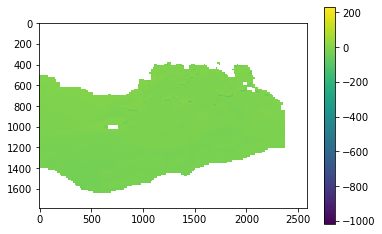

In [ ]:
# Visualize the reshaped zeroed_patches_test array
plt.imshow(reconstructed_test_area[:,:,12])
plt.colorbar()
plt.show()

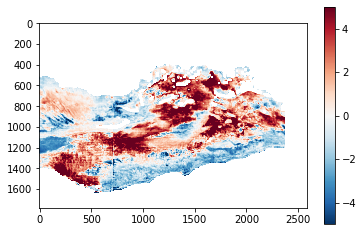

In [ ]:
error = reconstructed_test_area[:,:,12] - image2[2000:,2800:,12]

# Visualize the reshaped zeroed_patches_test array
import matplotlib.colors as mcolors
norm = mcolors.TwoSlopeNorm(vmin=-5, vmax = 5, vcenter=0)
pc = plt.imshow(error, norm=norm, cmap="RdBu_r")
plt.colorbar(pc)

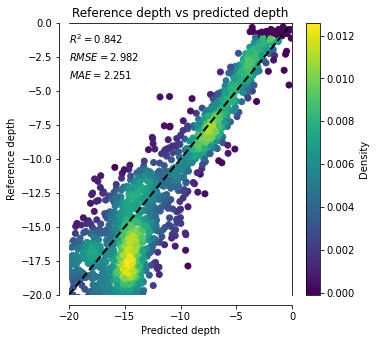

In [ ]:
df3_sample = df3.sample(n = 2000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-20,0])
    ax.set_ylim([-20,0])
    ax.set_xlabel("Predicted depth")
    ax.set_ylabel("Reference depth")
    ax.annotate("$R^2={:.3f}$".format(r2), (-20, -1.5))
    ax.annotate("$RMSE={:.3f}$".format(rmse), (-20, -2.8))
    ax.annotate("$MAE={:.3f}$".format(mae), (-20, -4.1))

    ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
    plt.title("Reference depth vs predicted depth")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('linear_regression.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Predicted'], df3_sample['Reference'], bins = [30,30])

### Reshape predictions

In [ ]:
print(pred_image_1.shape)
print(pred_image_2.shape)
print(pred_image_3.shape)
print(pred_image_4.shape)

(965, 5389, 13)
(965, 5389, 13)
(1783, 2800, 13)
(1783, 2589, 13)


In [ ]:
print(image_1.shape)
print(image_2.shape)
print(image_3.shape)
print(image_4.shape)

(965, 5389, 13)
(965, 5389, 13)
(1783, 2800, 13)
(1783, 2589, 13)


(3860, 5389)


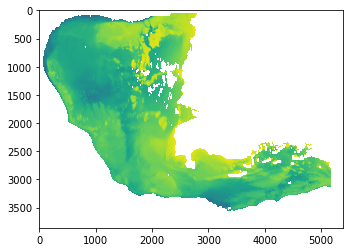

In [ ]:
ref_image_1 = image_1[:,:,-1]
ref_image_2 = image_2[:,:,-1]
ref_image_3 = image_3[:,:,-1]
ref_image_4 = image_4[:,:,-1]

ref_1_2 = np.concatenate((ref_image_1, ref_image_2), axis = 0)

ref_image_4_pad = np.pad(ref_image_4, [(0,0), (0,211)], 'constant', constant_values=(np.nan,))
ref_3_4 = np.concatenate((ref_image_3, ref_image_4_pad), axis = 1)
ref_3_4 = np.pad(ref_3_4, [(0,147), (0,0)], 'constant', constant_values=(np.nan,))
ref_3_4 = ref_3_4[:,0:5389]

ref_all = np.concatenate((ref_1_2, ref_3_4), axis = 0)
print(ref_all.shape)
pc = plt.imshow(ref_all)

In [ ]:
pred_image_1 = pred_image_1[:,:,-1]
pred_image_2 = pred_image_2[:,:,-1]
pred_image_3 = pred_image_3[:,:,-1]
pred_image_4 = pred_image_4[:,:,-1]

In [ ]:
print(pred_image_1.shape)
print(pred_image_2.shape)
print(pred_image_3.shape)
print(pred_image_4.shape)

(965, 5389)
(965, 5389)
(1783, 2800)
(1783, 2589)


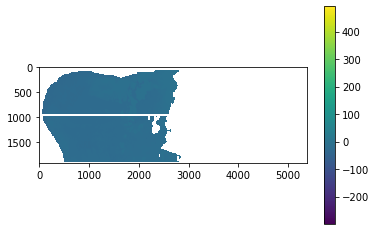

In [ ]:
y_pred_1_2 = np.concatenate((pred_image_1, pred_image_2), axis = 0)
pc = plt.imshow(y_pred_1_2)
plt.colorbar(pc)

In [ ]:
pred_image_4_pad = np.pad(pred_image_4, [(0,0), (0,211)], 'constant', constant_values=(np.nan,))

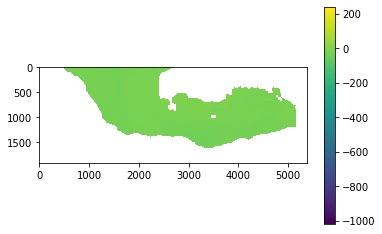

In [ ]:
y_pred_3_4 = np.concatenate((pred_image_3, pred_image_4_pad), axis = 1)
y_pred_3_4 = np.pad(y_pred_3_4, [(0,147), (0,0)], 'constant', constant_values=(np.nan,))
y_pred_3_4 = y_pred_3_4[:,0:5389]
pc = plt.imshow(y_pred_3_4)
plt.colorbar(pc)

In [ ]:
y_pred_all = np.concatenate((y_pred_1_2, y_pred_3_4), axis = 0)
y_pred_all.shape

(3860, 5389)

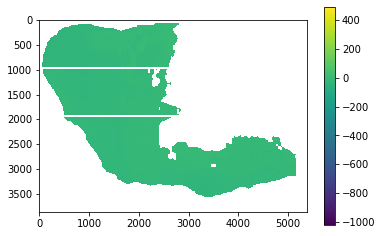

In [ ]:
pc = plt.imshow(y_pred_all)
plt.colorbar(pc)

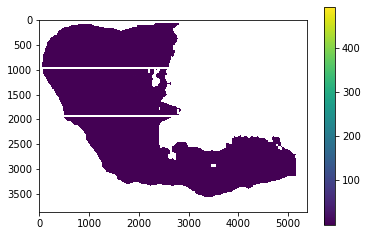

In [ ]:
y_pred_mask = y_pred_all.copy()

y_pred_mask[y_pred_mask <= 0] = 1
pc = plt.imshow(y_pred_mask)
plt.colorbar(pc)


In [ ]:
ref_all_masked = ref_all * y_pred_mask

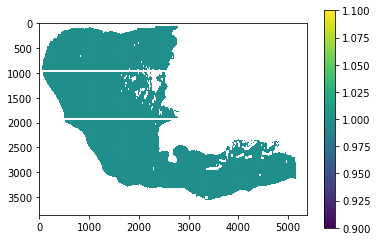

In [ ]:
ref_mask = ref_all_masked.copy()

ref_mask[ref_mask <= 0] = 1
pc = plt.imshow(ref_mask)
plt.colorbar(pc)

In [ ]:
y_pred_all_masked = y_pred_all * ref_mask

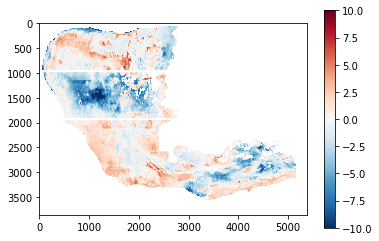

In [ ]:
error = ref_all_masked - y_pred_all_masked

# Visualize the reshaped zeroed_patches_test array
import matplotlib.colors as mcolors
norm = mcolors.TwoSlopeNorm(vmin=-10, vmax = 10, vcenter=0)
pc = plt.imshow(error, norm=norm, cmap="RdBu_r")
plt.colorbar(pc)

In [ ]:
np.save('/content/drive/My Drive/Metrics/S2_CNN_median_unlimited.npy', y_pred_all_masked)

In [ ]:
np.save('/content/drive/My Drive/Metrics/S2_CNN_error_unlimited.npy', error)

In [ ]:
np.save('/content/drive/My Drive/Metrics/S2_CNN_reference_unlimited.npy', ref_all_masked)

In [ ]:
predictions = np.array(y_pred_all_masked)
y_test = np.array(ref_all_masked)
print(predictions.shape)

# Calculate the RMSE
rmse = np.sqrt(np.nanmean((predictions - y_test) ** 2))
print('RMSE:', rmse)

y_test_flat = y_test.flatten()
predictions_flat = predictions.flatten()
df_pred = pd.DataFrame(predictions_flat)
df_test = pd.DataFrame(y_test_flat)
df = pd.concat([df_test, df_pred], axis =1)
df2 = df.dropna() # Remove NaN values
df2.columns = ['Reference','Predicted']
df2= df2[df2['Reference'] < 0] # set max ref depth
df2= df2[df2['Predicted'] > -50] # set max ref depth
#df2= df2[df2['Reference'] > -20] # set max ref depth

df2= df2[df2['Predicted'] < 0] # set max ref depth

#df2= df2[df2['Reference'] > -10] # set max ref depth
#df2 = df2.dropna() # Remove NaN values
df3 = df2.reset_index(drop=True)
df3['Error'] = df3['Predicted'] - df3['Reference']
df3
# Metrics
rmse = mean_squared_error(df3.Reference, df3.Predicted, squared=False)
r2 = metrics.r2_score(df3.Reference, df3.Predicted)
mae = np.mean(abs(df3.Reference - df3.Predicted))
print('MAE:',mae)
print('RMSE', rmse)
print('R2:',r2)

(3860, 5389)
RMSE: 3.1495736327074115
MAE: 2.2793769137085236
RMSE 3.143150598678427
R2: 0.8206950401955727


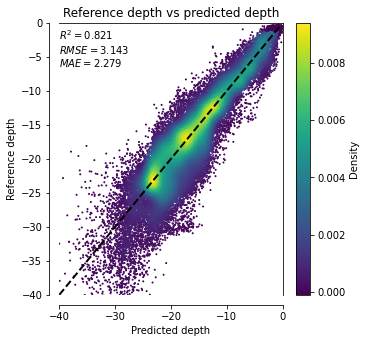

In [ ]:
df3_sample = df3.sample(n = 50000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-40,0])
    ax.set_ylim([-40,0])
    ax.set_xlabel("Predicted depth")
    ax.set_ylabel("Reference depth")
    ax.annotate("$R^2={:.3f}$".format(r2), (-40, -2.5))
    ax.annotate("$RMSE={:.3f}$".format(rmse), (-40, -4.5))
    ax.annotate("$MAE={:.3f}$".format(mae), (-40, -6.5))

    ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
    plt.title("Reference depth vs predicted depth")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('linear_regression.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Predicted'], df3_sample['Reference'], bins = [30,30], s = 1)

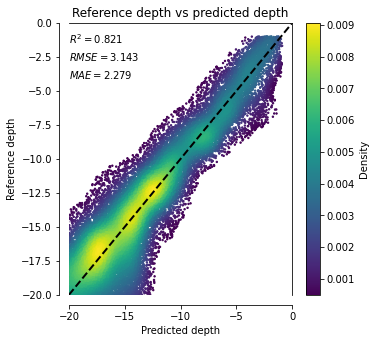

In [ ]:
df3_sample = df3.sample(n = 50000)

def density_scatter(x, y, threshold=0, ax=None, sort=True, bins=20, **kwargs):
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None:
        fig, ax = plt.subplots(figsize=(5, 5))
    data, x_e, y_e = np.histogram2d(x, y, bins=bins, density=True)
    z = interpn((0.5*(x_e[1:]+x_e[:-1]), 0.5*(y_e[1:]+y_e[:-1])), data, np.vstack([x, y]).T,
                method="splinef2d", bounds_error=False)

    # Filter pixels based on density threshold
    mask = z >= threshold
    x = x[mask]
    y = y[mask]
    z = z[mask]

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs)
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-20, 0])
    ax.set_ylim([-20, 0])
    ax.set_xlabel("Predicted depth")
    ax.set_ylabel("Reference depth")

    # Calculate regression metrics and add to plot
    ax.annotate("$R^2={:.3f}$".format(r2), (-20, -1.5))
    ax.annotate("$RMSE={:.3f}$".format(rmse), (-20, -2.8))
    ax.annotate("$MAE={:.3f}$".format(mae), (-20, -4.1))

    ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
    plt.title("Reference depth vs predicted depth")

    norm = Normalize(vmin=np.min(z), vmax=np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm=norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('linear_regression.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__:
    density_scatter(df3_sample['Predicted'], df3_sample['Reference'], threshold=0.0005, bins=[30, 30], s=2)


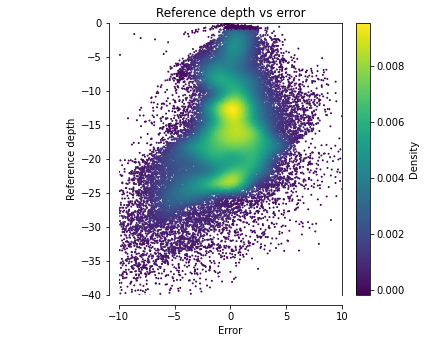

In [ ]:
# Depth vs error
#error.shape (1400,1400)
#reference.shape (1400, 1400)

error_flatten = error.flatten()
reference_flatten = ref_all_masked.flatten()

reference_df = pd.DataFrame(reference_flatten)
error_df = pd.DataFrame(error_flatten)

df = pd.concat([reference_df, error_df], axis=1) # Concatenate both dataframes
df2 = df.dropna() # Remove NaN values
df2.columns = ['Reference','Error']
df3 = df2.reset_index(drop=True)

df3_sample = df3.sample(n = 50000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-10,10])
    ax.set_ylim([-40,0])
    ax.set_xlabel("Error")
    ax.set_ylabel("Reference depth")
    ax.annotate("$R^2={:.3f}$".format(r2), (-20, -1.5))
    ax.annotate("$RMSE={:.3f}$".format(rmse), (-20, -2.8))
    ax.annotate("$MAE={:.3f}$".format(mae), (-20, -4.1))

    #ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
    plt.title("Reference depth vs error")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('linear_regression.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Error'], df3_sample['Reference'], bins = [30,30], s = 1)

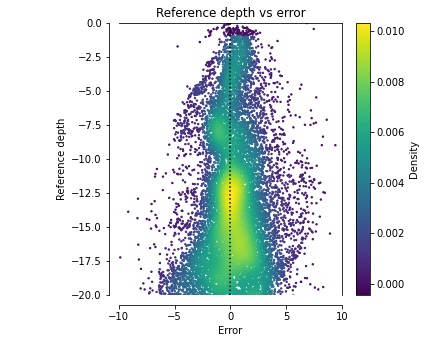

In [ ]:
df3_sample = df3.sample(n = 20000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-10,10])
    ax.set_ylim([-20,0])
    ax.set_xlabel("Error")
    ax.set_ylabel("Reference depth")
    ax.annotate("$R^2={:.3f}$".format(r2), (-20, -1.5))
    ax.annotate("$RMSE={:.3f}$".format(rmse), (-20, -2.8))
    ax.annotate("$MAE={:.3f}$".format(mae), (-20, -4.1))

    #ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
    plt.title("Reference depth vs error")
    plt.axvline(x=0, color='k', linestyle=':', label='axvline - dotted')
    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('linear_regression.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Error'], df3_sample['Reference'], bins = [30,30], s =2)

## 2D CNN Change depths larger than 20 to 0 within each patch

In [ ]:
image2.shape

(3783, 5389, 13)

In [ ]:
image_20 = image2

In [ ]:
def clean_image(image):
    # Create a mask for the pixels where the last band is less than -20
    mask = image[:, :, 12] < -20
    image[mask, :] = np.nan
    return image

In [ ]:
image_20 = clean_image(image_20)
image_20 = np.transpose(image_20, (2, 0, 1))
image_20 = remove_nan(image_20)

In [ ]:
image_20 = np.transpose(image_20, (1, 2, 0))
image_20.shape

(3783, 5389, 13)

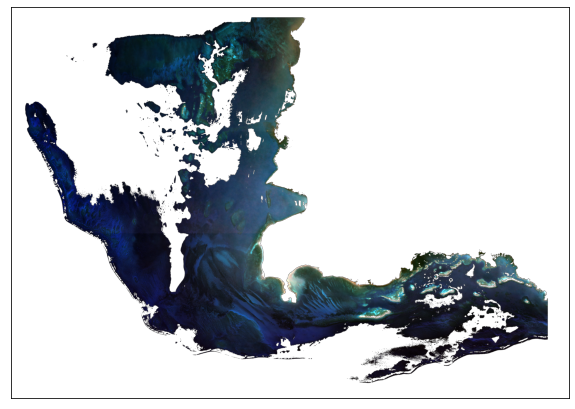

In [ ]:
image_t = np.transpose(image_20, (2, 0, 1))

ep.plot_rgb(image_t,
            rgb=(3, 2, 1),
            stretch=True,
            str_clip=0.2,
            figsize=(10, 16))
plt.show()

In [ ]:
image2 = image_20

In [ ]:
image_20 = image2

In [ ]:
# Take only the first 12 bands of image_20
image_20_data = image_20[:, :, :12]

# Create a mask for the pixels where band 13 is less than -20
mask = image_20[:, :, 12] < -20

# Set the values of these pixels to 0 for all bands
image_20_data[mask, :] = 0

# Concatenate the data with the modified band 13
image_20_cleaned = np.concatenate((image_20_data, np.expand_dims(image_20[:, :, 12], axis=-1)), axis=-1)

# Assign the cleaned data to the original image_20 array
image_20[:, :, :13] = image_20_cleaned
image_20[image_20 == 0] = np.nan

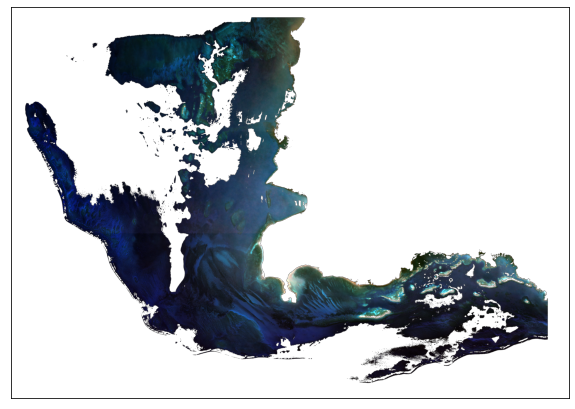

In [ ]:
image_t = np.transpose(image_20, (2, 0, 1))

ep.plot_rgb(image_t,
            rgb=(3, 2, 1),
            stretch=True,
            str_clip=0.2,
            figsize=(10, 16))
plt.show()

In [ ]:
def clean_image(image):
    # Create a mask for the pixels where the last band is less than -20
    mask = image[:, :, 12] < -20

    # Set the values of these pixels to 0 for all bands except the last one
    image[mask, :] = np.nan

    return image

### Image 1

In [ ]:
## IMAGE 1
image_no_1 = np.copy(image2)
# Set pixels in specified slice to NaN
image_no_1[70:1035,:, :] = np.nan

# Train set
image_1 = image2[70:1035,:, :]


In [ ]:
# Define the patch size
patch_size = (16, 16, 13)

# Extract the patches for train area
patches_train = extract_patches(image_no_1, patch_size)
print('Number of patches:', patches_train.shape[0])
print('Patch shape:', patches_train.shape[1:])
# Remove patches with more than 70% NaN values
kept_patches_train, removed_indices = remove_patches_with_too_many_NaN(patches_train, threshold=0.7)
print(kept_patches_train.shape)
# Set the NaN values in the kept patches to 0
zeroed_patches_train = set_NaN_to_zero(kept_patches_train)
print(zeroed_patches_train.shape)

Number of patches: 79296
Patch shape: (16, 16, 13)
(18607, 16, 16, 13)
(18607, 16, 16, 13)


In [ ]:
# Extract the patches for test area
patches_test = extract_patches(image_1, patch_size)
print('Number of patches:', patches_test.shape[0])
print('Patch shape:', patches_test.shape[1:])
# Remove patches with more than 70% NaN values
kept_patches_test, removed_indices = remove_patches_with_too_many_NaN(patches_test, threshold=0.7)
print(kept_patches_test.shape)
# Set the NaN values in the kept patches to 0
zeroed_patches_test = set_NaN_to_zero(kept_patches_test)
print(zeroed_patches_test.shape)

Number of patches: 20160
Patch shape: (16, 16, 13)
(4849, 16, 16, 13)
(4849, 16, 16, 13)


In [ ]:
  # Get the shape of the original test area image
  test_area_shape = image_1.shape

  # Create a new array with the same shape as the test area image, filled with NaN values
  reconstructed_test_area = np.full(test_area_shape, np.nan)

  # Calculate the number of patches in each dimension
  n_rows = (test_area_shape[0] - patch_size[0]) // patch_size[0] + 1
  n_cols = (test_area_shape[1] - patch_size[1]) // patch_size[1] + 1

  # Create a mask with True values for the removed patches
  removed_mask = np.zeros((n_rows, n_cols), dtype=bool)
  removed_mask[np.unravel_index(removed_indices, (n_rows, n_cols))] = True

  # Loop over the patches and fill in the corresponding elements in the reconstructed test area
  patch_index = 0
  for i in range(0, test_area_shape[0] - patch_size[0] + 1, patch_size[0]):
      for j in range(0, test_area_shape[1] - patch_size[1] + 1, patch_size[1]):
          if not removed_mask[i // patch_size[0], j // patch_size[1]]:
              # If the patch was not removed, use the corresponding patch from zeroed_patches_test
              patch = zeroed_patches_test[patch_index, :, :, :]
              reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = patch
              patch_index += 1
          else:
              # If the patch was removed, fill in the corresponding region with NaNs
              reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = np.nan

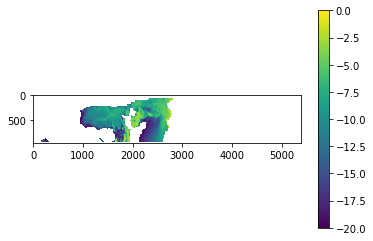

In [ ]:
# Visualize the reshaped zeroed_patches_test array
plt.imshow(reconstructed_test_area[:,:,12])
plt.colorbar()
plt.show()

In [ ]:
# Split the zeroed_patches array into inputs and targets
X_train = zeroed_patches_train[:, :, :, :-1]
y_train = zeroed_patches_train[:, :, :, -1]
y_train = tf.reshape(y_train, (-1, patch_size[0], patch_size[1], 1))

X_test = zeroed_patches_test[:, :, :, :-1]
y_test = zeroed_patches_test[:, :, :, -1]
y_test = tf.reshape(y_test, (-1, patch_size[0], patch_size[1], 1))

# # Calculate the number of samples in the validation set
val_samples = int(X_train.shape[0] * 0.25)

# # Split the training data into training and validation sets
X_val = X_train[-val_samples:, :, :, :]
y_val = y_train[-val_samples:, :, :, :]
X_train = X_train[:-val_samples, :, :, :]
y_train = y_train[:-val_samples, :, :, :]

In [ ]:
# BEST
# Define the model architecture
model = keras.Sequential([
    keras.layers.Conv2D(32, (3, 3), padding='same', activation='relu', input_shape=(16,16,12)),
    keras.layers.BatchNormalization(),
    keras.layers.Dropout(0.25),

    keras.layers.Conv2D(64, (3, 3), padding='same', activation='relu'),
    keras.layers.BatchNormalization(),
    keras.layers.Dropout(0.25),

    keras.layers.Conv2D(128, (3, 3), padding='same', activation='relu'),
    keras.layers.BatchNormalization(),

    keras.layers.Conv2D(256, (3, 3), padding='same', activation='relu'),
    keras.layers.BatchNormalization(),

    keras.layers.Conv2D(1, (1, 1), padding='same', activation='linear')
])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 16, 16, 32)        3488      
                                                                 
 batch_normalization (BatchN  (None, 16, 16, 32)       128       
 ormalization)                                                   
                                                                 
 dropout (Dropout)           (None, 16, 16, 32)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 16, 16, 64)        18496     
                                                                 
 batch_normalization_1 (Batc  (None, 16, 16, 64)       256       
 hNormalization)                                                 
                                                                 
 dropout_1 (Dropout)         (None, 16, 16, 64)        0

In [ ]:
import random
# Set random seed for NumPy
np.random.seed(1)
# Set random seed for Python's built-in random module
random.seed(1)
# Set random seed for TensorFlow
tf.random.set_seed(1)

keras.backend.clear_session()

model.compile(optimizer=keras.optimizers.Adam(lr=0.001), loss=masked_rmse)

# Train the model on the training data
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_val, y_val))

# Evaluate the model on the testing data
predictions = model.predict(X_test)
print(predictions.shape)

Epoch 1/100
437/437 [==============================] - 17s 10ms/step - loss: 4.0408 - val_loss: 4.1592
Epoch 2/100
437/437 [==============================] - 4s 9ms/step - loss: 2.1598 - val_loss: 3.1045
Epoch 3/100
437/437 [==============================] - 4s 9ms/step - loss: 2.0518 - val_loss: 1.5299
Epoch 4/100
437/437 [==============================] - 4s 9ms/step - loss: 1.9897 - val_loss: 3.2863
Epoch 5/100
437/437 [==============================] - 4s 9ms/step - loss: 1.8883 - val_loss: 3.4574
Epoch 6/100
437/437 [==============================] - 4s 9ms/step - loss: 1.8923 - val_loss: 1.8454
Epoch 7/100
437/437 [==============================] - 4s 9ms/step - loss: 1.8339 - val_loss: 2.3518
Epoch 8/100
437/437 [==============================] - 4s 9ms/step - loss: 1.7808 - val_loss: 1.4469
Epoch 9/100
437/437 [==============================] - 4s 9ms/step - loss: 1.7826 - val_loss: 2.2339
Epoch 10/100
437/437 [==============================] - 4s 9ms/step - loss: 1.7469 - val_

In [ ]:
predictions = np.array(predictions)
y_test = np.array(y_test)
print(predictions.shape)

# Calculate the RMSE
rmse = np.sqrt(np.nanmean((predictions - y_test) ** 2))
print('RMSE:', rmse)

y_test_flat = y_test.flatten()
predictions_flat = predictions.flatten()
df_pred = pd.DataFrame(predictions_flat)
df_test = pd.DataFrame(y_test_flat)
df = pd.concat([df_test, df_pred], axis =1)
df2 = df.dropna() # Remove NaN values
df2.columns = ['Reference','Predicted']
df2= df2[df2['Reference'] < 0] # set max ref depth
df2= df2[df2['Predicted'] > -50] # set max ref depth
df2= df2[df2['Predicted'] < 0] # set max ref depth

#df2= df2[df2['Reference'] > -10] # set max ref depth
#df2 = df2.dropna() # Remove NaN values
df3 = df2.reset_index(drop=True)
df3['Error'] = df3['Predicted'] - df3['Reference']
df3
# Metrics
rmse = mean_squared_error(df3.Reference, df3.Predicted, squared=False)
r2 = metrics.r2_score(df3.Reference, df3.Predicted)
mae = np.mean(abs(df3.Reference - df3.Predicted))
print('MAE:',mae)
print('RMSE', rmse)
print('R2:',r2)

(4849, 16, 16, 1)
RMSE: 3.8632398497206113
MAE: 1.242096582447
RMSE 1.638910820718257
R2: 0.881864479006901


In [ ]:
####### RESHAPE PREDICTIONS

# Get the shape of the original test area image
test_area_shape = image_1.shape

# Create a new array with the same shape as the test area image, filled with NaN values
reconstructed_test_area = np.full(test_area_shape, np.nan)

# Calculate the number of patches in each dimension
n_rows = (test_area_shape[0] - patch_size[0]) // patch_size[0] + 1
n_cols = (test_area_shape[1] - patch_size[1]) // patch_size[1] + 1

# Create a mask with True values for the removed patches
removed_mask = np.zeros((n_rows, n_cols), dtype=bool)
removed_mask[np.unravel_index(removed_indices, (n_rows, n_cols))] = True

# Loop over the patches and fill in the corresponding elements in the reconstructed test area
patch_index = 0
for i in range(0, test_area_shape[0] - patch_size[0] + 1, patch_size[0]):
    for j in range(0, test_area_shape[1] - patch_size[1] + 1, patch_size[1]):
        if not removed_mask[i // patch_size[0], j // patch_size[1]]:
            # If the patch was not removed, use the corresponding patch from zeroed_patches_test
            patch = predictions[patch_index, :, :, :]
            reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = patch
            patch_index += 1
        else:
            # If the patch was removed, fill in the corresponding region with NaNs
            reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = np.nan

pred_image_1 = reconstructed_test_area

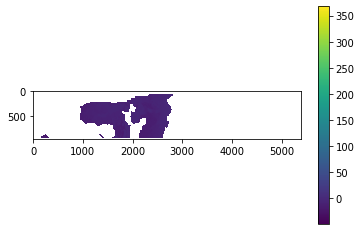

In [ ]:
# Visualize the reshaped zeroed_patches_test array
plt.imshow(reconstructed_test_area[:,:,12])
plt.colorbar()
plt.show()

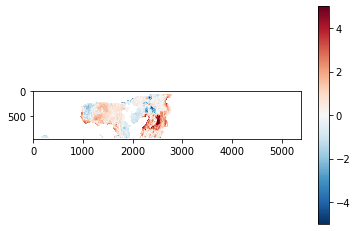

In [ ]:
error = reconstructed_test_area[:,:,12] - image2[70:1035,:, 12]

# Visualize the reshaped zeroed_patches_test array
import matplotlib.colors as mcolors
norm = mcolors.TwoSlopeNorm(vmin=-5, vmax = 5, vcenter=0)
pc = plt.imshow(error, norm=norm, cmap="RdBu_r")
plt.colorbar(pc)

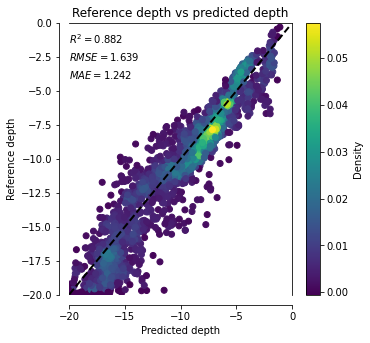

In [ ]:
df3_sample = df3.sample(n = 2000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-20,0])
    ax.set_ylim([-20,0])
    ax.set_xlabel("Predicted depth")
    ax.set_ylabel("Reference depth")
    ax.annotate("$R^2={:.3f}$".format(r2), (-20, -1.5))
    ax.annotate("$RMSE={:.3f}$".format(rmse), (-20, -2.8))
    ax.annotate("$MAE={:.3f}$".format(mae), (-20, -4.1))

    ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
    plt.title("Reference depth vs predicted depth")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('linear_regression.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Predicted'], df3_sample['Reference'], bins = [30,30])

### Image 2

In [ ]:
### IMAGE 2
image_no_2 = np.copy(image2)
# Set pixels in specified slice to NaN
image_no_2[1035:2000,:,:] = np.nan
image_2 = image2[1035:2000,:,:]


In [ ]:
# Define the patch size
patch_size = (16, 16, 13)

# Extract the patches for train area
patches_train = extract_patches(image_no_2, patch_size)
print('Number of patches:', patches_train.shape[0])
print('Patch shape:', patches_train.shape[1:])
# Remove patches with more than 70% NaN values
kept_patches_train, removed_indices = remove_patches_with_too_many_NaN(patches_train, threshold=0.7)
print(kept_patches_train.shape)
# Set the NaN values in the kept patches to 0
zeroed_patches_train = set_NaN_to_zero(kept_patches_train)
print(zeroed_patches_train.shape)

Number of patches: 79296
Patch shape: (16, 16, 13)
(19003, 16, 16, 13)
(19003, 16, 16, 13)


In [ ]:
# Extract the patches for test area
patches_test = extract_patches(image_2, patch_size)
print('Number of patches:', patches_test.shape[0])
print('Patch shape:', patches_test.shape[1:])
# Remove patches with more than 70% NaN values
kept_patches_test, removed_indices = remove_patches_with_too_many_NaN(patches_test, threshold=0.7)
print(kept_patches_test.shape)
# Set the NaN values in the kept patches to 0
zeroed_patches_test = set_NaN_to_zero(kept_patches_test)
print(zeroed_patches_test.shape)

Number of patches: 20160
Patch shape: (16, 16, 13)
(4399, 16, 16, 13)
(4399, 16, 16, 13)


In [ ]:
  # Get the shape of the original test area image
  test_area_shape = image_2.shape

  # Create a new array with the same shape as the test area image, filled with NaN values
  reconstructed_test_area = np.full(test_area_shape, np.nan)

  # Calculate the number of patches in each dimension
  n_rows = (test_area_shape[0] - patch_size[0]) // patch_size[0] + 1
  n_cols = (test_area_shape[1] - patch_size[1]) // patch_size[1] + 1

  # Create a mask with True values for the removed patches
  removed_mask = np.zeros((n_rows, n_cols), dtype=bool)
  removed_mask[np.unravel_index(removed_indices, (n_rows, n_cols))] = True

  # Loop over the patches and fill in the corresponding elements in the reconstructed test area
  patch_index = 0
  for i in range(0, test_area_shape[0] - patch_size[0] + 1, patch_size[0]):
      for j in range(0, test_area_shape[1] - patch_size[1] + 1, patch_size[1]):
          if not removed_mask[i // patch_size[0], j // patch_size[1]]:
              # If the patch was not removed, use the corresponding patch from zeroed_patches_test
              patch = zeroed_patches_test[patch_index, :, :, :]
              reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = patch
              patch_index += 1
          else:
              # If the patch was removed, fill in the corresponding region with NaNs
              reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = np.nan

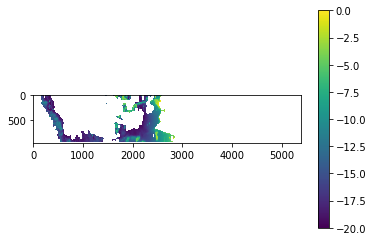

In [ ]:
# Visualize the reshaped zeroed_patches_test array
plt.imshow(reconstructed_test_area[:,:,12])
plt.colorbar()
plt.show()

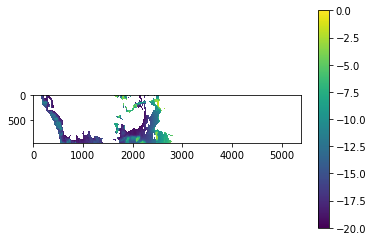

In [ ]:
# Visualize the reshaped zeroed_patches_test array
plt.imshow(image_2[:,:,12])
plt.colorbar()
plt.show()

In [ ]:
# Split the zeroed_patches array into inputs and targets
X_train = zeroed_patches_train[:, :, :, :-1]
y_train = zeroed_patches_train[:, :, :, -1]
y_train = tf.reshape(y_train, (-1, patch_size[0], patch_size[1], 1))

X_test = zeroed_patches_test[:, :, :, :-1]
y_test = zeroed_patches_test[:, :, :, -1]
y_test = tf.reshape(y_test, (-1, patch_size[0], patch_size[1], 1))

# # Calculate the number of samples in the validation set
val_samples = int(X_train.shape[0] * 0.25)

# # Split the training data into training and validation sets
X_val = X_train[-val_samples:, :, :, :]
y_val = y_train[-val_samples:, :, :, :]
X_train = X_train[:-val_samples, :, :, :]
y_train = y_train[:-val_samples, :, :, :]

In [ ]:
# BEST
# Define the model architecture
model = keras.Sequential([
    keras.layers.Conv2D(32, (3, 3), padding='same', activation='relu', input_shape=(16,16,12)),
    keras.layers.BatchNormalization(),
    keras.layers.Dropout(0.25),

    keras.layers.Conv2D(64, (3, 3), padding='same', activation='relu'),
    keras.layers.BatchNormalization(),
    keras.layers.Dropout(0.25),

    keras.layers.Conv2D(128, (3, 3), padding='same', activation='relu'),
    keras.layers.BatchNormalization(),

    keras.layers.Conv2D(256, (3, 3), padding='same', activation='relu'),
    keras.layers.BatchNormalization(),

    keras.layers.Conv2D(1, (1, 1), padding='same', activation='linear')
])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 16, 16, 32)        3488      
                                                                 
 batch_normalization (BatchN  (None, 16, 16, 32)       128       
 ormalization)                                                   
                                                                 
 dropout (Dropout)           (None, 16, 16, 32)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 16, 16, 64)        18496     
                                                                 
 batch_normalization_1 (Batc  (None, 16, 16, 64)       256       
 hNormalization)                                                 
                                                                 
 dropout_1 (Dropout)         (None, 16, 16, 64)        0

In [ ]:
import random
# Set random seed for NumPy
np.random.seed(1)
# Set random seed for Python's built-in random module
random.seed(1)
# Set random seed for TensorFlow
tf.random.set_seed(1)

keras.backend.clear_session()

model.compile(optimizer=keras.optimizers.Adam(lr=0.001), loss=masked_rmse)

# Train the model on the training data
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_val, y_val))

# Evaluate the model on the testing data
predictions = model.predict(X_test)
print(predictions.shape)

Epoch 1/100
446/446 [==============================] - 7s 10ms/step - loss: 3.8611 - val_loss: 2.7372
Epoch 2/100
446/446 [==============================] - 4s 9ms/step - loss: 2.0040 - val_loss: 2.1604
Epoch 3/100
446/446 [==============================] - 4s 8ms/step - loss: 1.8243 - val_loss: 1.8011
Epoch 4/100
446/446 [==============================] - 4s 8ms/step - loss: 1.7673 - val_loss: 2.3881
Epoch 5/100
446/446 [==============================] - 4s 9ms/step - loss: 1.6986 - val_loss: 1.7642
Epoch 6/100
446/446 [==============================] - 4s 8ms/step - loss: 1.7264 - val_loss: 1.4304
Epoch 7/100
446/446 [==============================] - 4s 8ms/step - loss: 1.6907 - val_loss: 1.6971
Epoch 8/100
446/446 [==============================] - 4s 9ms/step - loss: 1.6543 - val_loss: 2.7194
Epoch 9/100
446/446 [==============================] - 4s 8ms/step - loss: 1.6360 - val_loss: 1.8002
Epoch 10/100
446/446 [==============================] - 4s 8ms/step - loss: 1.6548 - val_l

In [ ]:
predictions = np.array(predictions)
y_test = np.array(y_test)
print(predictions.shape)

# Calculate the RMSE
rmse = np.sqrt(np.nanmean((predictions - y_test) ** 2))
print('RMSE:', rmse)

y_test_flat = y_test.flatten()
predictions_flat = predictions.flatten()
df_pred = pd.DataFrame(predictions_flat)
df_test = pd.DataFrame(y_test_flat)
df = pd.concat([df_test, df_pred], axis =1)
df2 = df.dropna() # Remove NaN values
df2.columns = ['Reference','Predicted']
df2= df2[df2['Reference'] < 0] # set max ref depth
df2= df2[df2['Predicted'] > -50] # set max ref depth
df2= df2[df2['Predicted'] < 0] # set max ref depth

#df2= df2[df2['Reference'] > -10] # set max ref depth
#df2 = df2.dropna() # Remove NaN values
df3 = df2.reset_index(drop=True)
df3['Error'] = df3['Predicted'] - df3['Reference']
df3
# Metrics
rmse = mean_squared_error(df3.Reference, df3.Predicted, squared=False)
r2 = metrics.r2_score(df3.Reference, df3.Predicted)
mae = np.mean(abs(df3.Reference - df3.Predicted))
print('MAE:',mae)
print('RMSE', rmse)
print('R2:',r2)

(4399, 16, 16, 1)
RMSE: 6.0246375043400375
MAE: 1.4797021942796105
RMSE 1.9759082215834163
R2: 0.839129253341687


In [ ]:
####### RESHAPE PREDICTIONS

# Get the shape of the original test area image
test_area_shape = image_2.shape

# Create a new array with the same shape as the test area image, filled with NaN values
reconstructed_test_area = np.full(test_area_shape, np.nan)

# Calculate the number of patches in each dimension
n_rows = (test_area_shape[0] - patch_size[0]) // patch_size[0] + 1
n_cols = (test_area_shape[1] - patch_size[1]) // patch_size[1] + 1

# Create a mask with True values for the removed patches
removed_mask = np.zeros((n_rows, n_cols), dtype=bool)
removed_mask[np.unravel_index(removed_indices, (n_rows, n_cols))] = True

# Loop over the patches and fill in the corresponding elements in the reconstructed test area
patch_index = 0
for i in range(0, test_area_shape[0] - patch_size[0] + 1, patch_size[0]):
    for j in range(0, test_area_shape[1] - patch_size[1] + 1, patch_size[1]):
        if not removed_mask[i // patch_size[0], j // patch_size[1]]:
            # If the patch was not removed, use the corresponding patch from zeroed_patches_test
            patch = predictions[patch_index, :, :, :]
            reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = patch
            patch_index += 1
        else:
            # If the patch was removed, fill in the corresponding region with NaNs
            reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = np.nan

pred_image_2 = reconstructed_test_area

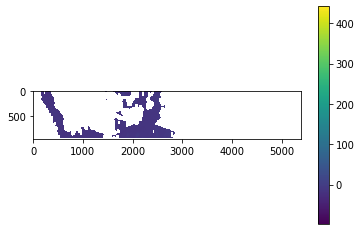

In [ ]:
# Visualize the reshaped zeroed_patches_test array
plt.imshow(reconstructed_test_area[:,:,12])
plt.colorbar()
plt.show()

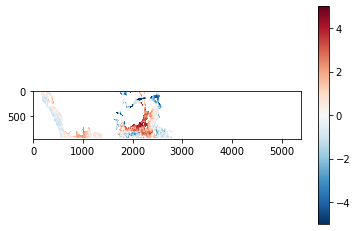

In [ ]:
error = reconstructed_test_area[:,:,12] - image2[1035:2000,:,12]

# Visualize the reshaped zeroed_patches_test array
import matplotlib.colors as mcolors
norm = mcolors.TwoSlopeNorm(vmin=-5, vmax = 5, vcenter=0)
pc = plt.imshow(error, norm=norm, cmap="RdBu_r")
plt.colorbar(pc)

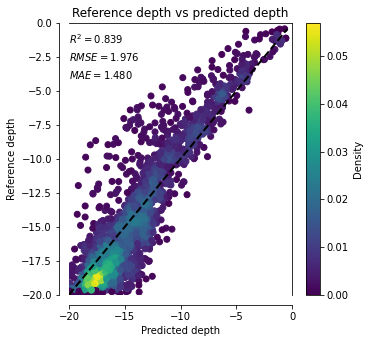

In [ ]:
df3_sample = df3.sample(n = 2000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-20,0])
    ax.set_ylim([-20,0])
    ax.set_xlabel("Predicted depth")
    ax.set_ylabel("Reference depth")
    ax.annotate("$R^2={:.3f}$".format(r2), (-20, -1.5))
    ax.annotate("$RMSE={:.3f}$".format(rmse), (-20, -2.8))
    ax.annotate("$MAE={:.3f}$".format(mae), (-20, -4.1))

    ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
    plt.title("Reference depth vs predicted depth")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('linear_regression.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Predicted'], df3_sample['Reference'], bins = [30,30])

### Image 3

In [ ]:
image2 = image_20
### IMAGE 2
image_no_3 = np.copy(image2)
# Set pixels in specified slice to NaN
image_no_3[2000:,:2800,:] = np.nan
image_3 = image2[2000:,:2800,:]



In [ ]:
# Define the patch size
patch_size = (16, 16, 13)

# Extract the patches for train area
patches_train = extract_patches(image_no_3, patch_size)
print('Number of patches:', patches_train.shape[0])
print('Patch shape:', patches_train.shape[1:])
# Remove patches with more than 70% NaN values
kept_patches_train, removed_indices = remove_patches_with_too_many_NaN(patches_train, threshold=0.7)
print(kept_patches_train.shape)
# Set the NaN values in the kept patches to 0
zeroed_patches_train = set_NaN_to_zero(kept_patches_train)
print(zeroed_patches_train.shape)

Number of patches: 79296
Patch shape: (16, 16, 13)
(15826, 16, 16, 13)
(15826, 16, 16, 13)


In [ ]:
# Extract the patches for test area
patches_test = extract_patches(image_3, patch_size)
print('Number of patches:', patches_test.shape[0])
print('Patch shape:', patches_test.shape[1:])
# Remove patches with more than 70% NaN values
kept_patches_test, removed_indices = remove_patches_with_too_many_NaN(patches_test, threshold=0.7)
print(kept_patches_test.shape)
# Set the NaN values in the kept patches to 0
zeroed_patches_test = set_NaN_to_zero(kept_patches_test)
print(zeroed_patches_test.shape)

Number of patches: 19425
Patch shape: (16, 16, 13)
(7600, 16, 16, 13)
(7600, 16, 16, 13)


In [ ]:
  # Get the shape of the original test area image
  test_area_shape = image_3.shape

  # Create a new array with the same shape as the test area image, filled with NaN values
  reconstructed_test_area = np.full(test_area_shape, np.nan)

  # Calculate the number of patches in each dimension
  n_rows = (test_area_shape[0] - patch_size[0]) // patch_size[0] + 1
  n_cols = (test_area_shape[1] - patch_size[1]) // patch_size[1] + 1

  # Create a mask with True values for the removed patches
  removed_mask = np.zeros((n_rows, n_cols), dtype=bool)
  removed_mask[np.unravel_index(removed_indices, (n_rows, n_cols))] = True

  # Loop over the patches and fill in the corresponding elements in the reconstructed test area
  patch_index = 0
  for i in range(0, test_area_shape[0] - patch_size[0] + 1, patch_size[0]):
      for j in range(0, test_area_shape[1] - patch_size[1] + 1, patch_size[1]):
          if not removed_mask[i // patch_size[0], j // patch_size[1]]:
              # If the patch was not removed, use the corresponding patch from zeroed_patches_test
              patch = zeroed_patches_test[patch_index, :, :, :]
              reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = patch
              patch_index += 1
          else:
              # If the patch was removed, fill in the corresponding region with NaNs
              reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = np.nan

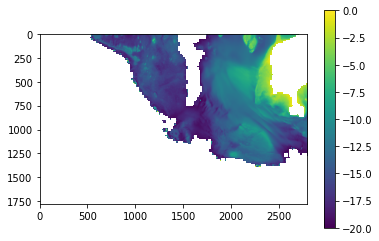

In [ ]:
# Visualize the reshaped zeroed_patches_test array
plt.imshow(reconstructed_test_area[:,:,12])
plt.colorbar()
plt.show()

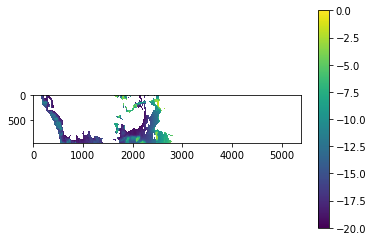

In [ ]:
# Visualize the reshaped zeroed_patches_test array
plt.imshow(image_2[:,:,12])
plt.colorbar()
plt.show()

In [ ]:
# Split the zeroed_patches array into inputs and targets
X_train = zeroed_patches_train[:, :, :, :-1]
y_train = zeroed_patches_train[:, :, :, -1]
y_train = tf.reshape(y_train, (-1, patch_size[0], patch_size[1], 1))

X_test = zeroed_patches_test[:, :, :, :-1]
y_test = zeroed_patches_test[:, :, :, -1]
y_test = tf.reshape(y_test, (-1, patch_size[0], patch_size[1], 1))

# # Calculate the number of samples in the validation set
val_samples = int(X_train.shape[0] * 0.25)

# # Split the training data into training and validation sets
X_val = X_train[-val_samples:, :, :, :]
y_val = y_train[-val_samples:, :, :, :]
X_train = X_train[:-val_samples, :, :, :]
y_train = y_train[:-val_samples, :, :, :]

In [ ]:
# BEST
# Define the model architecture
model = keras.Sequential([
    keras.layers.Conv2D(32, (3, 3), padding='same', activation='relu', input_shape=(16,16,12)),
    keras.layers.BatchNormalization(),
    keras.layers.Dropout(0.25),

    keras.layers.Conv2D(64, (3, 3), padding='same', activation='relu'),
    keras.layers.BatchNormalization(),
    keras.layers.Dropout(0.25),

    keras.layers.Conv2D(128, (3, 3), padding='same', activation='relu'),
    keras.layers.BatchNormalization(),

    keras.layers.Conv2D(256, (3, 3), padding='same', activation='relu'),
    keras.layers.BatchNormalization(),

    keras.layers.Conv2D(1, (1, 1), padding='same', activation='linear')
])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 16, 16, 32)        3488      
                                                                 
 batch_normalization (BatchN  (None, 16, 16, 32)       128       
 ormalization)                                                   
                                                                 
 dropout (Dropout)           (None, 16, 16, 32)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 16, 16, 64)        18496     
                                                                 
 batch_normalization_1 (Batc  (None, 16, 16, 64)       256       
 hNormalization)                                                 
                                                                 
 dropout_1 (Dropout)         (None, 16, 16, 64)        0

In [ ]:
# Load the TensorBoard notebook extension
import datetime

%load_ext tensorboard
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)
import tensorflow as tf
# Clear any logs from previous runs
#!rm -rf ./logs/

In [ ]:
import random
# Set random seed for NumPy
np.random.seed(1)
# Set random seed for Python's built-in random module
random.seed(1)
# Set random seed for TensorFlow
tf.random.set_seed(1)

keras.backend.clear_session()

model.compile(optimizer=keras.optimizers.Adam(lr=0.001), loss=masked_rmse)

# Train the model on the training data
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_val, y_val), callbacks=[tensorboard_callback])

# Evaluate the model on the testing data
predictions = model.predict(X_test)
print(predictions.shape)

Epoch 1/100
371/371 [==============================] - 7s 11ms/step - loss: 3.8367 - val_loss: 4.3882
Epoch 2/100
371/371 [==============================] - 3s 9ms/step - loss: 2.3846 - val_loss: 2.3955
Epoch 3/100
371/371 [==============================] - 3s 9ms/step - loss: 2.1390 - val_loss: 4.0036
Epoch 4/100
371/371 [==============================] - 3s 9ms/step - loss: 2.0194 - val_loss: 3.1345
Epoch 5/100
371/371 [==============================] - 3s 9ms/step - loss: 1.9400 - val_loss: 2.9580
Epoch 6/100
371/371 [==============================] - 3s 9ms/step - loss: 1.9421 - val_loss: 4.9014
Epoch 7/100
371/371 [==============================] - 3s 9ms/step - loss: 1.9649 - val_loss: 2.8470
Epoch 8/100
371/371 [==============================] - 4s 10ms/step - loss: 1.8886 - val_loss: 2.2657
Epoch 9/100
371/371 [==============================] - 3s 9ms/step - loss: 1.9149 - val_loss: 2.1253
Epoch 10/100
371/371 [==============================] - 3s 9ms/step - loss: 1.8655 - val_

In [ ]:
predictions = np.array(predictions)
y_test = np.array(y_test)
print(predictions.shape)

# Calculate the RMSE
rmse = np.sqrt(np.nanmean((predictions - y_test) ** 2))
print('RMSE:', rmse)

y_test_flat = y_test.flatten()
predictions_flat = predictions.flatten()
df_pred = pd.DataFrame(predictions_flat)
df_test = pd.DataFrame(y_test_flat)
df = pd.concat([df_test, df_pred], axis =1)
df2 = df.dropna() # Remove NaN values
df2.columns = ['Reference','Predicted']
df2= df2[df2['Reference'] < 0] # set max ref depth
df2= df2[df2['Predicted'] > -50] # set max ref depth
df2= df2[df2['Predicted'] < 0] # set max ref depth

#df2= df2[df2['Reference'] > -10] # set max ref depth
#df2 = df2.dropna() # Remove NaN values
df3 = df2.reset_index(drop=True)
df3['Error'] = df3['Predicted'] - df3['Reference']
df3
# Metrics
rmse = mean_squared_error(df3.Reference, df3.Predicted, squared=False)
r2 = metrics.r2_score(df3.Reference, df3.Predicted)
mae = np.mean(abs(df3.Reference - df3.Predicted))
print('MAE:',mae)
print('RMSE', rmse)
print('R2:',r2)

(7600, 16, 16, 1)
RMSE: 2.9643020145400953
MAE: 1.312871260635515
RMSE 1.6967157831818485
R2: 0.8356887411534919


In [ ]:
####### RESHAPE PREDICTIONS

# Get the shape of the original test area image
test_area_shape = image_3.shape

# Create a new array with the same shape as the test area image, filled with NaN values
reconstructed_test_area = np.full(test_area_shape, np.nan)

# Calculate the number of patches in each dimension
n_rows = (test_area_shape[0] - patch_size[0]) // patch_size[0] + 1
n_cols = (test_area_shape[1] - patch_size[1]) // patch_size[1] + 1

# Create a mask with True values for the removed patches
removed_mask = np.zeros((n_rows, n_cols), dtype=bool)
removed_mask[np.unravel_index(removed_indices, (n_rows, n_cols))] = True

# Loop over the patches and fill in the corresponding elements in the reconstructed test area
patch_index = 0
for i in range(0, test_area_shape[0] - patch_size[0] + 1, patch_size[0]):
    for j in range(0, test_area_shape[1] - patch_size[1] + 1, patch_size[1]):
        if not removed_mask[i // patch_size[0], j // patch_size[1]]:
            # If the patch was not removed, use the corresponding patch from zeroed_patches_test
            patch = predictions[patch_index, :, :, :]
            reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = patch
            patch_index += 1
        else:
            # If the patch was removed, fill in the corresponding region with NaNs
            reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = np.nan

pred_image_3 = reconstructed_test_area

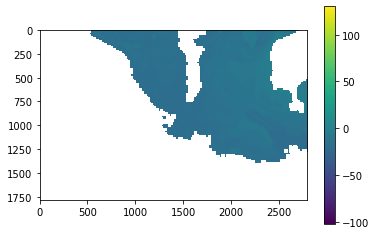

In [ ]:
# Visualize the reshaped zeroed_patches_test array
plt.imshow(reconstructed_test_area[:,:,12])
plt.colorbar()
plt.show()

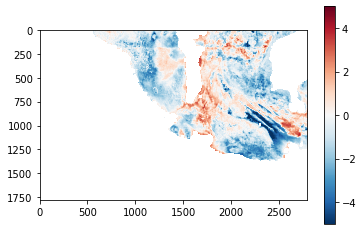

In [ ]:
error = reconstructed_test_area[:,:,12] - image2[2000:,:2800,12]
# Visualize the reshaped zeroed_patches_test array
import matplotlib.colors as mcolors
norm = mcolors.TwoSlopeNorm(vmin=-5, vmax = 5, vcenter=0)
pc = plt.imshow(error, norm=norm, cmap="RdBu_r")
plt.colorbar(pc)

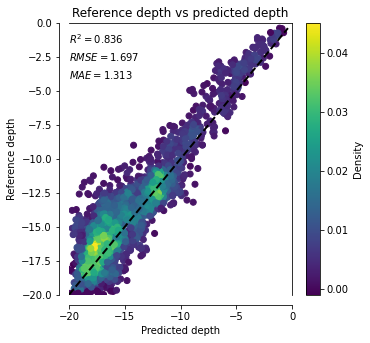

In [ ]:
df3_sample = df3.sample(n = 2000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-20,0])
    ax.set_ylim([-20,0])
    ax.set_xlabel("Predicted depth")
    ax.set_ylabel("Reference depth")
    ax.annotate("$R^2={:.3f}$".format(r2), (-20, -1.5))
    ax.annotate("$RMSE={:.3f}$".format(rmse), (-20, -2.8))
    ax.annotate("$MAE={:.3f}$".format(mae), (-20, -4.1))

    ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
    plt.title("Reference depth vs predicted depth")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('linear_regression.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Predicted'], df3_sample['Reference'], bins = [30,30])

### Image 4

In [ ]:
### IMAGE 4
image_no_4 = np.copy(image2)
image_no_4[2000:,2800:,:] = np.nan
image_4 = image2[2000:,2800:,:]

In [ ]:
# Define the patch size
patch_size = (16, 16, 13)

# Extract the patches for train area
patches_train = extract_patches(image_no_4, patch_size)
print('Number of patches:', patches_train.shape[0])
print('Patch shape:', patches_train.shape[1:])
# Remove patches with more than 70% NaN values
kept_patches_train, removed_indices = remove_patches_with_too_many_NaN(patches_train, threshold=0.7)
print(kept_patches_train.shape)
# Set the NaN values in the kept patches to 0
zeroed_patches_train = set_NaN_to_zero(kept_patches_train)
print(zeroed_patches_train.shape)

Number of patches: 79296
Patch shape: (16, 16, 13)
(16898, 16, 16, 13)
(16898, 16, 16, 13)


In [ ]:
# Extract the patches for test area
patches_test = extract_patches(image_4, patch_size)
print('Number of patches:', patches_test.shape[0])
print('Patch shape:', patches_test.shape[1:])
# Remove patches with more than 70% NaN values
kept_patches_test, removed_indices = remove_patches_with_too_many_NaN(patches_test, threshold=0.7)
print(kept_patches_test.shape)
# Set the NaN values in the kept patches to 0
zeroed_patches_test = set_NaN_to_zero(kept_patches_test)
print(zeroed_patches_test.shape)

Number of patches: 17871
Patch shape: (16, 16, 13)
(6528, 16, 16, 13)
(6528, 16, 16, 13)


In [ ]:
  # Get the shape of the original test area image
  test_area_shape = image_4.shape

  # Create a new array with the same shape as the test area image, filled with NaN values
  reconstructed_test_area = np.full(test_area_shape, np.nan)

  # Calculate the number of patches in each dimension
  n_rows = (test_area_shape[0] - patch_size[0]) // patch_size[0] + 1
  n_cols = (test_area_shape[1] - patch_size[1]) // patch_size[1] + 1

  # Create a mask with True values for the removed patches
  removed_mask = np.zeros((n_rows, n_cols), dtype=bool)
  removed_mask[np.unravel_index(removed_indices, (n_rows, n_cols))] = True

  # Loop over the patches and fill in the corresponding elements in the reconstructed test area
  patch_index = 0
  for i in range(0, test_area_shape[0] - patch_size[0] + 1, patch_size[0]):
      for j in range(0, test_area_shape[1] - patch_size[1] + 1, patch_size[1]):
          if not removed_mask[i // patch_size[0], j // patch_size[1]]:
              # If the patch was not removed, use the corresponding patch from zeroed_patches_test
              patch = zeroed_patches_test[patch_index, :, :, :]
              reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = patch
              patch_index += 1
          else:
              # If the patch was removed, fill in the corresponding region with NaNs
              reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = np.nan

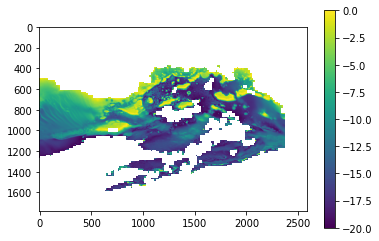

In [ ]:
# Visualize the reshaped zeroed_patches_test array
plt.imshow(reconstructed_test_area[:,:,12])
plt.colorbar()
plt.show()

In [ ]:
# Split the zeroed_patches array into inputs and targets
X_train = zeroed_patches_train[:, :, :, :-1]
y_train = zeroed_patches_train[:, :, :, -1]
y_train = tf.reshape(y_train, (-1, patch_size[0], patch_size[1], 1))

X_test = zeroed_patches_test[:, :, :, :-1]
y_test = zeroed_patches_test[:, :, :, -1]
y_test = tf.reshape(y_test, (-1, patch_size[0], patch_size[1], 1))

# # Calculate the number of samples in the validation set
val_samples = int(X_train.shape[0] * 0.25)

# # Split the training data into training and validation sets
X_val = X_train[-val_samples:, :, :, :]
y_val = y_train[-val_samples:, :, :, :]
X_train = X_train[:-val_samples, :, :, :]
y_train = y_train[:-val_samples, :, :, :]

In [ ]:
# BEST
# Define the model architecture
model = keras.Sequential([
    keras.layers.Conv2D(32, (3, 3), padding='same', activation='relu', input_shape=(16,16,12)),
    keras.layers.BatchNormalization(),
    keras.layers.Dropout(0.25),

    keras.layers.Conv2D(64, (3, 3), padding='same', activation='relu'),
    keras.layers.BatchNormalization(),
    keras.layers.Dropout(0.25),

    keras.layers.Conv2D(128, (3, 3), padding='same', activation='relu'),
    keras.layers.BatchNormalization(),

    keras.layers.Conv2D(256, (3, 3), padding='same', activation='relu'),
    keras.layers.BatchNormalization(),

    keras.layers.Conv2D(1, (1, 1), padding='same', activation='linear')
])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 16, 16, 32)        3488      
                                                                 
 batch_normalization (BatchN  (None, 16, 16, 32)       128       
 ormalization)                                                   
                                                                 
 dropout (Dropout)           (None, 16, 16, 32)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 16, 16, 64)        18496     
                                                                 
 batch_normalization_1 (Batc  (None, 16, 16, 64)       256       
 hNormalization)                                                 
                                                                 
 dropout_1 (Dropout)         (None, 16, 16, 64)        0

In [ ]:
import random
# Set random seed for NumPy
np.random.seed(1)
# Set random seed for Python's built-in random module
random.seed(1)
# Set random seed for TensorFlow
tf.random.set_seed(1)

keras.backend.clear_session()

model.compile(optimizer=keras.optimizers.Adam(lr=0.001), loss=masked_rmse)

# Train the model on the training data
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_val, y_val), callbacks=[tensorboard_callback])

# Evaluate the model on the testing data
predictions = model.predict(X_test)
print(predictions.shape)

Epoch 1/100
397/397 [==============================] - 8s 10ms/step - loss: 4.2549 - val_loss: 5.0186
Epoch 2/100
397/397 [==============================] - 3s 8ms/step - loss: 2.0946 - val_loss: 2.0629
Epoch 3/100
397/397 [==============================] - 3s 8ms/step - loss: 1.9352 - val_loss: 2.4904
Epoch 4/100
397/397 [==============================] - 3s 8ms/step - loss: 1.8743 - val_loss: 1.6211
Epoch 5/100
397/397 [==============================] - 3s 8ms/step - loss: 1.9322 - val_loss: 2.8980
Epoch 6/100
397/397 [==============================] - 3s 8ms/step - loss: 1.8364 - val_loss: 1.7287
Epoch 7/100
397/397 [==============================] - 3s 8ms/step - loss: 1.7701 - val_loss: 1.5074
Epoch 8/100
397/397 [==============================] - 3s 9ms/step - loss: 1.7968 - val_loss: 1.9913
Epoch 9/100
397/397 [==============================] - 3s 8ms/step - loss: 1.7356 - val_loss: 1.4680
Epoch 10/100
397/397 [==============================] - 3s 8ms/step - loss: 1.7189 - val_l

In [ ]:
predictions = np.array(predictions)
y_test = np.array(y_test)
print(predictions.shape)

# Calculate the RMSE
rmse = np.sqrt(np.nanmean((predictions - y_test) ** 2))
print('RMSE:', rmse)

y_test_flat = y_test.flatten()
predictions_flat = predictions.flatten()
df_pred = pd.DataFrame(predictions_flat)
df_test = pd.DataFrame(y_test_flat)
df = pd.concat([df_test, df_pred], axis =1)
df2 = df.dropna() # Remove NaN values
df2.columns = ['Reference','Predicted']
df2= df2[df2['Reference'] < 0] # set max ref depth
df2= df2[df2['Predicted'] > -50] # set max ref depth
df2= df2[df2['Predicted'] < 0] # set max ref depth

#df2= df2[df2['Reference'] > -10] # set max ref depth
#df2 = df2.dropna() # Remove NaN values
df3 = df2.reset_index(drop=True)
df3['Error'] = df3['Predicted'] - df3['Reference']
df3
# Metrics
rmse = mean_squared_error(df3.Reference, df3.Predicted, squared=False)
r2 = metrics.r2_score(df3.Reference, df3.Predicted)
mae = np.mean(abs(df3.Reference - df3.Predicted))
print('MAE:',mae)
print('RMSE', rmse)
print('R2:',r2)

(6528, 16, 16, 1)
RMSE: 6.647131323854888
MAE: 1.5236224709952808
RMSE 1.9701786014867517
R2: 0.8782175473459757


In [ ]:
####### RESHAPE PREDICTIONS

# Get the shape of the original test area image
test_area_shape = image_4.shape

# Create a new array with the same shape as the test area image, filled with NaN values
reconstructed_test_area = np.full(test_area_shape, np.nan)

# Calculate the number of patches in each dimension
n_rows = (test_area_shape[0] - patch_size[0]) // patch_size[0] + 1
n_cols = (test_area_shape[1] - patch_size[1]) // patch_size[1] + 1

# Create a mask with True values for the removed patches
removed_mask = np.zeros((n_rows, n_cols), dtype=bool)
removed_mask[np.unravel_index(removed_indices, (n_rows, n_cols))] = True

# Loop over the patches and fill in the corresponding elements in the reconstructed test area
patch_index = 0
for i in range(0, test_area_shape[0] - patch_size[0] + 1, patch_size[0]):
    for j in range(0, test_area_shape[1] - patch_size[1] + 1, patch_size[1]):
        if not removed_mask[i // patch_size[0], j // patch_size[1]]:
            # If the patch was not removed, use the corresponding patch from zeroed_patches_test
            patch = predictions[patch_index, :, :, :]
            reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = patch
            patch_index += 1
        else:
            # If the patch was removed, fill in the corresponding region with NaNs
            reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = np.nan

pred_image_4 = reconstructed_test_area

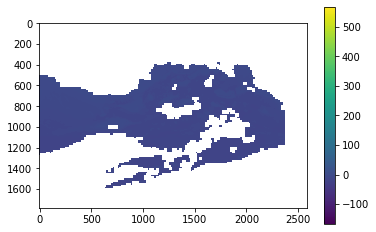

In [ ]:
# Visualize the reshaped zeroed_patches_test array
plt.imshow(reconstructed_test_area[:,:,12])
plt.colorbar()
plt.show()

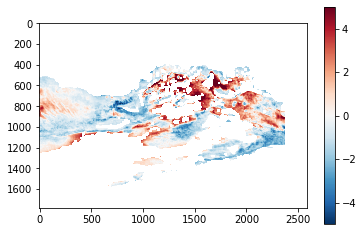

In [ ]:
error = reconstructed_test_area[:,:,12] - image2[2000:,2800:,12]

# Visualize the reshaped zeroed_patches_test array
import matplotlib.colors as mcolors
norm = mcolors.TwoSlopeNorm(vmin=-5, vmax = 5, vcenter=0)
pc = plt.imshow(error, norm=norm, cmap="RdBu_r")
plt.colorbar(pc)

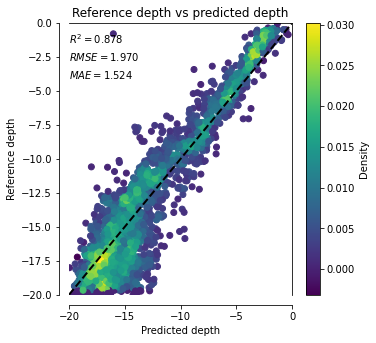

In [ ]:
df3_sample = df3.sample(n = 2000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-20,0])
    ax.set_ylim([-20,0])
    ax.set_xlabel("Predicted depth")
    ax.set_ylabel("Reference depth")
    ax.annotate("$R^2={:.3f}$".format(r2), (-20, -1.5))
    ax.annotate("$RMSE={:.3f}$".format(rmse), (-20, -2.8))
    ax.annotate("$MAE={:.3f}$".format(mae), (-20, -4.1))

    ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
    plt.title("Reference depth vs predicted depth")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('linear_regression.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Predicted'], df3_sample['Reference'], bins = [30,30])

### Reshape predictions

In [ ]:
print(pred_image_1.shape)
print(pred_image_2.shape)
print(pred_image_3.shape)
print(pred_image_4.shape)

(965, 5389, 13)
(965, 5389, 13)
(1783, 2800, 13)
(1783, 2589, 13)


In [ ]:
print(image_1.shape)
print(image_2.shape)
print(image_3.shape)
print(image_4.shape)

(965, 5389, 13)
(965, 5389, 13)
(1783, 2800, 13)
(1783, 2589, 13)


(3860, 5389)


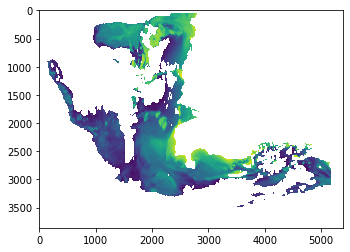

In [ ]:
ref_image_1 = image_1[:,:,-1]
ref_image_2 = image_2[:,:,-1]
ref_image_3 = image_3[:,:,-1]
ref_image_4 = image_4[:,:,-1]

ref_1_2 = np.concatenate((ref_image_1, ref_image_2), axis = 0)

ref_image_4_pad = np.pad(ref_image_4, [(0,0), (0,211)], 'constant', constant_values=(np.nan,))
ref_3_4 = np.concatenate((ref_image_3, ref_image_4_pad), axis = 1)
ref_3_4 = np.pad(ref_3_4, [(0,147), (0,0)], 'constant', constant_values=(np.nan,))
ref_3_4 = ref_3_4[:,0:5389]

ref_all = np.concatenate((ref_1_2, ref_3_4), axis = 0)
print(ref_all.shape)
pc = plt.imshow(ref_all)

In [ ]:
pred_image_1 = pred_image_1[:,:,-1]
pred_image_2 = pred_image_2[:,:,-1]
pred_image_3 = pred_image_3[:,:,-1]
pred_image_4 = pred_image_4[:,:,-1]

In [ ]:
print(pred_image_1.shape)
print(pred_image_2.shape)
print(pred_image_3.shape)
print(pred_image_4.shape)

(965, 5389)
(965, 5389)
(1783, 2800)
(1783, 2589)


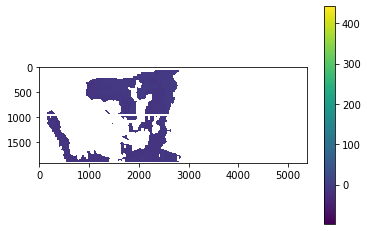

In [ ]:
y_pred_1_2 = np.concatenate((pred_image_1, pred_image_2), axis = 0)
pc = plt.imshow(y_pred_1_2)
plt.colorbar(pc)

In [ ]:
pred_image_4_pad = np.pad(pred_image_4, [(0,0), (0,211)], 'constant', constant_values=(np.nan,))

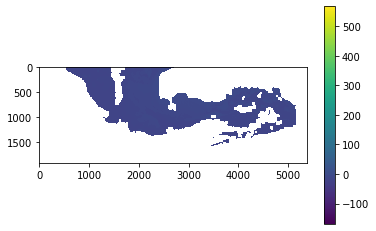

In [ ]:
y_pred_3_4 = np.concatenate((pred_image_3, pred_image_4_pad), axis = 1)
y_pred_3_4 = np.pad(y_pred_3_4, [(0,147), (0,0)], 'constant', constant_values=(np.nan,))
y_pred_3_4 = y_pred_3_4[:,0:5389]
pc = plt.imshow(y_pred_3_4)
plt.colorbar(pc)

In [ ]:
y_pred_all = np.concatenate((y_pred_1_2, y_pred_3_4), axis = 0)
y_pred_all.shape

(3860, 5389)

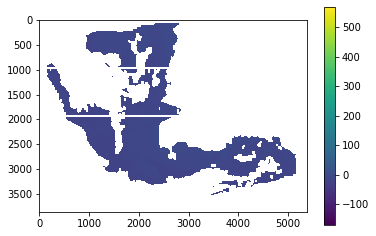

In [ ]:
pc = plt.imshow(y_pred_all)
plt.colorbar(pc)

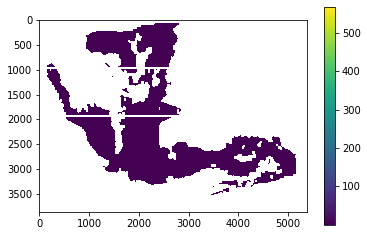

In [ ]:
y_pred_mask = y_pred_all.copy()

y_pred_mask[y_pred_mask <= 0] = 1
pc = plt.imshow(y_pred_mask)
plt.colorbar(pc)


In [ ]:
ref_all_masked = ref_all * y_pred_mask

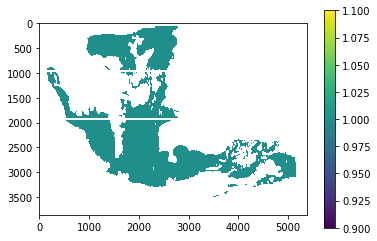

In [ ]:
ref_mask = ref_all_masked.copy()

ref_mask[ref_mask <= 0] = 1
pc = plt.imshow(ref_mask)
plt.colorbar(pc)

In [ ]:
y_pred_all_masked = y_pred_all * ref_mask

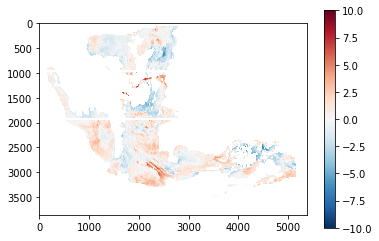

In [ ]:
error = ref_all_masked - y_pred_all_masked

# Visualize the reshaped zeroed_patches_test array
import matplotlib.colors as mcolors
norm = mcolors.TwoSlopeNorm(vmin=-10, vmax = 10, vcenter=0)
pc = plt.imshow(error, norm=norm, cmap="RdBu_r")
plt.colorbar(pc)

In [ ]:
np.save('/content/drive/My Drive/Predictions_final/5_S2_simple_CNN_median_20m.npy', y_pred_all_masked)

In [ ]:
np.save('/content/drive/My Drive/Predictions_final/5_S2_simple_CNN_error_20m.npy', error)

In [ ]:
np.save('/content/drive/My Drive/Predictions_final/5_S2_simple_CNN_reference_20m.npy', ref_all_masked)

In [ ]:
predictions = np.array(y_pred_all_masked)
y_test = np.array(ref_all_masked)
print(predictions.shape)

# Calculate the RMSE
rmse = np.sqrt(np.nanmean((predictions - y_test) ** 2))
print('RMSE:', rmse)

y_test_flat = y_test.flatten()
predictions_flat = predictions.flatten()
df_pred = pd.DataFrame(predictions_flat)
df_test = pd.DataFrame(y_test_flat)
df = pd.concat([df_test, df_pred], axis =1)
df2 = df.dropna() # Remove NaN values
df2.columns = ['Reference','Predicted']
df2= df2[df2['Reference'] < 0] # set max ref depth
df2= df2[df2['Predicted'] > -50] # set max ref depth
df2= df2[df2['Predicted'] < 0] # set max ref depth

#df2= df2[df2['Reference'] > -10] # set max ref depth
#df2 = df2.dropna() # Remove NaN values
df3 = df2.reset_index(drop=True)
df3['Error'] = df3['Predicted'] - df3['Reference']
df3
# Metrics
rmse = mean_squared_error(df3.Reference, df3.Predicted, squared=False)
r2 = metrics.r2_score(df3.Reference, df3.Predicted)
mae = np.mean(abs(df3.Reference - df3.Predicted))
print('MAE:',mae)
print('RMSE', rmse)
print('R2:',r2)

(3860, 5389)
RMSE: 1.8210625461377996
MAE: 1.3860644112971428
RMSE 1.816600120294796
R2: 0.8705854001390754


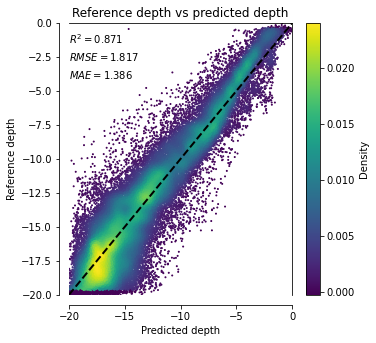

In [ ]:
df3_sample = df3.sample(n = 50000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-20,0])
    ax.set_ylim([-20,0])
    ax.set_xlabel("Predicted depth")
    ax.set_ylabel("Reference depth")
    ax.annotate("$R^2={:.3f}$".format(r2), (-20, -1.5))
    ax.annotate("$RMSE={:.3f}$".format(rmse), (-20, -2.8))
    ax.annotate("$MAE={:.3f}$".format(mae), (-20, -4.1))

    ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
    plt.title("Reference depth vs predicted depth")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('linear_regression.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Predicted'], df3_sample['Reference'], bins = [30,30], s = 1)

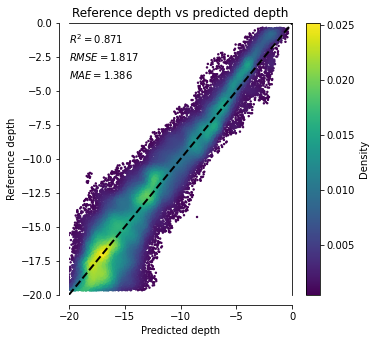

In [ ]:
df3_sample = df3.sample(n = 50000)

def density_scatter(x, y, threshold=0, ax=None, sort=True, bins=20, **kwargs):
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None:
        fig, ax = plt.subplots(figsize=(5, 5))
    data, x_e, y_e = np.histogram2d(x, y, bins=bins, density=True)
    z = interpn((0.5*(x_e[1:]+x_e[:-1]), 0.5*(y_e[1:]+y_e[:-1])), data, np.vstack([x, y]).T,
                method="splinef2d", bounds_error=False)

    # Filter pixels based on density threshold
    mask = z >= threshold
    x = x[mask]
    y = y[mask]
    z = z[mask]

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs)
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-20, 0])
    ax.set_ylim([-20, 0])
    ax.set_xlabel("Predicted depth")
    ax.set_ylabel("Reference depth")

    # Calculate regression metrics and add to plot
    ax.annotate("$R^2={:.3f}$".format(r2), (-20, -1.5))
    ax.annotate("$RMSE={:.3f}$".format(rmse), (-20, -2.8))
    ax.annotate("$MAE={:.3f}$".format(mae), (-20, -4.1))

    ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
    plt.title("Reference depth vs predicted depth")

    norm = Normalize(vmin=np.min(z), vmax=np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm=norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('linear_regression.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__:
    density_scatter(df3_sample['Predicted'], df3_sample['Reference'], threshold=0.0005, bins=[30, 30], s=2)


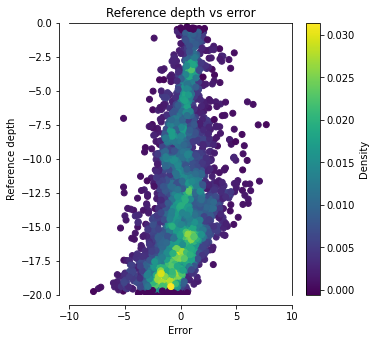

In [ ]:
# Depth vs error
#error.shape (1400,1400)
#reference.shape (1400, 1400)

error_flatten = error.flatten()
reference_flatten = ref_all_masked.flatten()

reference_df = pd.DataFrame(reference_flatten)
error_df = pd.DataFrame(error_flatten)

df = pd.concat([reference_df, error_df], axis=1) # Concatenate both dataframes
df2 = df.dropna() # Remove NaN values
df2.columns = ['Reference','Error']
df3 = df2.reset_index(drop=True)

df3_sample = df3.sample(n = 3000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-10,10])
    ax.set_ylim([-20,0])
    ax.set_xlabel("Error")
    ax.set_ylabel("Reference depth")
    ax.annotate("$R^2={:.3f}$".format(r2), (-20, -1.5))
    ax.annotate("$RMSE={:.3f}$".format(rmse), (-20, -2.8))
    ax.annotate("$MAE={:.3f}$".format(mae), (-20, -4.1))

    #ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
    plt.title("Reference depth vs error")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('linear_regression.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Error'], df3_sample['Reference'], bins = [30,30])

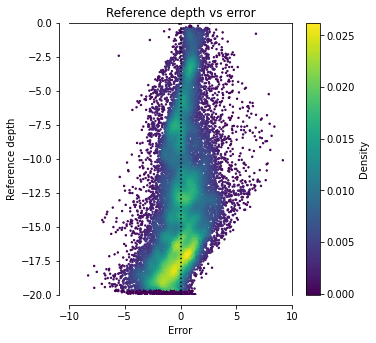

In [ ]:
df3_sample = df3.sample(n = 20000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-10,10])
    ax.set_ylim([-20,0])
    ax.set_xlabel("Error")
    ax.set_ylabel("Reference depth")
    ax.annotate("$R^2={:.3f}$".format(r2), (-20, -1.5))
    ax.annotate("$RMSE={:.3f}$".format(rmse), (-20, -2.8))
    ax.annotate("$MAE={:.3f}$".format(mae), (-20, -4.1))

    #ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
    plt.title("Reference depth vs error")
    plt.axvline(x=0, color='k', linestyle=':', label='axvline - dotted')
    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('linear_regression.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Error'], df3_sample['Reference'], bins = [30,30], s =2)

## S2 median image UNet no max depth

### Image 1

In [ ]:
## IMAGE 1
image_no_1 = np.copy(image2)
# Set pixels in specified slice to NaN
image_no_1[70:1035,:, :] = np.nan

# Train set
image_1 = image2[70:1035,:, :]


In [ ]:
# Define the patch size
patch_size = (64, 64, 13)

# Extract the patches for train area
patches_train = extract_patches(image_no_1, patch_size)
print('Number of patches:', patches_train.shape[0])
print('Patch shape:', patches_train.shape[1:])
# Remove patches with more than 70% NaN values
kept_patches_train, removed_indices = remove_patches_with_too_many_NaN(patches_train, threshold=0.7)
print(kept_patches_train.shape)
# Set the NaN values in the kept patches to 0
zeroed_patches_train = set_NaN_to_zero(kept_patches_train)
print(zeroed_patches_train.shape)

Number of patches: 4956
Patch shape: (64, 64, 13)
(1649, 64, 64, 13)
(1649, 64, 64, 13)


In [ ]:
# Extract the patches for test area
patches_test = extract_patches(image_1, patch_size)
print('Number of patches:', patches_test.shape[0])
print('Patch shape:', patches_test.shape[1:])
# Remove patches with more than 70% NaN values
kept_patches_test, removed_indices = remove_patches_with_too_many_NaN(patches_test, threshold=0.7)
print(kept_patches_test.shape)
# Set the NaN values in the kept patches to 0
zeroed_patches_test = set_NaN_to_zero(kept_patches_test)
print(zeroed_patches_test.shape)

Number of patches: 1260
Patch shape: (64, 64, 13)
(554, 64, 64, 13)
(554, 64, 64, 13)


In [ ]:
  # Get the shape of the original test area image
  test_area_shape = image_1.shape

  # Create a new array with the same shape as the test area image, filled with NaN values
  reconstructed_test_area = np.full(test_area_shape, np.nan)

  # Calculate the number of patches in each dimension
  n_rows = (test_area_shape[0] - patch_size[0]) // patch_size[0] + 1
  n_cols = (test_area_shape[1] - patch_size[1]) // patch_size[1] + 1

  # Create a mask with True values for the removed patches
  removed_mask = np.zeros((n_rows, n_cols), dtype=bool)
  removed_mask[np.unravel_index(removed_indices, (n_rows, n_cols))] = True

  # Loop over the patches and fill in the corresponding elements in the reconstructed test area
  patch_index = 0
  for i in range(0, test_area_shape[0] - patch_size[0] + 1, patch_size[0]):
      for j in range(0, test_area_shape[1] - patch_size[1] + 1, patch_size[1]):
          if not removed_mask[i // patch_size[0], j // patch_size[1]]:
              # If the patch was not removed, use the corresponding patch from zeroed_patches_test
              patch = zeroed_patches_test[patch_index, :, :, :]
              reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = patch
              patch_index += 1
          else:
              # If the patch was removed, fill in the corresponding region with NaNs
              reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = np.nan

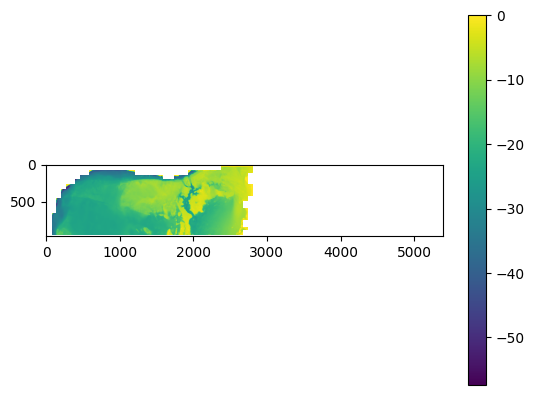

In [ ]:
# Visualize the reshaped zeroed_patches_test array
plt.imshow(reconstructed_test_area[:,:,12])
plt.colorbar()
plt.show()

In [ ]:
# Split the zeroed_patches array into inputs and targets
X_train = zeroed_patches_train[:, :, :, :-1]
y_train = zeroed_patches_train[:, :, :, -1]
y_train = tf.reshape(y_train, (-1, patch_size[0], patch_size[1], 1))

X_test = zeroed_patches_test[:, :, :, :-1]
y_test = zeroed_patches_test[:, :, :, -1]
y_test = tf.reshape(y_test, (-1, patch_size[0], patch_size[1], 1))

# # Calculate the number of samples in the validation set
val_samples = int(X_train.shape[0] * 0.25)

# # Split the training data into training and validation sets
X_val = X_train[-val_samples:, :, :, :]
y_val = y_train[-val_samples:, :, :, :]
X_train = X_train[:-val_samples, :, :, :]
y_train = y_train[:-val_samples, :, :, :]

In [ ]:
######## UNET ###########
from tensorflow.keras import layers

def get_model(img_size):
    inputs = keras.Input(shape=img_size)

    ### [First half of the network: downsampling inputs] ###

    # Entry block
    x = layers.Conv2D(32, 3, strides=2, padding="same")(inputs)
    x = layers.Activation("relu")(x)

    previous_block_activation = x  # Set aside residual

    # Blocks 1, 2, 3 are identical apart from the feature depth.
    for filters in [64, 128, 256]:
        x = layers.Activation("relu")(x)
        x = layers.SeparableConv2D(filters, 3, padding="same")(x)

        x = layers.Activation("relu")(x)
        x = layers.SeparableConv2D(filters, 3, padding="same")(x)

        x = layers.MaxPooling2D(3, strides=2, padding="same")(x)

        # Project residual
        residual = layers.Conv2D(filters, 1, strides=2, padding="same")(
            previous_block_activation
        )
        x = layers.add([x, residual])  # Add back residual
        previous_block_activation = x  # Set aside next residual

    ### [Second half of the network: upsampling inputs] ###

    for filters in [256, 128, 64, 32]:
        x = layers.Activation("relu")(x)
        x = layers.Conv2DTranspose(filters, 3, padding="same")(x)

        x = layers.Activation("relu")(x)
        x = layers.Conv2DTranspose(filters, 3, padding="same")(x)

        x = layers.UpSampling2D(2)(x)

        # Project residual
        residual = layers.UpSampling2D(2)(previous_block_activation)
        residual = layers.Conv2D(filters, 1, padding="same")(residual)
        x = layers.add([x, residual])  # Add back residual
        previous_block_activation = x  # Set aside next residual

    # Add a per-pixel regression layer
    outputs = layers.Conv2D(1, 1, activation="linear", padding="same")(x)

    # Define the model
    model = keras.Model(inputs, outputs)
    return model

# Free up RAM in case the model definition cells were run multiple times
keras.backend.clear_session()

# Build model
model = get_model((64, 64, 12))
model.compile(optimizer=tf.keras.optimizers.Adam(lr=0.001), loss=masked_rmse)
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 64, 64, 12)  0           []                               
                                ]                                                                 
                                                                                                  
 conv2d (Conv2D)                (None, 32, 32, 32)   3488        ['input_1[0][0]']                
                                                                                                  
 activation (Activation)        (None, 32, 32, 32)   0           ['conv2d[0][0]']                 
                                                                                                  
 activation_1 (Activation)      (None, 32, 32, 32)   0           ['activation[0][0]']         

In [ ]:
import random
# Set random seed for NumPy
np.random.seed(1)
# Set random seed for Python's built-in random module
random.seed(1)
# Set random seed for TensorFlow
tf.random.set_seed(1)

keras.backend.clear_session()

model.compile(optimizer=keras.optimizers.Adam(lr=0.001), loss=masked_rmse)

# Train the model on the training data
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_val, y_val))

# Evaluate the model on the testing data
predictions = model.predict(X_test)
print(predictions.shape)

Epoch 1/100
39/39 [==============================] - 16s 82ms/step - loss: 238.6301 - val_loss: 8.8052
Epoch 2/100
39/39 [==============================] - 1s 26ms/step - loss: 6.1415 - val_loss: 6.1602
Epoch 3/100
39/39 [==============================] - 1s 27ms/step - loss: 6.3090 - val_loss: 6.0940
Epoch 4/100
39/39 [==============================] - 1s 27ms/step - loss: 4.9906 - val_loss: 5.6712
Epoch 5/100
39/39 [==============================] - 1s 26ms/step - loss: 5.1773 - val_loss: 6.6014
Epoch 6/100
39/39 [==============================] - 1s 26ms/step - loss: 4.6540 - val_loss: 5.6417
Epoch 7/100
39/39 [==============================] - 1s 26ms/step - loss: 4.5132 - val_loss: 5.2473
Epoch 8/100
39/39 [==============================] - 1s 26ms/step - loss: 4.3826 - val_loss: 5.2545
Epoch 9/100
39/39 [==============================] - 1s 26ms/step - loss: 4.0117 - val_loss: 5.4971
Epoch 10/100
39/39 [==============================] - 1s 26ms/step - loss: 3.9049 - val_loss: 4.8

In [ ]:
predictions = np.array(predictions)
y_test = np.array(y_test)
print(predictions.shape)

# Calculate the RMSE
rmse = np.sqrt(np.nanmean((predictions - y_test) ** 2))
print('RMSE:', rmse)

y_test_flat = y_test.flatten()
predictions_flat = predictions.flatten()
df_pred = pd.DataFrame(predictions_flat)
df_test = pd.DataFrame(y_test_flat)
df = pd.concat([df_test, df_pred], axis =1)
df2 = df.dropna() # Remove NaN values
df2.columns = ['Reference','Predicted']
df2= df2[df2['Reference'] < 0] # set max ref depth
df2= df2[df2['Predicted'] > -50] # set max ref depth
df2= df2[df2['Predicted'] < 0] # set max ref depth

#df2= df2[df2['Reference'] > -10] # set max ref depth
#df2 = df2.dropna() # Remove NaN values
df3 = df2.reset_index(drop=True)
df3['Error'] = df3['Predicted'] - df3['Reference']
df3
# Metrics
rmse = mean_squared_error(df3.Reference, df3.Predicted, squared=False)
r2 = metrics.r2_score(df3.Reference, df3.Predicted)
mae = np.mean(abs(df3.Reference - df3.Predicted))
print('MAE:',mae)
print('RMSE', rmse)
print('R2:',r2)

(554, 64, 64, 1)
RMSE: 4.748767120718453
MAE: 2.451215697545397
RMSE 3.8720223635505784
R2: 0.8054826439449704


In [ ]:
####### RESHAPE PREDICTIONS

# Get the shape of the original test area image
test_area_shape = image_1.shape

# Create a new array with the same shape as the test area image, filled with NaN values
reconstructed_test_area = np.full(test_area_shape, np.nan)

# Calculate the number of patches in each dimension
n_rows = (test_area_shape[0] - patch_size[0]) // patch_size[0] + 1
n_cols = (test_area_shape[1] - patch_size[1]) // patch_size[1] + 1

# Create a mask with True values for the removed patches
removed_mask = np.zeros((n_rows, n_cols), dtype=bool)
removed_mask[np.unravel_index(removed_indices, (n_rows, n_cols))] = True

# Loop over the patches and fill in the corresponding elements in the reconstructed test area
patch_index = 0
for i in range(0, test_area_shape[0] - patch_size[0] + 1, patch_size[0]):
    for j in range(0, test_area_shape[1] - patch_size[1] + 1, patch_size[1]):
        if not removed_mask[i // patch_size[0], j // patch_size[1]]:
            # If the patch was not removed, use the corresponding patch from zeroed_patches_test
            patch = predictions[patch_index, :, :, :]
            reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = patch
            patch_index += 1
        else:
            # If the patch was removed, fill in the corresponding region with NaNs
            reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = np.nan

pred_image_1 = reconstructed_test_area

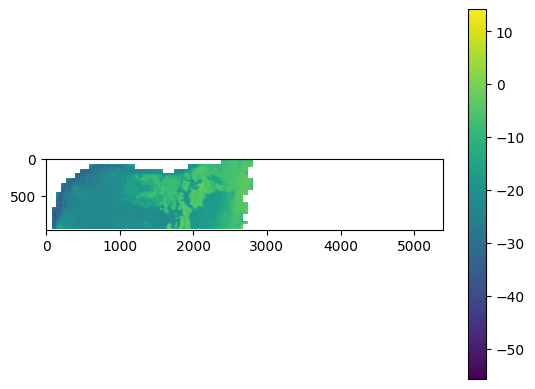

In [ ]:
# Visualize the reshaped zeroed_patches_test array
plt.imshow(reconstructed_test_area[:,:,12])
plt.colorbar()
plt.show()

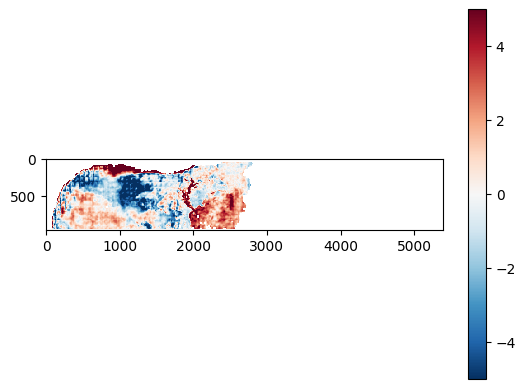

In [ ]:
error = reconstructed_test_area[:,:,12] - image2[70:1035,:, 12]

# Visualize the reshaped zeroed_patches_test array
import matplotlib.colors as mcolors
norm = mcolors.TwoSlopeNorm(vmin=-5, vmax = 5, vcenter=0)
pc = plt.imshow(error, norm=norm, cmap="RdBu_r")
plt.colorbar(pc)

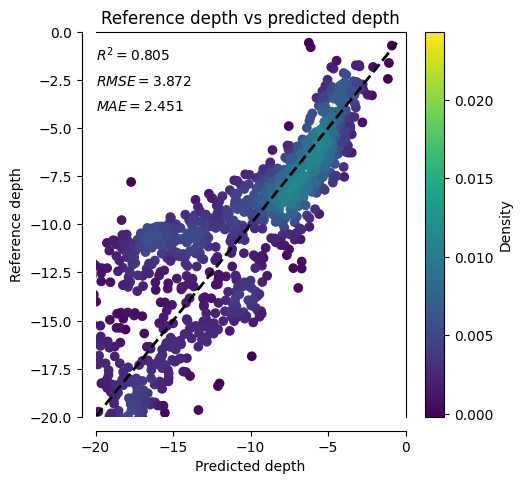

In [ ]:
df3_sample = df3.sample(n = 2000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-20,0])
    ax.set_ylim([-20,0])
    ax.set_xlabel("Predicted depth")
    ax.set_ylabel("Reference depth")
    ax.annotate("$R^2={:.3f}$".format(r2), (-20, -1.5))
    ax.annotate("$RMSE={:.3f}$".format(rmse), (-20, -2.8))
    ax.annotate("$MAE={:.3f}$".format(mae), (-20, -4.1))

    ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
    plt.title("Reference depth vs predicted depth")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('linear_regression.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Predicted'], df3_sample['Reference'], bins = [30,30])

### Image 2

In [ ]:
### IMAGE 2
image_no_2 = np.copy(image2)
# Set pixels in specified slice to NaN
image_no_2[1035:2000,:,:] = np.nan
image_2 = image2[1035:2000,:,:]


In [ ]:
# Define the patch size
patch_size = (64, 64, 13)

# Extract the patches for train area
patches_train = extract_patches(image_no_2, patch_size)
print('Number of patches:', patches_train.shape[0])
print('Patch shape:', patches_train.shape[1:])
# Remove patches with more than 70% NaN values
kept_patches_train, removed_indices = remove_patches_with_too_many_NaN(patches_train, threshold=0.7)
print(kept_patches_train.shape)
# Set the NaN values in the kept patches to 0
zeroed_patches_train = set_NaN_to_zero(kept_patches_train)
print(zeroed_patches_train.shape)

Number of patches: 4956
Patch shape: (64, 64, 13)
(1640, 64, 64, 13)
(1640, 64, 64, 13)


In [ ]:
# Extract the patches for test area
patches_test = extract_patches(image_2, patch_size)
print('Number of patches:', patches_test.shape[0])
print('Patch shape:', patches_test.shape[1:])
# Remove patches with more than 70% NaN values
kept_patches_test, removed_indices = remove_patches_with_too_many_NaN(patches_test, threshold=0.7)
print(kept_patches_test.shape)
# Set the NaN values in the kept patches to 0
zeroed_patches_test = set_NaN_to_zero(kept_patches_test)
print(zeroed_patches_test.shape)

Number of patches: 1260
Patch shape: (64, 64, 13)
(554, 64, 64, 13)
(554, 64, 64, 13)


In [ ]:
  # Get the shape of the original test area image
  test_area_shape = image_2.shape

  # Create a new array with the same shape as the test area image, filled with NaN values
  reconstructed_test_area = np.full(test_area_shape, np.nan)

  # Calculate the number of patches in each dimension
  n_rows = (test_area_shape[0] - patch_size[0]) // patch_size[0] + 1
  n_cols = (test_area_shape[1] - patch_size[1]) // patch_size[1] + 1

  # Create a mask with True values for the removed patches
  removed_mask = np.zeros((n_rows, n_cols), dtype=bool)
  removed_mask[np.unravel_index(removed_indices, (n_rows, n_cols))] = True

  # Loop over the patches and fill in the corresponding elements in the reconstructed test area
  patch_index = 0
  for i in range(0, test_area_shape[0] - patch_size[0] + 1, patch_size[0]):
      for j in range(0, test_area_shape[1] - patch_size[1] + 1, patch_size[1]):
          if not removed_mask[i // patch_size[0], j // patch_size[1]]:
              # If the patch was not removed, use the corresponding patch from zeroed_patches_test
              patch = zeroed_patches_test[patch_index, :, :, :]
              reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = patch
              patch_index += 1
          else:
              # If the patch was removed, fill in the corresponding region with NaNs
              reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = np.nan

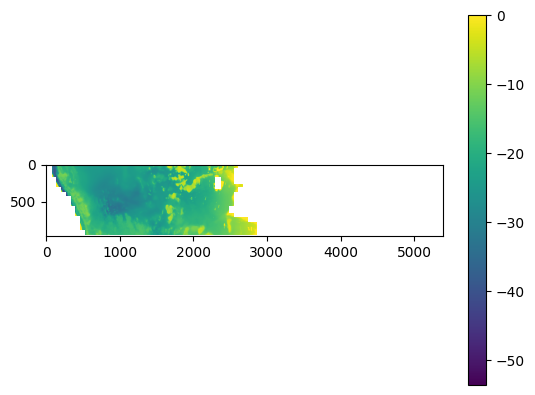

In [ ]:
# Visualize the reshaped zeroed_patches_test array
plt.imshow(reconstructed_test_area[:,:,12])
plt.colorbar()
plt.show()

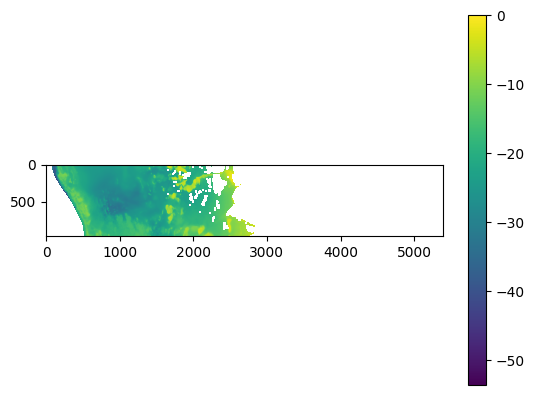

In [ ]:
# Visualize the reshaped zeroed_patches_test array
plt.imshow(image_2[:,:,12])
plt.colorbar()
plt.show()

In [ ]:
# Split the zeroed_patches array into inputs and targets
X_train = zeroed_patches_train[:, :, :, :-1]
y_train = zeroed_patches_train[:, :, :, -1]
y_train = tf.reshape(y_train, (-1, patch_size[0], patch_size[1], 1))

X_test = zeroed_patches_test[:, :, :, :-1]
y_test = zeroed_patches_test[:, :, :, -1]
y_test = tf.reshape(y_test, (-1, patch_size[0], patch_size[1], 1))

# # Calculate the number of samples in the validation set
val_samples = int(X_train.shape[0] * 0.25)

# # Split the training data into training and validation sets
X_val = X_train[-val_samples:, :, :, :]
y_val = y_train[-val_samples:, :, :, :]
X_train = X_train[:-val_samples, :, :, :]
y_train = y_train[:-val_samples, :, :, :]

In [ ]:
######## UNET ###########
from tensorflow.keras import layers

def get_model(img_size):
    inputs = keras.Input(shape=img_size)

    ### [First half of the network: downsampling inputs] ###

    # Entry block
    x = layers.Conv2D(32, 3, strides=2, padding="same")(inputs)
    x = layers.Activation("relu")(x)

    previous_block_activation = x  # Set aside residual

    # Blocks 1, 2, 3 are identical apart from the feature depth.
    for filters in [64, 128, 256]:
        x = layers.Activation("relu")(x)
        x = layers.SeparableConv2D(filters, 3, padding="same")(x)

        x = layers.Activation("relu")(x)
        x = layers.SeparableConv2D(filters, 3, padding="same")(x)

        x = layers.MaxPooling2D(3, strides=2, padding="same")(x)

        # Project residual
        residual = layers.Conv2D(filters, 1, strides=2, padding="same")(
            previous_block_activation
        )
        x = layers.add([x, residual])  # Add back residual
        previous_block_activation = x  # Set aside next residual

    ### [Second half of the network: upsampling inputs] ###

    for filters in [256, 128, 64, 32]:
        x = layers.Activation("relu")(x)
        x = layers.Conv2DTranspose(filters, 3, padding="same")(x)

        x = layers.Activation("relu")(x)
        x = layers.Conv2DTranspose(filters, 3, padding="same")(x)

        x = layers.UpSampling2D(2)(x)

        # Project residual
        residual = layers.UpSampling2D(2)(previous_block_activation)
        residual = layers.Conv2D(filters, 1, padding="same")(residual)
        x = layers.add([x, residual])  # Add back residual
        previous_block_activation = x  # Set aside next residual

    # Add a per-pixel regression layer
    outputs = layers.Conv2D(1, 1, activation="linear", padding="same")(x)

    # Define the model
    model = keras.Model(inputs, outputs)
    return model

# Free up RAM in case the model definition cells were run multiple times
keras.backend.clear_session()

# Build model
model = get_model((64, 64, 12))
model.compile(optimizer=tf.keras.optimizers.Adam(lr=0.001), loss=masked_rmse)
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 64, 64, 12)  0           []                               
                                ]                                                                 
                                                                                                  
 conv2d (Conv2D)                (None, 32, 32, 32)   3488        ['input_1[0][0]']                
                                                                                                  
 activation (Activation)        (None, 32, 32, 32)   0           ['conv2d[0][0]']                 
                                                                                                  
 activation_1 (Activation)      (None, 32, 32, 32)   0           ['activation[0][0]']         

In [ ]:
import random
# Set random seed for NumPy
np.random.seed(1)
# Set random seed for Python's built-in random module
random.seed(1)
# Set random seed for TensorFlow
tf.random.set_seed(1)

keras.backend.clear_session()

model.compile(optimizer=keras.optimizers.Adam(lr=0.001), loss=masked_rmse)

# Train the model on the training data
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_val, y_val))

# Evaluate the model on the testing data
predictions = model.predict(X_test)
print(predictions.shape)

Epoch 1/100
39/39 [==============================] - 12s 83ms/step - loss: 201.5794 - val_loss: 7.8539
Epoch 2/100
39/39 [==============================] - 1s 27ms/step - loss: 6.1564 - val_loss: 5.3972
Epoch 3/100
39/39 [==============================] - 1s 27ms/step - loss: 5.2263 - val_loss: 5.2871
Epoch 4/100
39/39 [==============================] - 1s 27ms/step - loss: 4.5667 - val_loss: 6.2294
Epoch 5/100
39/39 [==============================] - 1s 27ms/step - loss: 4.4924 - val_loss: 6.1691
Epoch 6/100
39/39 [==============================] - 1s 27ms/step - loss: 4.7416 - val_loss: 6.8243
Epoch 7/100
39/39 [==============================] - 1s 27ms/step - loss: 4.1042 - val_loss: 5.3775
Epoch 8/100
39/39 [==============================] - 1s 27ms/step - loss: 3.6587 - val_loss: 5.0100
Epoch 9/100
39/39 [==============================] - 1s 27ms/step - loss: 3.7320 - val_loss: 5.0892
Epoch 10/100
39/39 [==============================] - 1s 27ms/step - loss: 3.5427 - val_loss: 4.6

In [ ]:
predictions = np.array(predictions)
y_test = np.array(y_test)
print(predictions.shape)

# Calculate the RMSE
rmse = np.sqrt(np.nanmean((predictions - y_test) ** 2))
print('RMSE:', rmse)

y_test_flat = y_test.flatten()
predictions_flat = predictions.flatten()
df_pred = pd.DataFrame(predictions_flat)
df_test = pd.DataFrame(y_test_flat)
df = pd.concat([df_test, df_pred], axis =1)
df2 = df.dropna() # Remove NaN values
df2.columns = ['Reference','Predicted']
df2= df2[df2['Reference'] < 0] # set max ref depth
df2= df2[df2['Predicted'] > -50] # set max ref depth
df2= df2[df2['Predicted'] < 0] # set max ref depth

#df2= df2[df2['Reference'] > -10] # set max ref depth
#df2 = df2.dropna() # Remove NaN values
df3 = df2.reset_index(drop=True)
df3['Error'] = df3['Predicted'] - df3['Reference']
df3
# Metrics
rmse = mean_squared_error(df3.Reference, df3.Predicted, squared=False)
r2 = metrics.r2_score(df3.Reference, df3.Predicted)
mae = np.mean(abs(df3.Reference - df3.Predicted))
print('MAE:',mae)
print('RMSE', rmse)
print('R2:',r2)

(554, 64, 64, 1)
RMSE: 4.978220230173482
MAE: 3.38945434036471
RMSE 4.360559072546114
R2: 0.5736942866048221


In [ ]:
####### RESHAPE PREDICTIONS

# Get the shape of the original test area image
test_area_shape = image_2.shape

# Create a new array with the same shape as the test area image, filled with NaN values
reconstructed_test_area = np.full(test_area_shape, np.nan)

# Calculate the number of patches in each dimension
n_rows = (test_area_shape[0] - patch_size[0]) // patch_size[0] + 1
n_cols = (test_area_shape[1] - patch_size[1]) // patch_size[1] + 1

# Create a mask with True values for the removed patches
removed_mask = np.zeros((n_rows, n_cols), dtype=bool)
removed_mask[np.unravel_index(removed_indices, (n_rows, n_cols))] = True

# Loop over the patches and fill in the corresponding elements in the reconstructed test area
patch_index = 0
for i in range(0, test_area_shape[0] - patch_size[0] + 1, patch_size[0]):
    for j in range(0, test_area_shape[1] - patch_size[1] + 1, patch_size[1]):
        if not removed_mask[i // patch_size[0], j // patch_size[1]]:
            # If the patch was not removed, use the corresponding patch from zeroed_patches_test
            patch = predictions[patch_index, :, :, :]
            reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = patch
            patch_index += 1
        else:
            # If the patch was removed, fill in the corresponding region with NaNs
            reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = np.nan

pred_image_2 = reconstructed_test_area

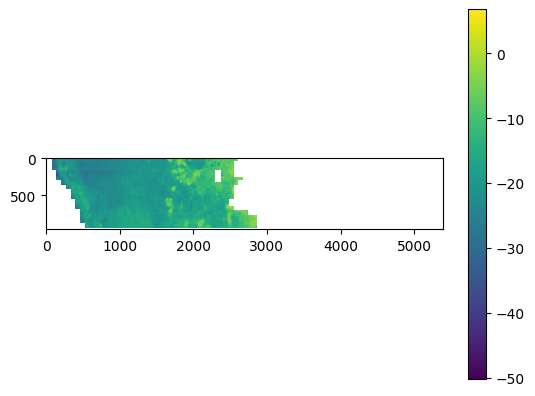

In [ ]:
# Visualize the reshaped zeroed_patches_test array
plt.imshow(reconstructed_test_area[:,:,12])
plt.colorbar()
plt.show()

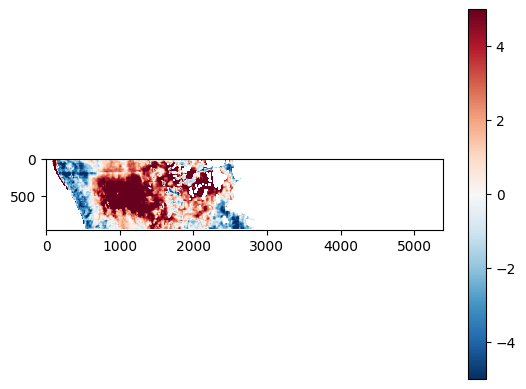

In [ ]:
error = reconstructed_test_area[:,:,12] - image2[1035:2000,:,12]

# Visualize the reshaped zeroed_patches_test array
import matplotlib.colors as mcolors
norm = mcolors.TwoSlopeNorm(vmin=-5, vmax = 5, vcenter=0)
pc = plt.imshow(error, norm=norm, cmap="RdBu_r")
plt.colorbar(pc)

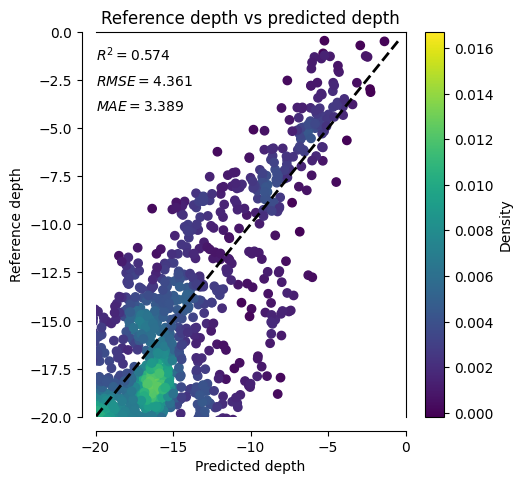

In [ ]:
df3_sample = df3.sample(n = 2000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-20,0])
    ax.set_ylim([-20,0])
    ax.set_xlabel("Predicted depth")
    ax.set_ylabel("Reference depth")
    ax.annotate("$R^2={:.3f}$".format(r2), (-20, -1.5))
    ax.annotate("$RMSE={:.3f}$".format(rmse), (-20, -2.8))
    ax.annotate("$MAE={:.3f}$".format(mae), (-20, -4.1))

    ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
    plt.title("Reference depth vs predicted depth")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('linear_regression.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Predicted'], df3_sample['Reference'], bins = [30,30])

### Image 3

In [ ]:
### IMAGE 2
image_no_3 = np.copy(image2)
# Set pixels in specified slice to NaN
image_no_3[2000:,:2800,:] = np.nan
image_3 = image2[2000:,:2800,:]


In [ ]:
# Define the patch size
patch_size = (64, 64, 13)

# Extract the patches for train area
patches_train = extract_patches(image_no_3, patch_size)
print('Number of patches:', patches_train.shape[0])
print('Patch shape:', patches_train.shape[1:])
# Remove patches with more than 70% NaN values
kept_patches_train, removed_indices = remove_patches_with_too_many_NaN(patches_train, threshold=0.7)
print(kept_patches_train.shape)
# Set the NaN values in the kept patches to 0
zeroed_patches_train = set_NaN_to_zero(kept_patches_train)
print(zeroed_patches_train.shape)

Number of patches: 4956
Patch shape: (64, 64, 13)
(1641, 64, 64, 13)
(1641, 64, 64, 13)


In [ ]:
# Extract the patches for test area
patches_test = extract_patches(image_3, patch_size)
print('Number of patches:', patches_test.shape[0])
print('Patch shape:', patches_test.shape[1:])
# Remove patches with more than 70% NaN values
kept_patches_test, removed_indices = remove_patches_with_too_many_NaN(patches_test, threshold=0.7)
print(kept_patches_test.shape)
# Set the NaN values in the kept patches to 0
zeroed_patches_test = set_NaN_to_zero(kept_patches_test)
print(zeroed_patches_test.shape)

Number of patches: 1161
Patch shape: (64, 64, 13)
(529, 64, 64, 13)
(529, 64, 64, 13)


In [ ]:
  # Get the shape of the original test area image
  test_area_shape = image_3.shape

  # Create a new array with the same shape as the test area image, filled with NaN values
  reconstructed_test_area = np.full(test_area_shape, np.nan)

  # Calculate the number of patches in each dimension
  n_rows = (test_area_shape[0] - patch_size[0]) // patch_size[0] + 1
  n_cols = (test_area_shape[1] - patch_size[1]) // patch_size[1] + 1

  # Create a mask with True values for the removed patches
  removed_mask = np.zeros((n_rows, n_cols), dtype=bool)
  removed_mask[np.unravel_index(removed_indices, (n_rows, n_cols))] = True

  # Loop over the patches and fill in the corresponding elements in the reconstructed test area
  patch_index = 0
  for i in range(0, test_area_shape[0] - patch_size[0] + 1, patch_size[0]):
      for j in range(0, test_area_shape[1] - patch_size[1] + 1, patch_size[1]):
          if not removed_mask[i // patch_size[0], j // patch_size[1]]:
              # If the patch was not removed, use the corresponding patch from zeroed_patches_test
              patch = zeroed_patches_test[patch_index, :, :, :]
              reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = patch
              patch_index += 1
          else:
              # If the patch was removed, fill in the corresponding region with NaNs
              reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = np.nan

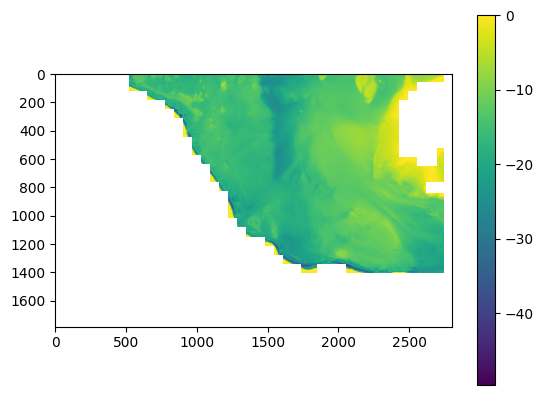

In [ ]:
# Visualize the reshaped zeroed_patches_test array
plt.imshow(reconstructed_test_area[:,:,12])
plt.colorbar()
plt.show()

In [ ]:
# Split the zeroed_patches array into inputs and targets
X_train = zeroed_patches_train[:, :, :, :-1]
y_train = zeroed_patches_train[:, :, :, -1]
y_train = tf.reshape(y_train, (-1, patch_size[0], patch_size[1], 1))

X_test = zeroed_patches_test[:, :, :, :-1]
y_test = zeroed_patches_test[:, :, :, -1]
y_test = tf.reshape(y_test, (-1, patch_size[0], patch_size[1], 1))

# # Calculate the number of samples in the validation set
val_samples = int(X_train.shape[0] * 0.25)

# # Split the training data into training and validation sets
X_val = X_train[-val_samples:, :, :, :]
y_val = y_train[-val_samples:, :, :, :]
X_train = X_train[:-val_samples, :, :, :]
y_train = y_train[:-val_samples, :, :, :]

In [ ]:
######## UNET ###########
from tensorflow.keras import layers

def get_model(img_size):
    inputs = keras.Input(shape=img_size)

    ### [First half of the network: downsampling inputs] ###

    # Entry block
    x = layers.Conv2D(32, 3, strides=2, padding="same")(inputs)
    x = layers.Activation("relu")(x)

    previous_block_activation = x  # Set aside residual

    # Blocks 1, 2, 3 are identical apart from the feature depth.
    for filters in [64, 128, 256]:
        x = layers.Activation("relu")(x)
        x = layers.SeparableConv2D(filters, 3, padding="same")(x)

        x = layers.Activation("relu")(x)
        x = layers.SeparableConv2D(filters, 3, padding="same")(x)

        x = layers.MaxPooling2D(3, strides=2, padding="same")(x)

        # Project residual
        residual = layers.Conv2D(filters, 1, strides=2, padding="same")(
            previous_block_activation
        )
        x = layers.add([x, residual])  # Add back residual
        previous_block_activation = x  # Set aside next residual

    ### [Second half of the network: upsampling inputs] ###

    for filters in [256, 128, 64, 32]:
        x = layers.Activation("relu")(x)
        x = layers.Conv2DTranspose(filters, 3, padding="same")(x)

        x = layers.Activation("relu")(x)
        x = layers.Conv2DTranspose(filters, 3, padding="same")(x)

        x = layers.UpSampling2D(2)(x)

        # Project residual
        residual = layers.UpSampling2D(2)(previous_block_activation)
        residual = layers.Conv2D(filters, 1, padding="same")(residual)
        x = layers.add([x, residual])  # Add back residual
        previous_block_activation = x  # Set aside next residual

    # Add a per-pixel regression layer
    outputs = layers.Conv2D(1, 1, activation="linear", padding="same")(x)

    # Define the model
    model = keras.Model(inputs, outputs)
    return model

# Free up RAM in case the model definition cells were run multiple times
keras.backend.clear_session()

# Build model
model = get_model((64, 64, 12))
model.compile(optimizer=tf.keras.optimizers.Adam(lr=0.001), loss=masked_rmse)
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 64, 64, 12)  0           []                               
                                ]                                                                 
                                                                                                  
 conv2d (Conv2D)                (None, 32, 32, 32)   3488        ['input_1[0][0]']                
                                                                                                  
 activation (Activation)        (None, 32, 32, 32)   0           ['conv2d[0][0]']                 
                                                                                                  
 activation_1 (Activation)      (None, 32, 32, 32)   0           ['activation[0][0]']         

In [ ]:
import random
# Set random seed for NumPy
np.random.seed(1)
# Set random seed for Python's built-in random module
random.seed(1)
# Set random seed for TensorFlow
tf.random.set_seed(1)

keras.backend.clear_session()

model.compile(optimizer=keras.optimizers.Adam(lr=0.001), loss=masked_rmse)

# Train the model on the training data
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_val, y_val))

# Evaluate the model on the testing data
predictions = model.predict(X_test)
print(predictions.shape)

Epoch 1/100
39/39 [==============================] - 11s 71ms/step - loss: 185.0871 - val_loss: 6.4221
Epoch 2/100
39/39 [==============================] - 1s 27ms/step - loss: 6.5505 - val_loss: 5.3638
Epoch 3/100
39/39 [==============================] - 1s 27ms/step - loss: 5.2299 - val_loss: 5.9284
Epoch 4/100
39/39 [==============================] - 1s 27ms/step - loss: 4.8570 - val_loss: 5.1601
Epoch 5/100
39/39 [==============================] - 1s 27ms/step - loss: 4.4908 - val_loss: 4.9944
Epoch 6/100
39/39 [==============================] - 1s 27ms/step - loss: 4.5593 - val_loss: 5.1199
Epoch 7/100
39/39 [==============================] - 1s 27ms/step - loss: 4.2834 - val_loss: 5.7121
Epoch 8/100
39/39 [==============================] - 1s 27ms/step - loss: 4.2204 - val_loss: 6.8409
Epoch 9/100
39/39 [==============================] - 1s 27ms/step - loss: 4.1204 - val_loss: 4.5809
Epoch 10/100
39/39 [==============================] - 1s 27ms/step - loss: 3.7243 - val_loss: 4.4

In [ ]:
predictions = np.array(predictions)
y_test = np.array(y_test)
print(predictions.shape)

# Calculate the RMSE
rmse = np.sqrt(np.nanmean((predictions - y_test) ** 2))
print('RMSE:', rmse)

y_test_flat = y_test.flatten()
predictions_flat = predictions.flatten()
df_pred = pd.DataFrame(predictions_flat)
df_test = pd.DataFrame(y_test_flat)
df = pd.concat([df_test, df_pred], axis =1)
df2 = df.dropna() # Remove NaN values
df2.columns = ['Reference','Predicted']
df2= df2[df2['Reference'] < 0] # set max ref depth
df2= df2[df2['Predicted'] > -50] # set max ref depth
df2= df2[df2['Predicted'] < 0] # set max ref depth

#df2= df2[df2['Reference'] > -10] # set max ref depth
#df2 = df2.dropna() # Remove NaN values
df3 = df2.reset_index(drop=True)
df3['Error'] = df3['Predicted'] - df3['Reference']
df3
# Metrics
rmse = mean_squared_error(df3.Reference, df3.Predicted, squared=False)
r2 = metrics.r2_score(df3.Reference, df3.Predicted)
mae = np.mean(abs(df3.Reference - df3.Predicted))
print('MAE:',mae)
print('RMSE', rmse)
print('R2:',r2)

(529, 64, 64, 1)
RMSE: 3.7976238259433055
MAE: 2.145008260383724
RMSE 2.8378741002203056
R2: 0.6681647580343748


In [ ]:
####### RESHAPE PREDICTIONS

# Get the shape of the original test area image
test_area_shape = image_3.shape

# Create a new array with the same shape as the test area image, filled with NaN values
reconstructed_test_area = np.full(test_area_shape, np.nan)

# Calculate the number of patches in each dimension
n_rows = (test_area_shape[0] - patch_size[0]) // patch_size[0] + 1
n_cols = (test_area_shape[1] - patch_size[1]) // patch_size[1] + 1

# Create a mask with True values for the removed patches
removed_mask = np.zeros((n_rows, n_cols), dtype=bool)
removed_mask[np.unravel_index(removed_indices, (n_rows, n_cols))] = True

# Loop over the patches and fill in the corresponding elements in the reconstructed test area
patch_index = 0
for i in range(0, test_area_shape[0] - patch_size[0] + 1, patch_size[0]):
    for j in range(0, test_area_shape[1] - patch_size[1] + 1, patch_size[1]):
        if not removed_mask[i // patch_size[0], j // patch_size[1]]:
            # If the patch was not removed, use the corresponding patch from zeroed_patches_test
            patch = predictions[patch_index, :, :, :]
            reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = patch
            patch_index += 1
        else:
            # If the patch was removed, fill in the corresponding region with NaNs
            reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = np.nan

pred_image_3 = reconstructed_test_area

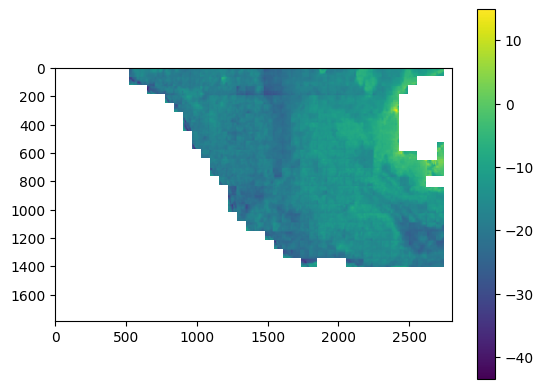

In [ ]:
# Visualize the reshaped zeroed_patches_test array
plt.imshow(reconstructed_test_area[:,:,12])
plt.colorbar()
plt.show()

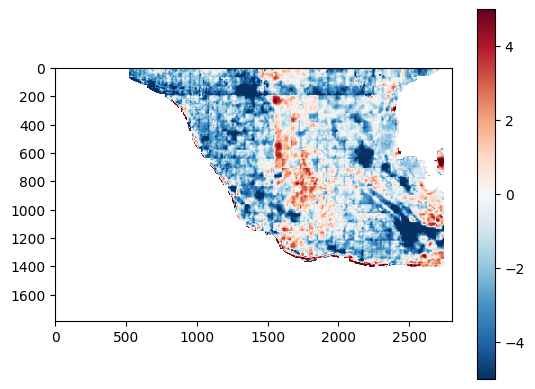

In [ ]:
error = reconstructed_test_area[:,:,12] - image2[2000:,:2800,12]
# Visualize the reshaped zeroed_patches_test array
import matplotlib.colors as mcolors
norm = mcolors.TwoSlopeNorm(vmin=-5, vmax = 5, vcenter=0)
pc = plt.imshow(error, norm=norm, cmap="RdBu_r")
plt.colorbar(pc)

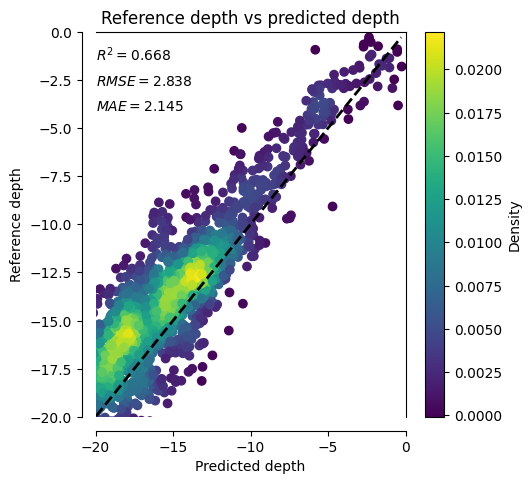

In [ ]:
df3_sample = df3.sample(n = 2000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-20,0])
    ax.set_ylim([-20,0])
    ax.set_xlabel("Predicted depth")
    ax.set_ylabel("Reference depth")
    ax.annotate("$R^2={:.3f}$".format(r2), (-20, -1.5))
    ax.annotate("$RMSE={:.3f}$".format(rmse), (-20, -2.8))
    ax.annotate("$MAE={:.3f}$".format(mae), (-20, -4.1))

    ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
    plt.title("Reference depth vs predicted depth")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('linear_regression.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Predicted'], df3_sample['Reference'], bins = [30,30])

### Image 4

In [ ]:
### IMAGE 4
image_no_4 = np.copy(image2)
image_no_4[2000:,2800:,:] = np.nan
image_4 = image2[2000:,2800:,:]

In [ ]:
# Define the patch size
patch_size = (64, 64, 13)

# Extract the patches for train area
patches_train = extract_patches(image_no_4, patch_size)
print('Number of patches:', patches_train.shape[0])
print('Patch shape:', patches_train.shape[1:])
# Remove patches with more than 70% NaN values
kept_patches_train, removed_indices = remove_patches_with_too_many_NaN(patches_train, threshold=0.7)
print(kept_patches_train.shape)
# Set the NaN values in the kept patches to 0
zeroed_patches_train = set_NaN_to_zero(kept_patches_train)
print(zeroed_patches_train.shape)

Number of patches: 4956
Patch shape: (64, 64, 13)
(1649, 64, 64, 13)
(1649, 64, 64, 13)


In [ ]:
# Extract the patches for test area
patches_test = extract_patches(image_4, patch_size)
print('Number of patches:', patches_test.shape[0])
print('Patch shape:', patches_test.shape[1:])
# Remove patches with more than 70% NaN values
kept_patches_test, removed_indices = remove_patches_with_too_many_NaN(patches_test, threshold=0.7)
print(kept_patches_test.shape)
# Set the NaN values in the kept patches to 0
zeroed_patches_test = set_NaN_to_zero(kept_patches_test)
print(zeroed_patches_test.shape)

Number of patches: 1080
Patch shape: (64, 64, 13)
(545, 64, 64, 13)
(545, 64, 64, 13)


In [ ]:
  # Get the shape of the original test area image
  test_area_shape = image_4.shape

  # Create a new array with the same shape as the test area image, filled with NaN values
  reconstructed_test_area = np.full(test_area_shape, np.nan)

  # Calculate the number of patches in each dimension
  n_rows = (test_area_shape[0] - patch_size[0]) // patch_size[0] + 1
  n_cols = (test_area_shape[1] - patch_size[1]) // patch_size[1] + 1

  # Create a mask with True values for the removed patches
  removed_mask = np.zeros((n_rows, n_cols), dtype=bool)
  removed_mask[np.unravel_index(removed_indices, (n_rows, n_cols))] = True

  # Loop over the patches and fill in the corresponding elements in the reconstructed test area
  patch_index = 0
  for i in range(0, test_area_shape[0] - patch_size[0] + 1, patch_size[0]):
      for j in range(0, test_area_shape[1] - patch_size[1] + 1, patch_size[1]):
          if not removed_mask[i // patch_size[0], j // patch_size[1]]:
              # If the patch was not removed, use the corresponding patch from zeroed_patches_test
              patch = zeroed_patches_test[patch_index, :, :, :]
              reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = patch
              patch_index += 1
          else:
              # If the patch was removed, fill in the corresponding region with NaNs
              reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = np.nan

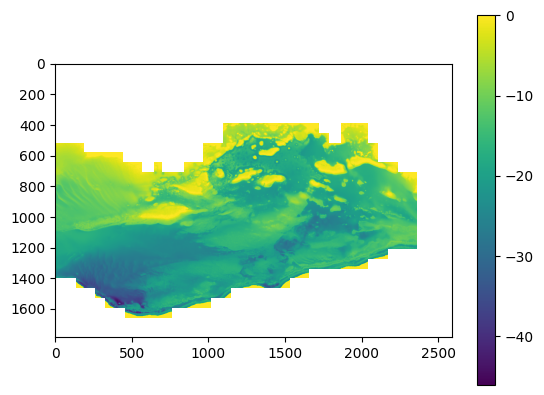

In [ ]:
# Visualize the reshaped zeroed_patches_test array
plt.imshow(reconstructed_test_area[:,:,12])
plt.colorbar()
plt.show()

In [ ]:
# Split the zeroed_patches array into inputs and targets
X_train = zeroed_patches_train[:, :, :, :-1]
y_train = zeroed_patches_train[:, :, :, -1]
y_train = tf.reshape(y_train, (-1, patch_size[0], patch_size[1], 1))

X_test = zeroed_patches_test[:, :, :, :-1]
y_test = zeroed_patches_test[:, :, :, -1]
y_test = tf.reshape(y_test, (-1, patch_size[0], patch_size[1], 1))

# # Calculate the number of samples in the validation set
val_samples = int(X_train.shape[0] * 0.25)

# # Split the training data into training and validation sets
X_val = X_train[-val_samples:, :, :, :]
y_val = y_train[-val_samples:, :, :, :]
X_train = X_train[:-val_samples, :, :, :]
y_train = y_train[:-val_samples, :, :, :]

In [ ]:
######## UNET ###########
from tensorflow.keras import layers

def get_model(img_size):
    inputs = keras.Input(shape=img_size)

    ### [First half of the network: downsampling inputs] ###

    # Entry block
    x = layers.Conv2D(32, 3, strides=2, padding="same")(inputs)
    x = layers.Activation("relu")(x)

    previous_block_activation = x  # Set aside residual

    # Blocks 1, 2, 3 are identical apart from the feature depth.
    for filters in [64, 128, 256]:
        x = layers.Activation("relu")(x)
        x = layers.SeparableConv2D(filters, 3, padding="same")(x)

        x = layers.Activation("relu")(x)
        x = layers.SeparableConv2D(filters, 3, padding="same")(x)

        x = layers.MaxPooling2D(3, strides=2, padding="same")(x)

        # Project residual
        residual = layers.Conv2D(filters, 1, strides=2, padding="same")(
            previous_block_activation
        )
        x = layers.add([x, residual])  # Add back residual
        previous_block_activation = x  # Set aside next residual

    ### [Second half of the network: upsampling inputs] ###

    for filters in [256, 128, 64, 32]:
        x = layers.Activation("relu")(x)
        x = layers.Conv2DTranspose(filters, 3, padding="same")(x)

        x = layers.Activation("relu")(x)
        x = layers.Conv2DTranspose(filters, 3, padding="same")(x)

        x = layers.UpSampling2D(2)(x)

        # Project residual
        residual = layers.UpSampling2D(2)(previous_block_activation)
        residual = layers.Conv2D(filters, 1, padding="same")(residual)
        x = layers.add([x, residual])  # Add back residual
        previous_block_activation = x  # Set aside next residual

    # Add a per-pixel regression layer
    outputs = layers.Conv2D(1, 1, activation="linear", padding="same")(x)

    # Define the model
    model = keras.Model(inputs, outputs)
    return model

# Free up RAM in case the model definition cells were run multiple times
keras.backend.clear_session()

# Build model
model = get_model((64, 64, 12))
model.compile(optimizer=tf.keras.optimizers.Adam(lr=0.001), loss=masked_rmse)
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 64, 64, 12)  0           []                               
                                ]                                                                 
                                                                                                  
 conv2d (Conv2D)                (None, 32, 32, 32)   3488        ['input_1[0][0]']                
                                                                                                  
 activation (Activation)        (None, 32, 32, 32)   0           ['conv2d[0][0]']                 
                                                                                                  
 activation_1 (Activation)      (None, 32, 32, 32)   0           ['activation[0][0]']         

In [ ]:
import random
# Set random seed for NumPy
np.random.seed(1)
# Set random seed for Python's built-in random module
random.seed(1)
# Set random seed for TensorFlow
tf.random.set_seed(1)

keras.backend.clear_session()

model.compile(optimizer=keras.optimizers.Adam(lr=0.001), loss=masked_rmse)

# Train the model on the training data
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_val, y_val))

# Evaluate the model on the testing data
predictions = model.predict(X_test)
print(predictions.shape)

Epoch 1/100
39/39 [==============================] - 10s 46ms/step - loss: 147.4403 - val_loss: 9.1051
Epoch 2/100
39/39 [==============================] - 1s 28ms/step - loss: 6.3887 - val_loss: 5.5889
Epoch 3/100
39/39 [==============================] - 1s 27ms/step - loss: 5.6061 - val_loss: 6.4154
Epoch 4/100
39/39 [==============================] - 1s 27ms/step - loss: 5.3500 - val_loss: 5.1968
Epoch 5/100
39/39 [==============================] - 1s 28ms/step - loss: 4.6816 - val_loss: 6.6356
Epoch 6/100
39/39 [==============================] - 1s 28ms/step - loss: 4.8400 - val_loss: 4.4837
Epoch 7/100
39/39 [==============================] - 1s 28ms/step - loss: 4.2131 - val_loss: 3.9239
Epoch 8/100
39/39 [==============================] - 1s 28ms/step - loss: 3.8433 - val_loss: 4.1610
Epoch 9/100
39/39 [==============================] - 1s 28ms/step - loss: 3.9514 - val_loss: 3.7603
Epoch 10/100
39/39 [==============================] - 1s 27ms/step - loss: 3.7873 - val_loss: 4.0

In [ ]:
predictions = np.array(predictions)
y_test = np.array(y_test)
print(predictions.shape)

# Calculate the RMSE
rmse = np.sqrt(np.nanmean((predictions - y_test) ** 2))
print('RMSE:', rmse)

y_test_flat = y_test.flatten()
predictions_flat = predictions.flatten()
df_pred = pd.DataFrame(predictions_flat)
df_test = pd.DataFrame(y_test_flat)
df = pd.concat([df_test, df_pred], axis =1)
df2 = df.dropna() # Remove NaN values
df2.columns = ['Reference','Predicted']
df2= df2[df2['Reference'] < 0] # set max ref depth
df2= df2[df2['Predicted'] > -50] # set max ref depth
df2= df2[df2['Predicted'] < 0] # set max ref depth

#df2= df2[df2['Reference'] > -10] # set max ref depth
#df2 = df2.dropna() # Remove NaN values
df3 = df2.reset_index(drop=True)
df3['Error'] = df3['Predicted'] - df3['Reference']
df3
# Metrics
rmse = mean_squared_error(df3.Reference, df3.Predicted, squared=False)
r2 = metrics.r2_score(df3.Reference, df3.Predicted)
mae = np.mean(abs(df3.Reference - df3.Predicted))
print('MAE:',mae)
print('RMSE', rmse)
print('R2:',r2)

(545, 64, 64, 1)
RMSE: 5.726126701415295
MAE: 3.4539892924853723
RMSE 4.860181828820149
R2: 0.5666845836771104


In [ ]:
####### RESHAPE PREDICTIONS

# Get the shape of the original test area image
test_area_shape = image_4.shape

# Create a new array with the same shape as the test area image, filled with NaN values
reconstructed_test_area = np.full(test_area_shape, np.nan)

# Calculate the number of patches in each dimension
n_rows = (test_area_shape[0] - patch_size[0]) // patch_size[0] + 1
n_cols = (test_area_shape[1] - patch_size[1]) // patch_size[1] + 1

# Create a mask with True values for the removed patches
removed_mask = np.zeros((n_rows, n_cols), dtype=bool)
removed_mask[np.unravel_index(removed_indices, (n_rows, n_cols))] = True

# Loop over the patches and fill in the corresponding elements in the reconstructed test area
patch_index = 0
for i in range(0, test_area_shape[0] - patch_size[0] + 1, patch_size[0]):
    for j in range(0, test_area_shape[1] - patch_size[1] + 1, patch_size[1]):
        if not removed_mask[i // patch_size[0], j // patch_size[1]]:
            # If the patch was not removed, use the corresponding patch from zeroed_patches_test
            patch = predictions[patch_index, :, :, :]
            reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = patch
            patch_index += 1
        else:
            # If the patch was removed, fill in the corresponding region with NaNs
            reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = np.nan

pred_image_4 = reconstructed_test_area

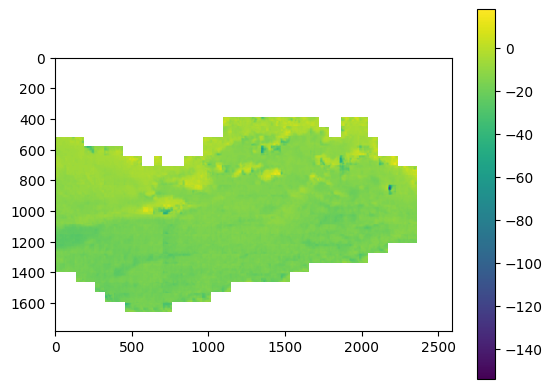

In [ ]:
# Visualize the reshaped zeroed_patches_test array
plt.imshow(reconstructed_test_area[:,:,12])
plt.colorbar()
plt.show()

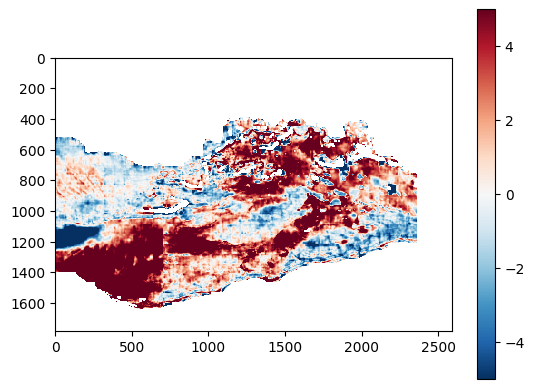

In [ ]:
error = reconstructed_test_area[:,:,12] - image2[2000:,2800:,12]

# Visualize the reshaped zeroed_patches_test array
import matplotlib.colors as mcolors
norm = mcolors.TwoSlopeNorm(vmin=-5, vmax = 5, vcenter=0)
pc = plt.imshow(error, norm=norm, cmap="RdBu_r")
plt.colorbar(pc)

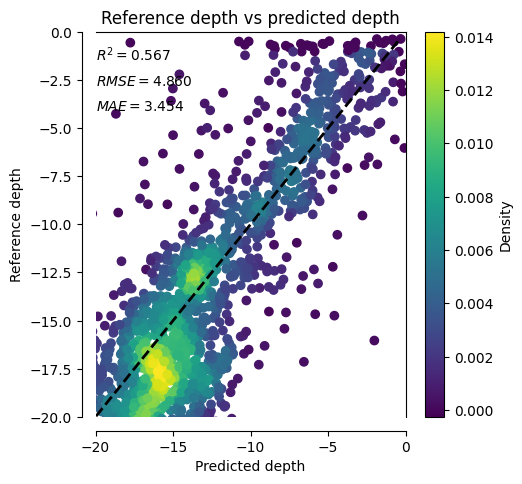

In [ ]:
df3_sample = df3.sample(n = 2000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-20,0])
    ax.set_ylim([-20,0])
    ax.set_xlabel("Predicted depth")
    ax.set_ylabel("Reference depth")
    ax.annotate("$R^2={:.3f}$".format(r2), (-20, -1.5))
    ax.annotate("$RMSE={:.3f}$".format(rmse), (-20, -2.8))
    ax.annotate("$MAE={:.3f}$".format(mae), (-20, -4.1))

    ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
    plt.title("Reference depth vs predicted depth")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('linear_regression.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Predicted'], df3_sample['Reference'], bins = [30,30])

### Reshape predictions

In [ ]:
print(pred_image_1.shape)
print(pred_image_2.shape)
print(pred_image_3.shape)
print(pred_image_4.shape)

(965, 5389, 13)
(965, 5389, 13)
(1783, 2800, 13)
(1783, 2589, 13)


In [ ]:
print(image_1.shape)
print(image_2.shape)
print(image_3.shape)
print(image_4.shape)

(965, 5389, 13)
(965, 5389, 13)
(1783, 2800, 13)
(1783, 2589, 13)


(3860, 5389)


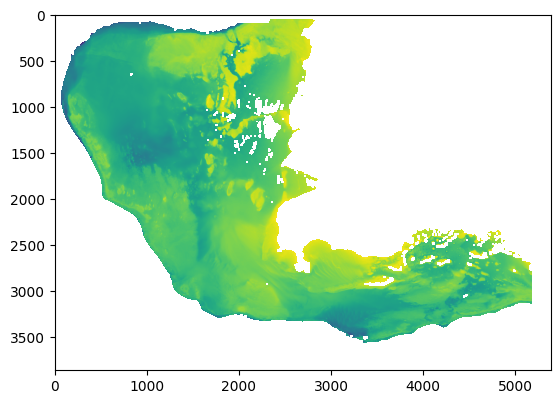

In [ ]:
ref_image_1 = image_1[:,:,-1]
ref_image_2 = image_2[:,:,-1]
ref_image_3 = image_3[:,:,-1]
ref_image_4 = image_4[:,:,-1]

ref_1_2 = np.concatenate((ref_image_1, ref_image_2), axis = 0)

ref_image_4_pad = np.pad(ref_image_4, [(0,0), (0,211)], 'constant', constant_values=(np.nan,))
ref_3_4 = np.concatenate((ref_image_3, ref_image_4_pad), axis = 1)
ref_3_4 = np.pad(ref_3_4, [(0,147), (0,0)], 'constant', constant_values=(np.nan,))
ref_3_4 = ref_3_4[:,0:5389]

ref_all = np.concatenate((ref_1_2, ref_3_4), axis = 0)
print(ref_all.shape)
pc = plt.imshow(ref_all)

In [ ]:
pred_image_1 = pred_image_1[:,:,-1]
pred_image_2 = pred_image_2[:,:,-1]
pred_image_3 = pred_image_3[:,:,-1]
pred_image_4 = pred_image_4[:,:,-1]

In [ ]:
print(pred_image_1.shape)
print(pred_image_2.shape)
print(pred_image_3.shape)
print(pred_image_4.shape)

(965, 5389)
(965, 5389)
(1783, 2800)
(1783, 2589)


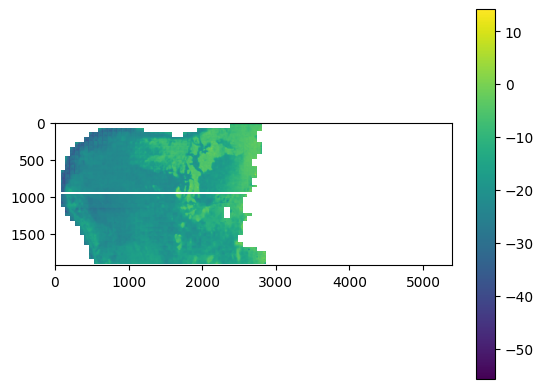

In [ ]:
y_pred_1_2 = np.concatenate((pred_image_1, pred_image_2), axis = 0)
pc = plt.imshow(y_pred_1_2)
plt.colorbar(pc)

In [ ]:
pred_image_4_pad = np.pad(pred_image_4, [(0,0), (0,211)], 'constant', constant_values=(np.nan,))

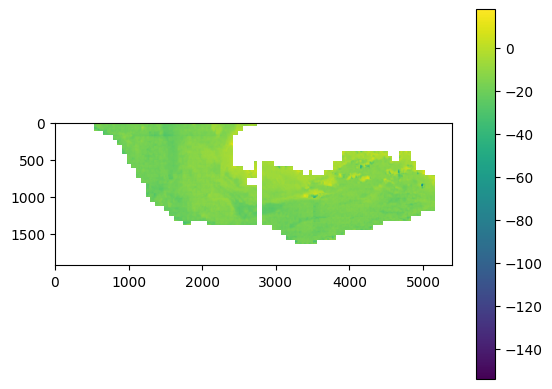

In [ ]:
y_pred_3_4 = np.concatenate((pred_image_3, pred_image_4_pad), axis = 1)
y_pred_3_4 = np.pad(y_pred_3_4, [(0,147), (0,0)], 'constant', constant_values=(np.nan,))
y_pred_3_4 = y_pred_3_4[:,0:5389]
pc = plt.imshow(y_pred_3_4)
plt.colorbar(pc)

In [ ]:
y_pred_all = np.concatenate((y_pred_1_2, y_pred_3_4), axis = 0)
y_pred_all.shape

(3860, 5389)

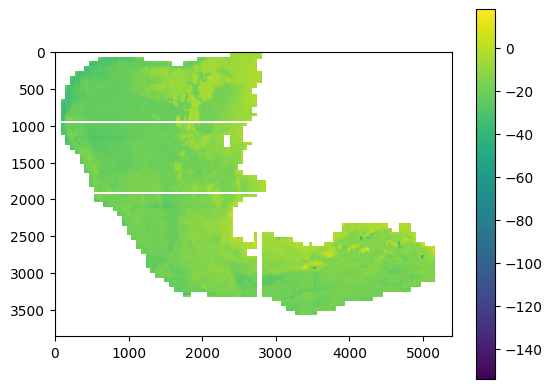

In [ ]:
pc = plt.imshow(y_pred_all)
plt.colorbar(pc)

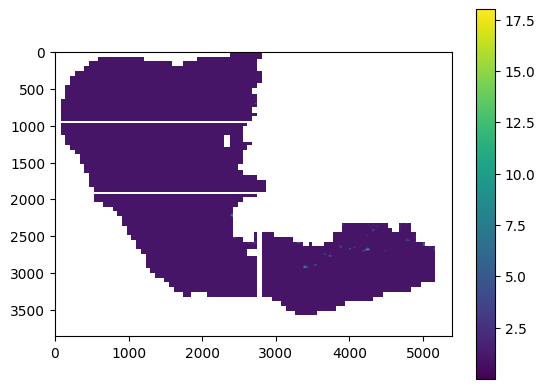

In [ ]:
y_pred_mask = y_pred_all.copy()

y_pred_mask[y_pred_mask <= 0] = 1
pc = plt.imshow(y_pred_mask)
plt.colorbar(pc)


In [ ]:
ref_all_masked = ref_all * y_pred_mask

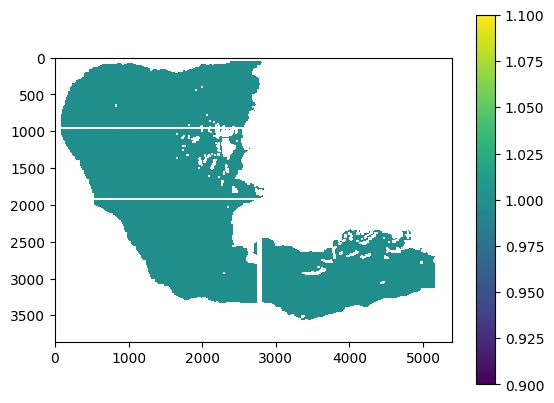

In [ ]:
ref_mask = ref_all_masked.copy()

ref_mask[ref_mask <= 0] = 1
pc = plt.imshow(ref_mask)
plt.colorbar(pc)

In [ ]:
y_pred_all_masked = y_pred_all * ref_mask

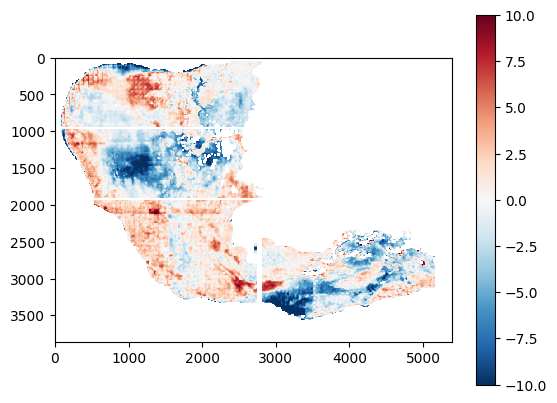

In [ ]:
error = ref_all_masked - y_pred_all_masked

# Visualize the reshaped zeroed_patches_test array
import matplotlib.colors as mcolors
norm = mcolors.TwoSlopeNorm(vmin=-10, vmax = 10, vcenter=0)
pc = plt.imshow(error, norm=norm, cmap="RdBu_r")
plt.colorbar(pc)

In [ ]:
np.save('/content/drive/My Drive/Metrics/9_UNet_median_unlimited.npy', y_pred_all_masked)

In [ ]:
np.save('/content/drive/My Drive/Metrics/9_UNet_error_unlimited.npy', error)

In [ ]:
np.save('/content/drive/My Drive/Metrics/9_UNet_reference_unlimited.npy', ref_all_masked)

In [ ]:
predictions = np.array(y_pred_all_masked)
y_test = np.array(ref_all_masked)
print(predictions.shape)

# Calculate the RMSE
rmse = np.sqrt(np.nanmean((predictions - y_test) ** 2))
print('RMSE:', rmse)

y_test_flat = y_test.flatten()
predictions_flat = predictions.flatten()
df_pred = pd.DataFrame(predictions_flat)
df_test = pd.DataFrame(y_test_flat)
df = pd.concat([df_test, df_pred], axis =1)
df2 = df.dropna() # Remove NaN values
df2.columns = ['Reference','Predicted']
df2= df2[df2['Reference'] < 0] # set max ref depth
df2= df2[df2['Predicted'] > -50] # set max ref depth
#df2= df2[df2['Reference'] > -20] # set max ref depth

df2= df2[df2['Predicted'] < 0] # set max ref depth

#df2= df2[df2['Reference'] > -10] # set max ref depth
#df2 = df2.dropna() # Remove NaN values
df3 = df2.reset_index(drop=True)
df3['Error'] = df3['Predicted'] - df3['Reference']
df3
# Metrics
rmse = mean_squared_error(df3.Reference, df3.Predicted, squared=False)
r2 = metrics.r2_score(df3.Reference, df3.Predicted)
mae = np.mean(abs(df3.Reference - df3.Predicted))
print('MAE:',mae)
print('RMSE', rmse)
print('R2:',r2)

(3860, 5389)
RMSE: 4.1598907197175885
MAE: 2.86301073437005
RMSE 4.05527938750071
R2: 0.6926827637617741


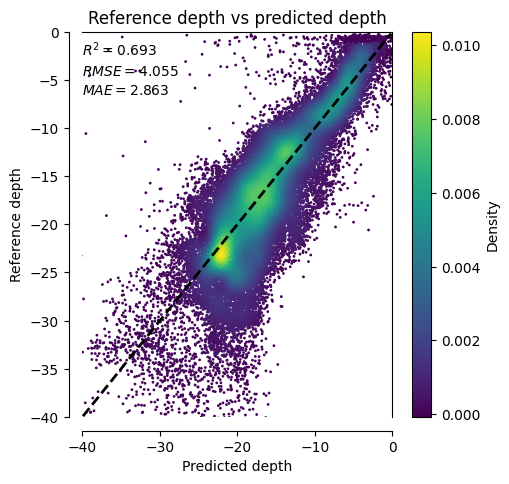

In [ ]:
df3_sample = df3.sample(n = 50000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-40,0])
    ax.set_ylim([-40,0])
    ax.set_xlabel("Predicted depth")
    ax.set_ylabel("Reference depth")
    ax.annotate("$R^2={:.3f}$".format(r2), (-40, -2.5))
    ax.annotate("$RMSE={:.3f}$".format(rmse), (-40, -4.5))
    ax.annotate("$MAE={:.3f}$".format(mae), (-40, -6.5))

    ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
    plt.title("Reference depth vs predicted depth")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('linear_regression.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Predicted'], df3_sample['Reference'], bins = [30,30], s = 1)

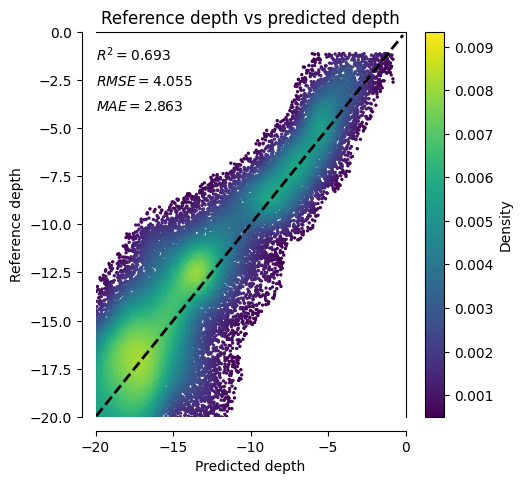

In [ ]:
df3_sample = df3.sample(n = 50000)

def density_scatter(x, y, threshold=0, ax=None, sort=True, bins=20, **kwargs):
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None:
        fig, ax = plt.subplots(figsize=(5, 5))
    data, x_e, y_e = np.histogram2d(x, y, bins=bins, density=True)
    z = interpn((0.5*(x_e[1:]+x_e[:-1]), 0.5*(y_e[1:]+y_e[:-1])), data, np.vstack([x, y]).T,
                method="splinef2d", bounds_error=False)

    # Filter pixels based on density threshold
    mask = z >= threshold
    x = x[mask]
    y = y[mask]
    z = z[mask]

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs)
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-20, 0])
    ax.set_ylim([-20, 0])
    ax.set_xlabel("Predicted depth")
    ax.set_ylabel("Reference depth")

    # Calculate regression metrics and add to plot
    ax.annotate("$R^2={:.3f}$".format(r2), (-20, -1.5))
    ax.annotate("$RMSE={:.3f}$".format(rmse), (-20, -2.8))
    ax.annotate("$MAE={:.3f}$".format(mae), (-20, -4.1))

    ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
    plt.title("Reference depth vs predicted depth")

    norm = Normalize(vmin=np.min(z), vmax=np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm=norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('linear_regression.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__:
    density_scatter(df3_sample['Predicted'], df3_sample['Reference'], threshold=0.0005, bins=[30, 30], s=2)


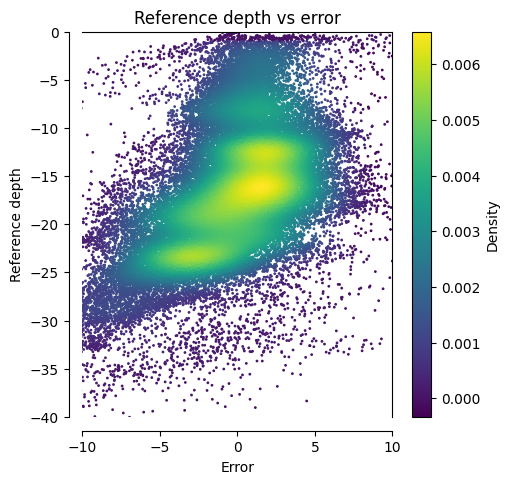

In [ ]:
# Depth vs error
#error.shape (1400,1400)
#reference.shape (1400, 1400)

error_flatten = error.flatten()
reference_flatten = ref_all_masked.flatten()

reference_df = pd.DataFrame(reference_flatten)
error_df = pd.DataFrame(error_flatten)

df = pd.concat([reference_df, error_df], axis=1) # Concatenate both dataframes
df2 = df.dropna() # Remove NaN values
df2.columns = ['Reference','Error']
df3 = df2.reset_index(drop=True)

df3_sample = df3.sample(n = 50000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-10,10])
    ax.set_ylim([-40,0])
    ax.set_xlabel("Error")
    ax.set_ylabel("Reference depth")
    ax.annotate("$R^2={:.3f}$".format(r2), (-20, -1.5))
    ax.annotate("$RMSE={:.3f}$".format(rmse), (-20, -2.8))
    ax.annotate("$MAE={:.3f}$".format(mae), (-20, -4.1))

    #ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
    plt.title("Reference depth vs error")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('linear_regression.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Error'], df3_sample['Reference'], bins = [30,30], s = 1)

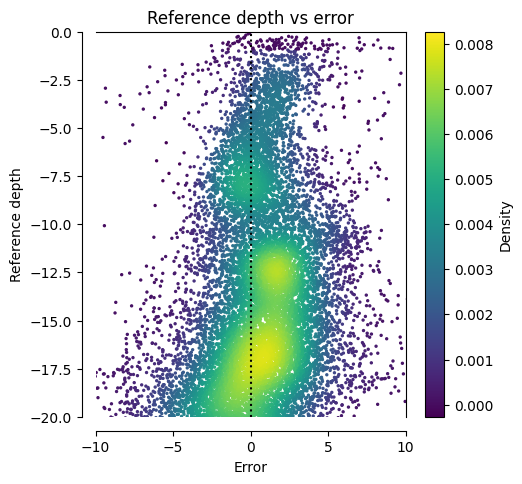

In [ ]:
df3_sample = df3.sample(n = 20000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-10,10])
    ax.set_ylim([-20,0])
    ax.set_xlabel("Error")
    ax.set_ylabel("Reference depth")
    ax.annotate("$R^2={:.3f}$".format(r2), (-20, -1.5))
    ax.annotate("$RMSE={:.3f}$".format(rmse), (-20, -2.8))
    ax.annotate("$MAE={:.3f}$".format(mae), (-20, -4.1))

    #ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
    plt.title("Reference depth vs error")
    plt.axvline(x=0, color='k', linestyle=':', label='axvline - dotted')
    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('linear_regression.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Error'], df3_sample['Reference'], bins = [30,30], s =2)

## S2 median image U-Net max 20m

In [ ]:
image2.shape

(3783, 5389, 13)

In [ ]:
image_20 = image2

In [ ]:
def clean_image(image):
    # Create a mask for the pixels where the last band is less than -20
    mask = image[:, :, 12] < -20
    image[mask, :] = np.nan
    return image

In [ ]:
image_20 = clean_image(image_20)
image_20 = np.transpose(image_20, (2, 0, 1))
image_20 = remove_nan(image_20)

In [ ]:
image_20 = np.transpose(image_20, (1, 2, 0))
image_20.shape

(3783, 5389, 13)

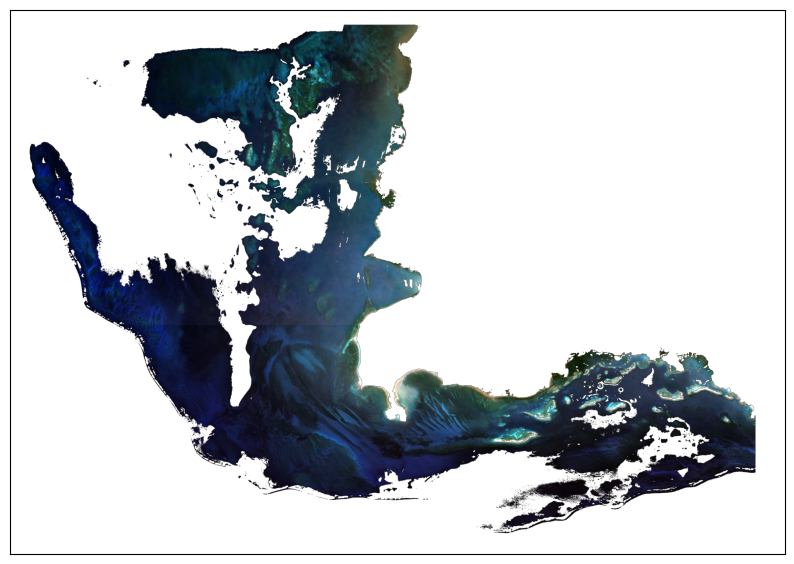

In [ ]:
image_t = np.transpose(image_20, (2, 0, 1))

ep.plot_rgb(image_t,
            rgb=(3, 2, 1),
            stretch=True,
            str_clip=0.2,
            figsize=(10, 16))
plt.show()

In [ ]:
image2 = image_20

In [ ]:
image_20 = image2

In [ ]:
# Take only the first 12 bands of image_20
image_20_data = image_20[:, :, :12]

# Create a mask for the pixels where band 13 is less than -20
mask = image_20[:, :, 12] < -20

# Set the values of these pixels to 0 for all bands
image_20_data[mask, :] = 0

# Concatenate the data with the modified band 13
image_20_cleaned = np.concatenate((image_20_data, np.expand_dims(image_20[:, :, 12], axis=-1)), axis=-1)

# Assign the cleaned data to the original image_20 array
image_20[:, :, :13] = image_20_cleaned
image_20[image_20 == 0] = np.nan

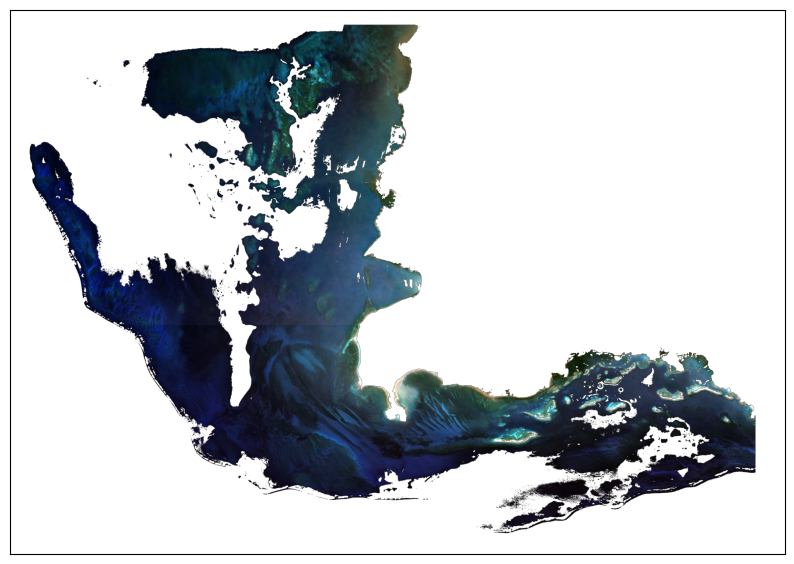

In [ ]:
image_t = np.transpose(image_20, (2, 0, 1))

ep.plot_rgb(image_t,
            rgb=(3, 2, 1),
            stretch=True,
            str_clip=0.2,
            figsize=(10, 16))
plt.show()

In [ ]:
def clean_image(image):
    # Create a mask for the pixels where the last band is less than -20
    mask = image[:, :, 12] < -20

    # Set the values of these pixels to 0 for all bands except the last one
    image[mask, :] = np.nan

    return image

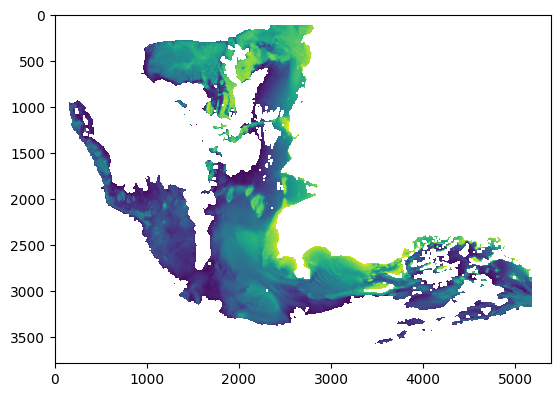

In [ ]:
# Visualize the reshaped zeroed_patches_test array
plt.imshow(image_20[:,:,12])

### Image 1

In [ ]:
## IMAGE 1
image_no_1 = np.copy(image2)
# Set pixels in specified slice to NaN
image_no_1[70:1035,:, :] = np.nan

# Train set
image_1 = image2[70:1035,:, :]


In [ ]:
# Define the patch size
patch_size = (64, 64, 13)

# Extract the patches for train area
patches_train = extract_patches(image_no_1, patch_size)
print('Number of patches:', patches_train.shape[0])
print('Patch shape:', patches_train.shape[1:])
# Remove patches with more than 70% NaN values
kept_patches_train, removed_indices = remove_patches_with_too_many_NaN(patches_train, threshold=0.7)
print(kept_patches_train.shape)
# Set the NaN values in the kept patches to 0
zeroed_patches_train = set_NaN_to_zero(kept_patches_train)
print(zeroed_patches_train.shape)

Number of patches: 4956
Patch shape: (64, 64, 13)
(1211, 64, 64, 13)
(1211, 64, 64, 13)


In [ ]:
# Extract the patches for test area
patches_test = extract_patches(image_1, patch_size)
print('Number of patches:', patches_test.shape[0])
print('Patch shape:', patches_test.shape[1:])
# Remove patches with more than 70% NaN values
kept_patches_test, removed_indices = remove_patches_with_too_many_NaN(patches_test, threshold=0.7)
print(kept_patches_test.shape)
# Set the NaN values in the kept patches to 0
zeroed_patches_test = set_NaN_to_zero(kept_patches_test)
print(zeroed_patches_test.shape)

Number of patches: 1260
Patch shape: (64, 64, 13)
(324, 64, 64, 13)
(324, 64, 64, 13)


In [ ]:
  # Get the shape of the original test area image
  test_area_shape = image_1.shape

  # Create a new array with the same shape as the test area image, filled with NaN values
  reconstructed_test_area = np.full(test_area_shape, np.nan)

  # Calculate the number of patches in each dimension
  n_rows = (test_area_shape[0] - patch_size[0]) // patch_size[0] + 1
  n_cols = (test_area_shape[1] - patch_size[1]) // patch_size[1] + 1

  # Create a mask with True values for the removed patches
  removed_mask = np.zeros((n_rows, n_cols), dtype=bool)
  removed_mask[np.unravel_index(removed_indices, (n_rows, n_cols))] = True

  # Loop over the patches and fill in the corresponding elements in the reconstructed test area
  patch_index = 0
  for i in range(0, test_area_shape[0] - patch_size[0] + 1, patch_size[0]):
      for j in range(0, test_area_shape[1] - patch_size[1] + 1, patch_size[1]):
          if not removed_mask[i // patch_size[0], j // patch_size[1]]:
              # If the patch was not removed, use the corresponding patch from zeroed_patches_test
              patch = zeroed_patches_test[patch_index, :, :, :]
              reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = patch
              patch_index += 1
          else:
              # If the patch was removed, fill in the corresponding region with NaNs
              reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = np.nan

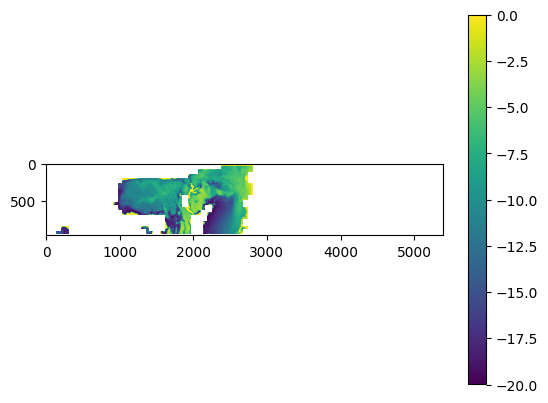

In [ ]:
# Visualize the reshaped zeroed_patches_test array
plt.imshow(reconstructed_test_area[:,:,12])
plt.colorbar()
plt.show()

In [ ]:
# Split the zeroed_patches array into inputs and targets
X_train = zeroed_patches_train[:, :, :, :-1]
y_train = zeroed_patches_train[:, :, :, -1]
y_train = tf.reshape(y_train, (-1, patch_size[0], patch_size[1], 1))

X_test = zeroed_patches_test[:, :, :, :-1]
y_test = zeroed_patches_test[:, :, :, -1]
y_test = tf.reshape(y_test, (-1, patch_size[0], patch_size[1], 1))

# # Calculate the number of samples in the validation set
val_samples = int(X_train.shape[0] * 0.25)

# # Split the training data into training and validation sets
X_val = X_train[-val_samples:, :, :, :]
y_val = y_train[-val_samples:, :, :, :]
X_train = X_train[:-val_samples, :, :, :]
y_train = y_train[:-val_samples, :, :, :]

In [ ]:
######## UNET ###########
from tensorflow.keras import layers
model_dir = '/content/drive/My Drive/Models/'

def get_model(img_size):
    inputs = keras.Input(shape=img_size)

    ### [First half of the network: downsampling inputs] ###

    # Entry block
    x = layers.Conv2D(32, 3, strides=2, padding="same")(inputs)
    x = layers.Activation("relu")(x)

    previous_block_activation = x  # Set aside residual

    # Blocks 1, 2, 3 are identical apart from the feature depth.
    for filters in [64, 128, 256]:
        x = layers.Activation("relu")(x)
        x = layers.SeparableConv2D(filters, 3, padding="same")(x)

        x = layers.Activation("relu")(x)
        x = layers.SeparableConv2D(filters, 3, padding="same")(x)

        x = layers.MaxPooling2D(3, strides=2, padding="same")(x)

        # Project residual
        residual = layers.Conv2D(filters, 1, strides=2, padding="same")(
            previous_block_activation
        )
        x = layers.add([x, residual])  # Add back residual
        previous_block_activation = x  # Set aside next residual

    ### [Second half of the network: upsampling inputs] ###

    for filters in [256, 128, 64, 32]:
        x = layers.Activation("relu")(x)
        x = layers.Conv2DTranspose(filters, 3, padding="same")(x)

        x = layers.Activation("relu")(x)
        x = layers.Conv2DTranspose(filters, 3, padding="same")(x)

        x = layers.UpSampling2D(2)(x)

        # Project residual
        residual = layers.UpSampling2D(2)(previous_block_activation)
        residual = layers.Conv2D(filters, 1, padding="same")(residual)
        x = layers.add([x, residual])  # Add back residual
        previous_block_activation = x  # Set aside next residual

    # Add a per-pixel regression layer
    outputs = layers.Conv2D(1, 1, activation="linear", padding="same")(x)

    # Define the model
    model = keras.Model(inputs, outputs)
    return model

# Free up RAM in case the model definition cells were run multiple times
keras.backend.clear_session()

# Build model
model = get_model((64, 64, 12))
model.compile(optimizer=tf.keras.optimizers.Adam(lr=0.001), loss=masked_rmse)
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 64, 64, 12)  0           []                               
                                ]                                                                 
                                                                                                  
 conv2d (Conv2D)                (None, 32, 32, 32)   3488        ['input_1[0][0]']                
                                                                                                  
 activation (Activation)        (None, 32, 32, 32)   0           ['conv2d[0][0]']                 
                                                                                                  
 activation_1 (Activation)      (None, 32, 32, 32)   0           ['activation[0][0]']         

In [ ]:
import random
# Set random seed for NumPy
np.random.seed(1)
# Set random seed for Python's built-in random module
random.seed(1)
# Set random seed for TensorFlow
tf.random.set_seed(1)

keras.backend.clear_session()

model.compile(optimizer=keras.optimizers.Adam(lr=0.001), loss=masked_rmse)

# Train the model on the training data
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_val, y_val))

# Evaluate the model on the testing data
predictions = model.predict(X_test)
print(predictions.shape)

Epoch 1/100
29/29 [==============================] - 22s 98ms/step - loss: 206.6458 - val_loss: 9.9139
Epoch 2/100
29/29 [==============================] - 1s 26ms/step - loss: 7.3795 - val_loss: 5.0140
Epoch 3/100
29/29 [==============================] - 1s 26ms/step - loss: 4.6235 - val_loss: 4.5155
Epoch 4/100
29/29 [==============================] - 1s 27ms/step - loss: 4.3957 - val_loss: 5.5709
Epoch 5/100
29/29 [==============================] - 1s 26ms/step - loss: 3.3482 - val_loss: 3.4512
Epoch 6/100
29/29 [==============================] - 1s 26ms/step - loss: 3.3534 - val_loss: 4.2507
Epoch 7/100
29/29 [==============================] - 1s 26ms/step - loss: 3.2677 - val_loss: 5.2048
Epoch 8/100
29/29 [==============================] - 1s 26ms/step - loss: 3.6841 - val_loss: 3.8067
Epoch 9/100
29/29 [==============================] - 1s 26ms/step - loss: 3.2393 - val_loss: 3.1654
Epoch 10/100
29/29 [==============================] - 1s 26ms/step - loss: 2.8742 - val_loss: 2.9

In [ ]:
predictions = np.array(predictions)
y_test = np.array(y_test)
print(predictions.shape)

# Calculate the RMSE
rmse = np.sqrt(np.nanmean((predictions - y_test) ** 2))
print('RMSE:', rmse)

y_test_flat = y_test.flatten()
predictions_flat = predictions.flatten()
df_pred = pd.DataFrame(predictions_flat)
df_test = pd.DataFrame(y_test_flat)
df = pd.concat([df_test, df_pred], axis =1)
df2 = df.dropna() # Remove NaN values
df2.columns = ['Reference','Predicted']
df2= df2[df2['Reference'] < 0] # set max ref depth
df2= df2[df2['Predicted'] > -50] # set max ref depth
df2= df2[df2['Predicted'] < 0] # set max ref depth

#df2= df2[df2['Reference'] > -10] # set max ref depth
#df2 = df2.dropna() # Remove NaN values
df3 = df2.reset_index(drop=True)
df3['Error'] = df3['Predicted'] - df3['Reference']
df3
# Metrics
rmse = mean_squared_error(df3.Reference, df3.Predicted, squared=False)
r2 = metrics.r2_score(df3.Reference, df3.Predicted)
mae = np.mean(abs(df3.Reference - df3.Predicted))
print('MAE:',mae)
print('RMSE', rmse)
print('R2:',r2)

(324, 64, 64, 1)
RMSE: 4.920311612762546
MAE: 1.695396934048877
RMSE 2.235287940921712
R2: 0.7766399049648692


In [ ]:
####### RESHAPE PREDICTIONS

# Get the shape of the original test area image
test_area_shape = image_1.shape

# Create a new array with the same shape as the test area image, filled with NaN values
reconstructed_test_area = np.full(test_area_shape, np.nan)

# Calculate the number of patches in each dimension
n_rows = (test_area_shape[0] - patch_size[0]) // patch_size[0] + 1
n_cols = (test_area_shape[1] - patch_size[1]) // patch_size[1] + 1

# Create a mask with True values for the removed patches
removed_mask = np.zeros((n_rows, n_cols), dtype=bool)
removed_mask[np.unravel_index(removed_indices, (n_rows, n_cols))] = True

# Loop over the patches and fill in the corresponding elements in the reconstructed test area
patch_index = 0
for i in range(0, test_area_shape[0] - patch_size[0] + 1, patch_size[0]):
    for j in range(0, test_area_shape[1] - patch_size[1] + 1, patch_size[1]):
        if not removed_mask[i // patch_size[0], j // patch_size[1]]:
            # If the patch was not removed, use the corresponding patch from zeroed_patches_test
            patch = predictions[patch_index, :, :, :]
            reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = patch
            patch_index += 1
        else:
            # If the patch was removed, fill in the corresponding region with NaNs
            reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = np.nan

pred_image_1 = reconstructed_test_area

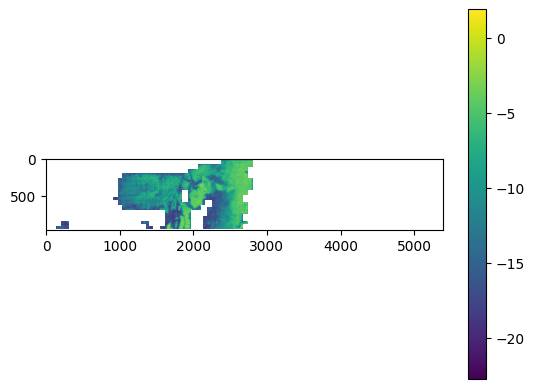

In [ ]:
# Visualize the reshaped zeroed_patches_test array
plt.imshow(reconstructed_test_area[:,:,12])
plt.colorbar()
plt.show()

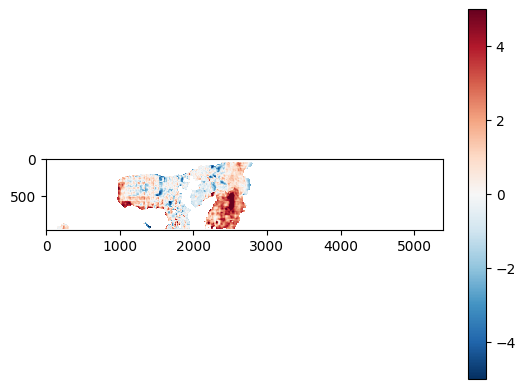

In [ ]:
error = reconstructed_test_area[:,:,12] - image2[70:1035,:, 12]

# Visualize the reshaped zeroed_patches_test array
import matplotlib.colors as mcolors
norm = mcolors.TwoSlopeNorm(vmin=-5, vmax = 5, vcenter=0)
pc = plt.imshow(error, norm=norm, cmap="RdBu_r")
plt.colorbar(pc)

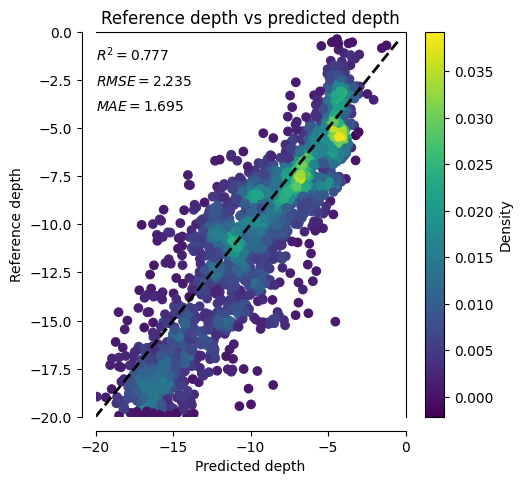

In [ ]:
df3_sample = df3.sample(n = 2000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-20,0])
    ax.set_ylim([-20,0])
    ax.set_xlabel("Predicted depth")
    ax.set_ylabel("Reference depth")
    ax.annotate("$R^2={:.3f}$".format(r2), (-20, -1.5))
    ax.annotate("$RMSE={:.3f}$".format(rmse), (-20, -2.8))
    ax.annotate("$MAE={:.3f}$".format(mae), (-20, -4.1))

    ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
    plt.title("Reference depth vs predicted depth")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('linear_regression.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Predicted'], df3_sample['Reference'], bins = [30,30])

### Image 2

In [ ]:
### IMAGE 2
image_no_2 = np.copy(image2)
# Set pixels in specified slice to NaN
image_no_2[1035:2000,:,:] = np.nan
image_2 = image2[1035:2000,:,:]


In [ ]:
# Define the patch size
patch_size = (64, 64, 13)

# Extract the patches for train area
patches_train = extract_patches(image_no_2, patch_size)
print('Number of patches:', patches_train.shape[0])
print('Patch shape:', patches_train.shape[1:])
# Remove patches with more than 70% NaN values
kept_patches_train, removed_indices = remove_patches_with_too_many_NaN(patches_train, threshold=0.7)
print(kept_patches_train.shape)
# Set the NaN values in the kept patches to 0
zeroed_patches_train = set_NaN_to_zero(kept_patches_train)
print(zeroed_patches_train.shape)

Number of patches: 4956
Patch shape: (64, 64, 13)
(1239, 64, 64, 13)
(1239, 64, 64, 13)


In [ ]:
# Extract the patches for test area
patches_test = extract_patches(image_2, patch_size)
print('Number of patches:', patches_test.shape[0])
print('Patch shape:', patches_test.shape[1:])
# Remove patches with more than 70% NaN values
kept_patches_test, removed_indices = remove_patches_with_too_many_NaN(patches_test, threshold=0.7)
print(kept_patches_test.shape)
# Set the NaN values in the kept patches to 0
zeroed_patches_test = set_NaN_to_zero(kept_patches_test)
print(zeroed_patches_test.shape)

Number of patches: 1260
Patch shape: (64, 64, 13)
(295, 64, 64, 13)
(295, 64, 64, 13)


In [ ]:
  # Get the shape of the original test area image
  test_area_shape = image_2.shape

  # Create a new array with the same shape as the test area image, filled with NaN values
  reconstructed_test_area = np.full(test_area_shape, np.nan)

  # Calculate the number of patches in each dimension
  n_rows = (test_area_shape[0] - patch_size[0]) // patch_size[0] + 1
  n_cols = (test_area_shape[1] - patch_size[1]) // patch_size[1] + 1

  # Create a mask with True values for the removed patches
  removed_mask = np.zeros((n_rows, n_cols), dtype=bool)
  removed_mask[np.unravel_index(removed_indices, (n_rows, n_cols))] = True

  # Loop over the patches and fill in the corresponding elements in the reconstructed test area
  patch_index = 0
  for i in range(0, test_area_shape[0] - patch_size[0] + 1, patch_size[0]):
      for j in range(0, test_area_shape[1] - patch_size[1] + 1, patch_size[1]):
          if not removed_mask[i // patch_size[0], j // patch_size[1]]:
              # If the patch was not removed, use the corresponding patch from zeroed_patches_test
              patch = zeroed_patches_test[patch_index, :, :, :]
              reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = patch
              patch_index += 1
          else:
              # If the patch was removed, fill in the corresponding region with NaNs
              reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = np.nan

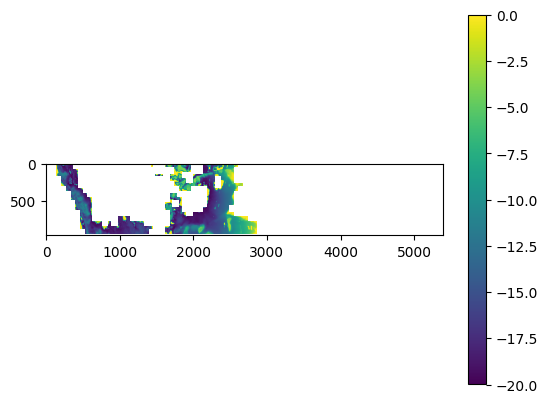

In [ ]:
# Visualize the reshaped zeroed_patches_test array
plt.imshow(reconstructed_test_area[:,:,12])
plt.colorbar()
plt.show()

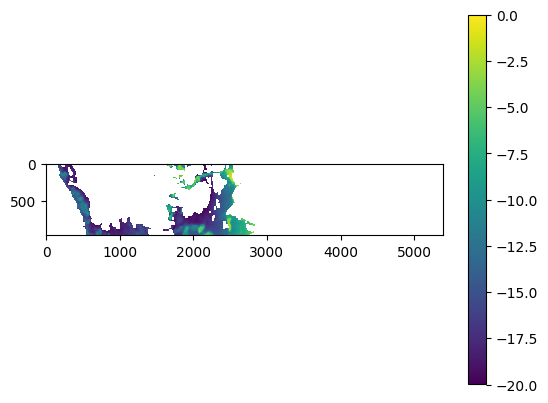

In [ ]:
# Visualize the reshaped zeroed_patches_test array
plt.imshow(image_2[:,:,12])
plt.colorbar()
plt.show()

In [ ]:
# Split the zeroed_patches array into inputs and targets
X_train = zeroed_patches_train[:, :, :, :-1]
y_train = zeroed_patches_train[:, :, :, -1]
y_train = tf.reshape(y_train, (-1, patch_size[0], patch_size[1], 1))

X_test = zeroed_patches_test[:, :, :, :-1]
y_test = zeroed_patches_test[:, :, :, -1]
y_test = tf.reshape(y_test, (-1, patch_size[0], patch_size[1], 1))

# # Calculate the number of samples in the validation set
val_samples = int(X_train.shape[0] * 0.25)

# # Split the training data into training and validation sets
X_val = X_train[-val_samples:, :, :, :]
y_val = y_train[-val_samples:, :, :, :]
X_train = X_train[:-val_samples, :, :, :]
y_train = y_train[:-val_samples, :, :, :]

In [ ]:
######## UNET ###########
from tensorflow.keras import layers
model_dir = '/content/drive/My Drive/Models/'

def get_model(img_size):
    inputs = keras.Input(shape=img_size)

    ### [First half of the network: downsampling inputs] ###

    # Entry block
    x = layers.Conv2D(32, 3, strides=2, padding="same")(inputs)
    x = layers.Activation("relu")(x)

    previous_block_activation = x  # Set aside residual

    # Blocks 1, 2, 3 are identical apart from the feature depth.
    for filters in [64, 128, 256]:
        x = layers.Activation("relu")(x)
        x = layers.SeparableConv2D(filters, 3, padding="same")(x)

        x = layers.Activation("relu")(x)
        x = layers.SeparableConv2D(filters, 3, padding="same")(x)

        x = layers.MaxPooling2D(3, strides=2, padding="same")(x)

        # Project residual
        residual = layers.Conv2D(filters, 1, strides=2, padding="same")(
            previous_block_activation
        )
        x = layers.add([x, residual])  # Add back residual
        previous_block_activation = x  # Set aside next residual

    ### [Second half of the network: upsampling inputs] ###

    for filters in [256, 128, 64, 32]:
        x = layers.Activation("relu")(x)
        x = layers.Conv2DTranspose(filters, 3, padding="same")(x)

        x = layers.Activation("relu")(x)
        x = layers.Conv2DTranspose(filters, 3, padding="same")(x)

        x = layers.UpSampling2D(2)(x)

        # Project residual
        residual = layers.UpSampling2D(2)(previous_block_activation)
        residual = layers.Conv2D(filters, 1, padding="same")(residual)
        x = layers.add([x, residual])  # Add back residual
        previous_block_activation = x  # Set aside next residual

    # Add a per-pixel regression layer
    outputs = layers.Conv2D(1, 1, activation="linear", padding="same")(x)

    # Define the model
    model = keras.Model(inputs, outputs)
    return model

# Free up RAM in case the model definition cells were run multiple times
keras.backend.clear_session()

# Build model
model = get_model((64, 64, 12))
model.compile(optimizer=tf.keras.optimizers.Adam(lr=0.001), loss=masked_rmse)
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 64, 64, 12)  0           []                               
                                ]                                                                 
                                                                                                  
 conv2d (Conv2D)                (None, 32, 32, 32)   3488        ['input_1[0][0]']                
                                                                                                  
 activation (Activation)        (None, 32, 32, 32)   0           ['conv2d[0][0]']                 
                                                                                                  
 activation_1 (Activation)      (None, 32, 32, 32)   0           ['activation[0][0]']         

In [ ]:
import random
# Set random seed for NumPy
np.random.seed(1)
# Set random seed for Python's built-in random module
random.seed(1)
# Set random seed for TensorFlow
tf.random.set_seed(1)

keras.backend.clear_session()

model.compile(optimizer=keras.optimizers.Adam(lr=0.001), loss=masked_rmse)

# Train the model on the training data
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_val, y_val))

# Evaluate the model on the testing data
predictions = model.predict(X_test)
print(predictions.shape)

Epoch 1/100
30/30 [==============================] - 11s 90ms/step - loss: 282.3603 - val_loss: 7.3250
Epoch 2/100
30/30 [==============================] - 1s 27ms/step - loss: 5.3231 - val_loss: 5.3840
Epoch 3/100
30/30 [==============================] - 1s 27ms/step - loss: 4.1668 - val_loss: 5.0005
Epoch 4/100
30/30 [==============================] - 1s 27ms/step - loss: 3.9892 - val_loss: 3.6734
Epoch 5/100
30/30 [==============================] - 1s 26ms/step - loss: 3.4381 - val_loss: 3.5553
Epoch 6/100
30/30 [==============================] - 1s 27ms/step - loss: 3.2584 - val_loss: 3.3256
Epoch 7/100
30/30 [==============================] - 1s 27ms/step - loss: 2.9634 - val_loss: 3.0815
Epoch 8/100
30/30 [==============================] - 1s 27ms/step - loss: 3.1318 - val_loss: 3.2693
Epoch 9/100
30/30 [==============================] - 1s 27ms/step - loss: 2.9225 - val_loss: 3.4502
Epoch 10/100
30/30 [==============================] - 1s 27ms/step - loss: 2.8289 - val_loss: 3.6

In [ ]:
predictions = np.array(predictions)
y_test = np.array(y_test)
print(predictions.shape)

# Calculate the RMSE
rmse = np.sqrt(np.nanmean((predictions - y_test) ** 2))
print('RMSE:', rmse)

y_test_flat = y_test.flatten()
predictions_flat = predictions.flatten()
df_pred = pd.DataFrame(predictions_flat)
df_test = pd.DataFrame(y_test_flat)
df = pd.concat([df_test, df_pred], axis =1)
df2 = df.dropna() # Remove NaN values
df2.columns = ['Reference','Predicted']
df2= df2[df2['Reference'] < 0] # set max ref depth
df2= df2[df2['Predicted'] > -50] # set max ref depth
df2= df2[df2['Predicted'] < 0] # set max ref depth

#df2= df2[df2['Reference'] > -10] # set max ref depth
#df2 = df2.dropna() # Remove NaN values
df3 = df2.reset_index(drop=True)
df3['Error'] = df3['Predicted'] - df3['Reference']
df3
# Metrics
rmse = mean_squared_error(df3.Reference, df3.Predicted, squared=False)
r2 = metrics.r2_score(df3.Reference, df3.Predicted)
mae = np.mean(abs(df3.Reference - df3.Predicted))
print('MAE:',mae)
print('RMSE', rmse)
print('R2:',r2)

(295, 64, 64, 1)
RMSE: 6.543214873409327
MAE: 2.269193373701052
RMSE 2.901515218669803
R2: 0.6460546937306288


In [ ]:
####### RESHAPE PREDICTIONS

# Get the shape of the original test area image
test_area_shape = image_2.shape

# Create a new array with the same shape as the test area image, filled with NaN values
reconstructed_test_area = np.full(test_area_shape, np.nan)

# Calculate the number of patches in each dimension
n_rows = (test_area_shape[0] - patch_size[0]) // patch_size[0] + 1
n_cols = (test_area_shape[1] - patch_size[1]) // patch_size[1] + 1

# Create a mask with True values for the removed patches
removed_mask = np.zeros((n_rows, n_cols), dtype=bool)
removed_mask[np.unravel_index(removed_indices, (n_rows, n_cols))] = True

# Loop over the patches and fill in the corresponding elements in the reconstructed test area
patch_index = 0
for i in range(0, test_area_shape[0] - patch_size[0] + 1, patch_size[0]):
    for j in range(0, test_area_shape[1] - patch_size[1] + 1, patch_size[1]):
        if not removed_mask[i // patch_size[0], j // patch_size[1]]:
            # If the patch was not removed, use the corresponding patch from zeroed_patches_test
            patch = predictions[patch_index, :, :, :]
            reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = patch
            patch_index += 1
        else:
            # If the patch was removed, fill in the corresponding region with NaNs
            reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = np.nan

pred_image_2 = reconstructed_test_area

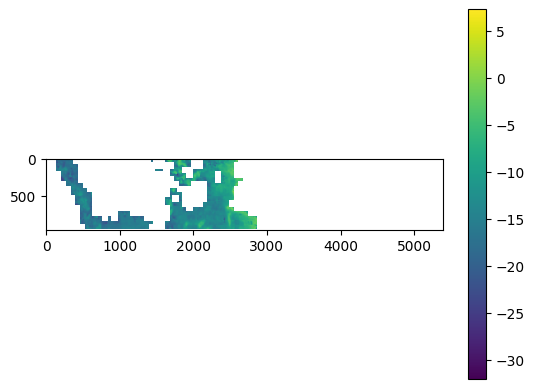

In [ ]:
# Visualize the reshaped zeroed_patches_test array
plt.imshow(reconstructed_test_area[:,:,12])
plt.colorbar()
plt.show()

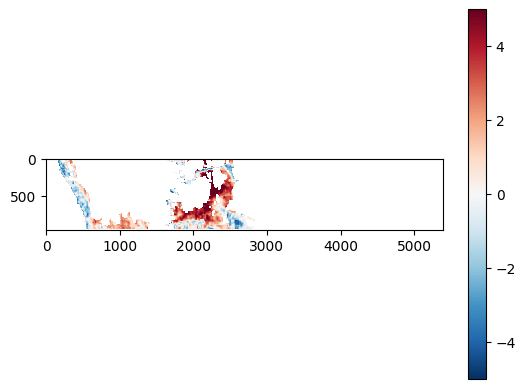

In [ ]:
error = reconstructed_test_area[:,:,12] - image2[1035:2000,:,12]

# Visualize the reshaped zeroed_patches_test array
import matplotlib.colors as mcolors
norm = mcolors.TwoSlopeNorm(vmin=-5, vmax = 5, vcenter=0)
pc = plt.imshow(error, norm=norm, cmap="RdBu_r")
plt.colorbar(pc)

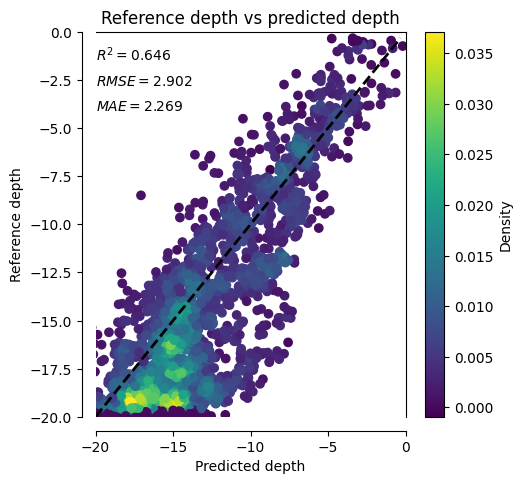

In [ ]:
df3_sample = df3.sample(n = 2000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-20,0])
    ax.set_ylim([-20,0])
    ax.set_xlabel("Predicted depth")
    ax.set_ylabel("Reference depth")
    ax.annotate("$R^2={:.3f}$".format(r2), (-20, -1.5))
    ax.annotate("$RMSE={:.3f}$".format(rmse), (-20, -2.8))
    ax.annotate("$MAE={:.3f}$".format(mae), (-20, -4.1))

    ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
    plt.title("Reference depth vs predicted depth")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('linear_regression.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Predicted'], df3_sample['Reference'], bins = [30,30])

### Image 3

In [ ]:
image2 = image_20
### IMAGE 2
image_no_3 = np.copy(image2)
# Set pixels in specified slice to NaN
image_no_3[2000:,:2800,:] = np.nan
image_3 = image2[2000:,:2800,:]



In [ ]:
# Define the patch size
patch_size = (64, 64, 13)

# Extract the patches for train area
patches_train = extract_patches(image_no_3, patch_size)
print('Number of patches:', patches_train.shape[0])
print('Patch shape:', patches_train.shape[1:])
# Remove patches with more than 70% NaN values
kept_patches_train, removed_indices = remove_patches_with_too_many_NaN(patches_train, threshold=0.7)
print(kept_patches_train.shape)
# Set the NaN values in the kept patches to 0
zeroed_patches_train = set_NaN_to_zero(kept_patches_train)
print(zeroed_patches_train.shape)

Number of patches: 4956
Patch shape: (64, 64, 13)
(1032, 64, 64, 13)
(1032, 64, 64, 13)


In [ ]:
# Extract the patches for test area
patches_test = extract_patches(image_3, patch_size)
print('Number of patches:', patches_test.shape[0])
print('Patch shape:', patches_test.shape[1:])
# Remove patches with more than 70% NaN values
kept_patches_test, removed_indices = remove_patches_with_too_many_NaN(patches_test, threshold=0.7)
print(kept_patches_test.shape)
# Set the NaN values in the kept patches to 0
zeroed_patches_test = set_NaN_to_zero(kept_patches_test)
print(zeroed_patches_test.shape)

Number of patches: 1161
Patch shape: (64, 64, 13)
(477, 64, 64, 13)
(477, 64, 64, 13)


In [ ]:
  # Get the shape of the original test area image
  test_area_shape = image_3.shape

  # Create a new array with the same shape as the test area image, filled with NaN values
  reconstructed_test_area = np.full(test_area_shape, np.nan)

  # Calculate the number of patches in each dimension
  n_rows = (test_area_shape[0] - patch_size[0]) // patch_size[0] + 1
  n_cols = (test_area_shape[1] - patch_size[1]) // patch_size[1] + 1

  # Create a mask with True values for the removed patches
  removed_mask = np.zeros((n_rows, n_cols), dtype=bool)
  removed_mask[np.unravel_index(removed_indices, (n_rows, n_cols))] = True

  # Loop over the patches and fill in the corresponding elements in the reconstructed test area
  patch_index = 0
  for i in range(0, test_area_shape[0] - patch_size[0] + 1, patch_size[0]):
      for j in range(0, test_area_shape[1] - patch_size[1] + 1, patch_size[1]):
          if not removed_mask[i // patch_size[0], j // patch_size[1]]:
              # If the patch was not removed, use the corresponding patch from zeroed_patches_test
              patch = zeroed_patches_test[patch_index, :, :, :]
              reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = patch
              patch_index += 1
          else:
              # If the patch was removed, fill in the corresponding region with NaNs
              reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = np.nan

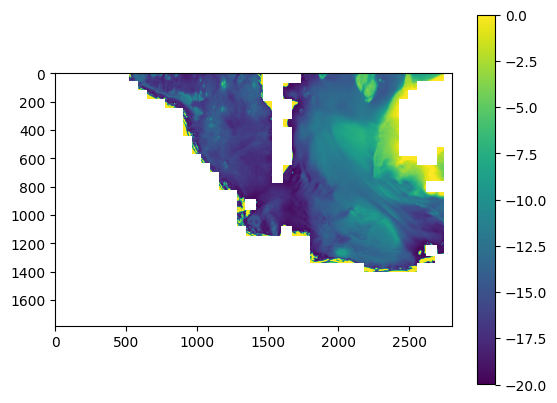

In [ ]:
# Visualize the reshaped zeroed_patches_test array
plt.imshow(reconstructed_test_area[:,:,12])
plt.colorbar()
plt.show()

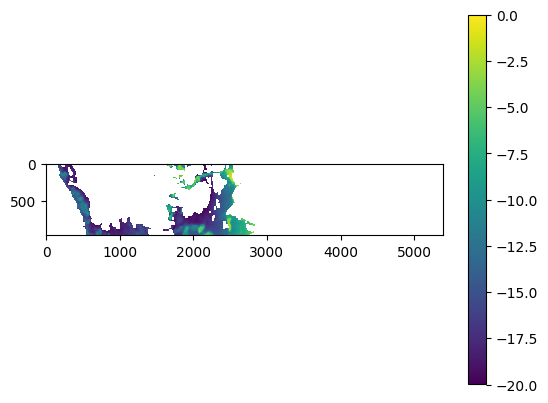

In [ ]:
# Visualize the reshaped zeroed_patches_test array
plt.imshow(image_2[:,:,12])
plt.colorbar()
plt.show()

In [ ]:
# Split the zeroed_patches array into inputs and targets
X_train = zeroed_patches_train[:, :, :, :-1]
y_train = zeroed_patches_train[:, :, :, -1]
y_train = tf.reshape(y_train, (-1, patch_size[0], patch_size[1], 1))

X_test = zeroed_patches_test[:, :, :, :-1]
y_test = zeroed_patches_test[:, :, :, -1]
y_test = tf.reshape(y_test, (-1, patch_size[0], patch_size[1], 1))

# # Calculate the number of samples in the validation set
val_samples = int(X_train.shape[0] * 0.25)

# # Split the training data into training and validation sets
X_val = X_train[-val_samples:, :, :, :]
y_val = y_train[-val_samples:, :, :, :]
X_train = X_train[:-val_samples, :, :, :]
y_train = y_train[:-val_samples, :, :, :]

In [ ]:
######## UNET ###########
from tensorflow.keras import layers
model_dir = '/content/drive/My Drive/Models/'

def get_model(img_size):
    inputs = keras.Input(shape=img_size)

    ### [First half of the network: downsampling inputs] ###

    # Entry block
    x = layers.Conv2D(32, 3, strides=2, padding="same")(inputs)
    x = layers.Activation("relu")(x)

    previous_block_activation = x  # Set aside residual

    # Blocks 1, 2, 3 are identical apart from the feature depth.
    for filters in [64, 128, 256]:
        x = layers.Activation("relu")(x)
        x = layers.SeparableConv2D(filters, 3, padding="same")(x)

        x = layers.Activation("relu")(x)
        x = layers.SeparableConv2D(filters, 3, padding="same")(x)

        x = layers.MaxPooling2D(3, strides=2, padding="same")(x)

        # Project residual
        residual = layers.Conv2D(filters, 1, strides=2, padding="same")(
            previous_block_activation
        )
        x = layers.add([x, residual])  # Add back residual
        previous_block_activation = x  # Set aside next residual

    ### [Second half of the network: upsampling inputs] ###

    for filters in [256, 128, 64, 32]:
        x = layers.Activation("relu")(x)
        x = layers.Conv2DTranspose(filters, 3, padding="same")(x)

        x = layers.Activation("relu")(x)
        x = layers.Conv2DTranspose(filters, 3, padding="same")(x)

        x = layers.UpSampling2D(2)(x)

        # Project residual
        residual = layers.UpSampling2D(2)(previous_block_activation)
        residual = layers.Conv2D(filters, 1, padding="same")(residual)
        x = layers.add([x, residual])  # Add back residual
        previous_block_activation = x  # Set aside next residual

    # Add a per-pixel regression layer
    outputs = layers.Conv2D(1, 1, activation="linear", padding="same")(x)

    # Define the model
    model = keras.Model(inputs, outputs)
    return model

# Free up RAM in case the model definition cells were run multiple times
keras.backend.clear_session()

# Build model
model = get_model((64, 64, 12))
model.compile(optimizer=tf.keras.optimizers.Adam(lr=0.001), loss=masked_rmse)
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 64, 64, 12)  0           []                               
                                ]                                                                 
                                                                                                  
 conv2d (Conv2D)                (None, 32, 32, 32)   3488        ['input_1[0][0]']                
                                                                                                  
 activation (Activation)        (None, 32, 32, 32)   0           ['conv2d[0][0]']                 
                                                                                                  
 activation_1 (Activation)      (None, 32, 32, 32)   0           ['activation[0][0]']         

In [ ]:
# Load the TensorBoard notebook extension
import datetime

%load_ext tensorboard
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)
import tensorflow as tf
# Clear any logs from previous runs
#!rm -rf ./logs/

In [ ]:
import random
# Set random seed for NumPy
np.random.seed(1)
# Set random seed for Python's built-in random module
random.seed(1)
# Set random seed for TensorFlow
tf.random.set_seed(1)

keras.backend.clear_session()

model.compile(optimizer=keras.optimizers.Adam(lr=0.001), loss=masked_rmse)

# Train the model on the training data
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_val, y_val))

# Evaluate the model on the testing data
predictions = model.predict(X_test)
print(predictions.shape)

Epoch 1/100
25/25 [==============================] - 11s 89ms/step - loss: 321.6074 - val_loss: 8.8265
Epoch 2/100
25/25 [==============================] - 1s 27ms/step - loss: 8.0566 - val_loss: 5.2119
Epoch 3/100
25/25 [==============================] - 1s 27ms/step - loss: 4.8748 - val_loss: 4.9684
Epoch 4/100
25/25 [==============================] - 1s 28ms/step - loss: 5.2280 - val_loss: 4.5228
Epoch 5/100
25/25 [==============================] - 1s 28ms/step - loss: 4.4423 - val_loss: 4.0503
Epoch 6/100
25/25 [==============================] - 1s 27ms/step - loss: 3.9672 - val_loss: 3.9518
Epoch 7/100
25/25 [==============================] - 1s 28ms/step - loss: 3.7068 - val_loss: 4.0840
Epoch 8/100
25/25 [==============================] - 1s 28ms/step - loss: 3.4764 - val_loss: 3.9216
Epoch 9/100
25/25 [==============================] - 1s 27ms/step - loss: 3.5147 - val_loss: 4.0269
Epoch 10/100
25/25 [==============================] - 1s 28ms/step - loss: 3.2462 - val_loss: 3.7

In [ ]:
predictions = np.array(predictions)
y_test = np.array(y_test)
print(predictions.shape)

# Calculate the RMSE
rmse = np.sqrt(np.nanmean((predictions - y_test) ** 2))
print('RMSE:', rmse)

y_test_flat = y_test.flatten()
predictions_flat = predictions.flatten()
df_pred = pd.DataFrame(predictions_flat)
df_test = pd.DataFrame(y_test_flat)
df = pd.concat([df_test, df_pred], axis =1)
df2 = df.dropna() # Remove NaN values
df2.columns = ['Reference','Predicted']
df2= df2[df2['Reference'] < 0] # set max ref depth
df2= df2[df2['Predicted'] > -50] # set max ref depth
df2= df2[df2['Predicted'] < 0] # set max ref depth

#df2= df2[df2['Reference'] > -10] # set max ref depth
#df2 = df2.dropna() # Remove NaN values
df3 = df2.reset_index(drop=True)
df3['Error'] = df3['Predicted'] - df3['Reference']
df3
# Metrics
rmse = mean_squared_error(df3.Reference, df3.Predicted, squared=False)
r2 = metrics.r2_score(df3.Reference, df3.Predicted)
mae = np.mean(abs(df3.Reference - df3.Predicted))
print('MAE:',mae)
print('RMSE', rmse)
print('R2:',r2)

(477, 64, 64, 1)
RMSE: 4.169562270802341
MAE: 1.7837205919275656
RMSE 2.2412961035874774
R2: 0.6921196638431338


In [ ]:
####### RESHAPE PREDICTIONS

# Get the shape of the original test area image
test_area_shape = image_3.shape

# Create a new array with the same shape as the test area image, filled with NaN values
reconstructed_test_area = np.full(test_area_shape, np.nan)

# Calculate the number of patches in each dimension
n_rows = (test_area_shape[0] - patch_size[0]) // patch_size[0] + 1
n_cols = (test_area_shape[1] - patch_size[1]) // patch_size[1] + 1

# Create a mask with True values for the removed patches
removed_mask = np.zeros((n_rows, n_cols), dtype=bool)
removed_mask[np.unravel_index(removed_indices, (n_rows, n_cols))] = True

# Loop over the patches and fill in the corresponding elements in the reconstructed test area
patch_index = 0
for i in range(0, test_area_shape[0] - patch_size[0] + 1, patch_size[0]):
    for j in range(0, test_area_shape[1] - patch_size[1] + 1, patch_size[1]):
        if not removed_mask[i // patch_size[0], j // patch_size[1]]:
            # If the patch was not removed, use the corresponding patch from zeroed_patches_test
            patch = predictions[patch_index, :, :, :]
            reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = patch
            patch_index += 1
        else:
            # If the patch was removed, fill in the corresponding region with NaNs
            reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = np.nan

pred_image_3 = reconstructed_test_area

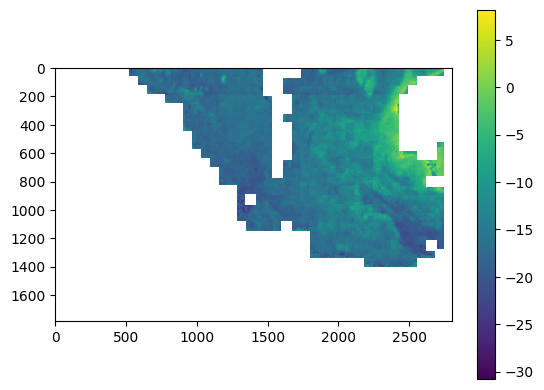

In [ ]:
# Visualize the reshaped zeroed_patches_test array
plt.imshow(reconstructed_test_area[:,:,12])
plt.colorbar()
plt.show()

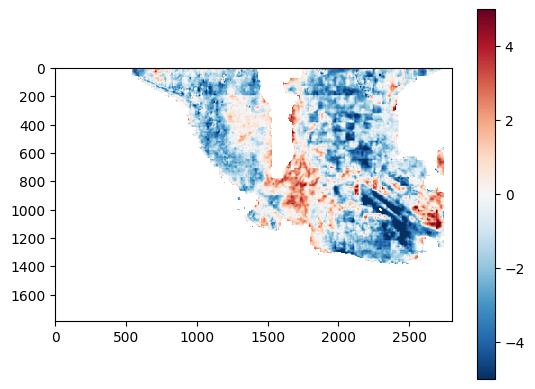

In [ ]:
error = reconstructed_test_area[:,:,12] - image2[2000:,:2800,12]
# Visualize the reshaped zeroed_patches_test array
import matplotlib.colors as mcolors
norm = mcolors.TwoSlopeNorm(vmin=-5, vmax = 5, vcenter=0)
pc = plt.imshow(error, norm=norm, cmap="RdBu_r")
plt.colorbar(pc)

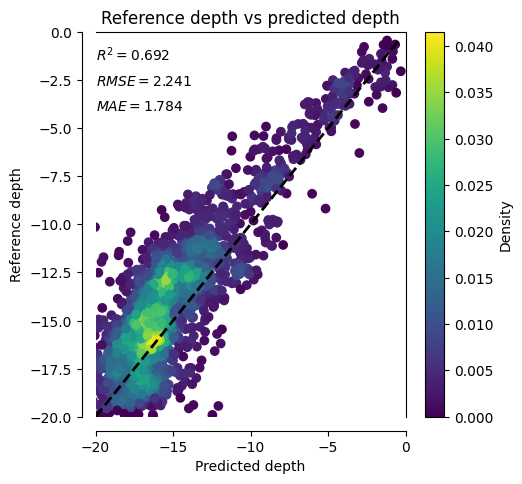

In [ ]:
df3_sample = df3.sample(n = 2000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-20,0])
    ax.set_ylim([-20,0])
    ax.set_xlabel("Predicted depth")
    ax.set_ylabel("Reference depth")
    ax.annotate("$R^2={:.3f}$".format(r2), (-20, -1.5))
    ax.annotate("$RMSE={:.3f}$".format(rmse), (-20, -2.8))
    ax.annotate("$MAE={:.3f}$".format(mae), (-20, -4.1))

    ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
    plt.title("Reference depth vs predicted depth")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('linear_regression.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Predicted'], df3_sample['Reference'], bins = [30,30])

### Image 4

In [ ]:
### IMAGE 4
image_no_4 = np.copy(image2)
image_no_4[2000:,2800:,:] = np.nan
image_4 = image2[2000:,2800:,:]

In [ ]:
# Define the patch size
patch_size = (64, 64, 13)

# Extract the patches for train area
patches_train = extract_patches(image_no_4, patch_size)
print('Number of patches:', patches_train.shape[0])
print('Patch shape:', patches_train.shape[1:])
# Remove patches with more than 70% NaN values
kept_patches_train, removed_indices = remove_patches_with_too_many_NaN(patches_train, threshold=0.7)
print(kept_patches_train.shape)
# Set the NaN values in the kept patches to 0
zeroed_patches_train = set_NaN_to_zero(kept_patches_train)
print(zeroed_patches_train.shape)

Number of patches: 4956
Patch shape: (64, 64, 13)
(1101, 64, 64, 13)
(1101, 64, 64, 13)


In [ ]:
# Extract the patches for test area
patches_test = extract_patches(image_4, patch_size)
print('Number of patches:', patches_test.shape[0])
print('Patch shape:', patches_test.shape[1:])
# Remove patches with more than 70% NaN values
kept_patches_test, removed_indices = remove_patches_with_too_many_NaN(patches_test, threshold=0.7)
print(kept_patches_test.shape)
# Set the NaN values in the kept patches to 0
zeroed_patches_test = set_NaN_to_zero(kept_patches_test)
print(zeroed_patches_test.shape)

Number of patches: 1080
Patch shape: (64, 64, 13)
(426, 64, 64, 13)
(426, 64, 64, 13)


In [ ]:
  # Get the shape of the original test area image
  test_area_shape = image_4.shape

  # Create a new array with the same shape as the test area image, filled with NaN values
  reconstructed_test_area = np.full(test_area_shape, np.nan)

  # Calculate the number of patches in each dimension
  n_rows = (test_area_shape[0] - patch_size[0]) // patch_size[0] + 1
  n_cols = (test_area_shape[1] - patch_size[1]) // patch_size[1] + 1

  # Create a mask with True values for the removed patches
  removed_mask = np.zeros((n_rows, n_cols), dtype=bool)
  removed_mask[np.unravel_index(removed_indices, (n_rows, n_cols))] = True

  # Loop over the patches and fill in the corresponding elements in the reconstructed test area
  patch_index = 0
  for i in range(0, test_area_shape[0] - patch_size[0] + 1, patch_size[0]):
      for j in range(0, test_area_shape[1] - patch_size[1] + 1, patch_size[1]):
          if not removed_mask[i // patch_size[0], j // patch_size[1]]:
              # If the patch was not removed, use the corresponding patch from zeroed_patches_test
              patch = zeroed_patches_test[patch_index, :, :, :]
              reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = patch
              patch_index += 1
          else:
              # If the patch was removed, fill in the corresponding region with NaNs
              reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = np.nan

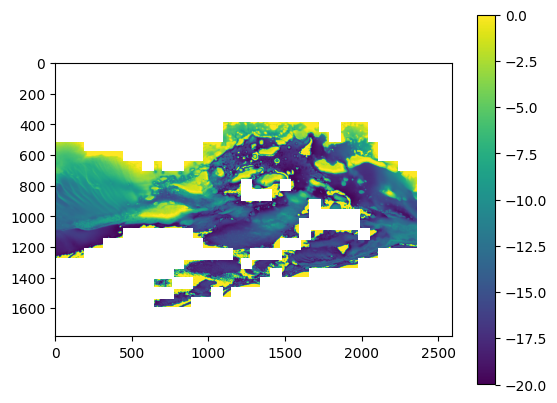

In [ ]:
# Visualize the reshaped zeroed_patches_test array
plt.imshow(reconstructed_test_area[:,:,12])
plt.colorbar()
plt.show()

In [ ]:
# Split the zeroed_patches array into inputs and targets
X_train = zeroed_patches_train[:, :, :, :-1]
y_train = zeroed_patches_train[:, :, :, -1]
y_train = tf.reshape(y_train, (-1, patch_size[0], patch_size[1], 1))

X_test = zeroed_patches_test[:, :, :, :-1]
y_test = zeroed_patches_test[:, :, :, -1]
y_test = tf.reshape(y_test, (-1, patch_size[0], patch_size[1], 1))

# # Calculate the number of samples in the validation set
val_samples = int(X_train.shape[0] * 0.25)

# # Split the training data into training and validation sets
X_val = X_train[-val_samples:, :, :, :]
y_val = y_train[-val_samples:, :, :, :]
X_train = X_train[:-val_samples, :, :, :]
y_train = y_train[:-val_samples, :, :, :]

In [ ]:
######## UNET ###########
from tensorflow.keras import layers
model_dir = '/content/drive/My Drive/Models/'

def get_model(img_size):
    inputs = keras.Input(shape=img_size)

    ### [First half of the network: downsampling inputs] ###

    # Entry block
    x = layers.Conv2D(32, 3, strides=2, padding="same")(inputs)
    x = layers.Activation("relu")(x)

    previous_block_activation = x  # Set aside residual

    # Blocks 1, 2, 3 are identical apart from the feature depth.
    for filters in [64, 128, 256]:
        x = layers.Activation("relu")(x)
        x = layers.SeparableConv2D(filters, 3, padding="same")(x)

        x = layers.Activation("relu")(x)
        x = layers.SeparableConv2D(filters, 3, padding="same")(x)

        x = layers.MaxPooling2D(3, strides=2, padding="same")(x)

        # Project residual
        residual = layers.Conv2D(filters, 1, strides=2, padding="same")(
            previous_block_activation
        )
        x = layers.add([x, residual])  # Add back residual
        previous_block_activation = x  # Set aside next residual

    ### [Second half of the network: upsampling inputs] ###

    for filters in [256, 128, 64, 32]:
        x = layers.Activation("relu")(x)
        x = layers.Conv2DTranspose(filters, 3, padding="same")(x)

        x = layers.Activation("relu")(x)
        x = layers.Conv2DTranspose(filters, 3, padding="same")(x)

        x = layers.UpSampling2D(2)(x)

        # Project residual
        residual = layers.UpSampling2D(2)(previous_block_activation)
        residual = layers.Conv2D(filters, 1, padding="same")(residual)
        x = layers.add([x, residual])  # Add back residual
        previous_block_activation = x  # Set aside next residual

    # Add a per-pixel regression layer
    outputs = layers.Conv2D(1, 1, activation="linear", padding="same")(x)

    # Define the model
    model = keras.Model(inputs, outputs)
    return model

# Free up RAM in case the model definition cells were run multiple times
keras.backend.clear_session()

# Build model
model = get_model((64, 64, 12))
model.compile(optimizer=tf.keras.optimizers.Adam(lr=0.001), loss=masked_rmse)
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 64, 64, 12)  0           []                               
                                ]                                                                 
                                                                                                  
 conv2d (Conv2D)                (None, 32, 32, 32)   3488        ['input_1[0][0]']                
                                                                                                  
 activation (Activation)        (None, 32, 32, 32)   0           ['conv2d[0][0]']                 
                                                                                                  
 activation_1 (Activation)      (None, 32, 32, 32)   0           ['activation[0][0]']         

In [ ]:
import random
# Set random seed for NumPy
np.random.seed(1)
# Set random seed for Python's built-in random module
random.seed(1)
# Set random seed for TensorFlow
tf.random.set_seed(1)

keras.backend.clear_session()

model.compile(optimizer=keras.optimizers.Adam(lr=0.001), loss=masked_rmse)

# Train the model on the training data
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_val, y_val))

# Evaluate the model on the testing data
predictions = model.predict(X_test)
print(predictions.shape)

Epoch 1/100
26/26 [==============================] - 11s 113ms/step - loss: 287.9734 - val_loss: 7.1502
Epoch 2/100
26/26 [==============================] - 1s 27ms/step - loss: 7.1172 - val_loss: 4.8428
Epoch 3/100
26/26 [==============================] - 1s 27ms/step - loss: 4.1869 - val_loss: 4.2248
Epoch 4/100
26/26 [==============================] - 1s 27ms/step - loss: 3.6201 - val_loss: 3.9761
Epoch 5/100
26/26 [==============================] - 1s 27ms/step - loss: 3.8199 - val_loss: 3.6932
Epoch 6/100
26/26 [==============================] - 1s 27ms/step - loss: 3.2936 - val_loss: 3.2852
Epoch 7/100
26/26 [==============================] - 1s 27ms/step - loss: 3.6020 - val_loss: 3.3698
Epoch 8/100
26/26 [==============================] - 1s 27ms/step - loss: 3.2684 - val_loss: 3.8649
Epoch 9/100
26/26 [==============================] - 1s 28ms/step - loss: 2.9485 - val_loss: 3.0105
Epoch 10/100
26/26 [==============================] - 1s 27ms/step - loss: 2.8026 - val_loss: 2.

In [ ]:
predictions = np.array(predictions)
y_test = np.array(y_test)
print(predictions.shape)

# Calculate the RMSE
rmse = np.sqrt(np.nanmean((predictions - y_test) ** 2))
print('RMSE:', rmse)

y_test_flat = y_test.flatten()
predictions_flat = predictions.flatten()
df_pred = pd.DataFrame(predictions_flat)
df_test = pd.DataFrame(y_test_flat)
df = pd.concat([df_test, df_pred], axis =1)
df2 = df.dropna() # Remove NaN values
df2.columns = ['Reference','Predicted']
df2= df2[df2['Reference'] < 0] # set max ref depth
df2= df2[df2['Predicted'] > -50] # set max ref depth
df2= df2[df2['Predicted'] < 0] # set max ref depth

#df2= df2[df2['Reference'] > -10] # set max ref depth
#df2 = df2.dropna() # Remove NaN values
df3 = df2.reset_index(drop=True)
df3['Error'] = df3['Predicted'] - df3['Reference']
df3
# Metrics
rmse = mean_squared_error(df3.Reference, df3.Predicted, squared=False)
r2 = metrics.r2_score(df3.Reference, df3.Predicted)
mae = np.mean(abs(df3.Reference - df3.Predicted))
print('MAE:',mae)
print('RMSE', rmse)
print('R2:',r2)

(426, 64, 64, 1)
RMSE: 6.34125190442897
MAE: 2.363354227102379
RMSE 3.4645198332348426
R2: 0.6115888159140188


In [ ]:
####### RESHAPE PREDICTIONS

# Get the shape of the original test area image
test_area_shape = image_4.shape

# Create a new array with the same shape as the test area image, filled with NaN values
reconstructed_test_area = np.full(test_area_shape, np.nan)

# Calculate the number of patches in each dimension
n_rows = (test_area_shape[0] - patch_size[0]) // patch_size[0] + 1
n_cols = (test_area_shape[1] - patch_size[1]) // patch_size[1] + 1

# Create a mask with True values for the removed patches
removed_mask = np.zeros((n_rows, n_cols), dtype=bool)
removed_mask[np.unravel_index(removed_indices, (n_rows, n_cols))] = True

# Loop over the patches and fill in the corresponding elements in the reconstructed test area
patch_index = 0
for i in range(0, test_area_shape[0] - patch_size[0] + 1, patch_size[0]):
    for j in range(0, test_area_shape[1] - patch_size[1] + 1, patch_size[1]):
        if not removed_mask[i // patch_size[0], j // patch_size[1]]:
            # If the patch was not removed, use the corresponding patch from zeroed_patches_test
            patch = predictions[patch_index, :, :, :]
            reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = patch
            patch_index += 1
        else:
            # If the patch was removed, fill in the corresponding region with NaNs
            reconstructed_test_area[i:i + patch_size[0], j:j + patch_size[1], :] = np.nan

pred_image_4 = reconstructed_test_area

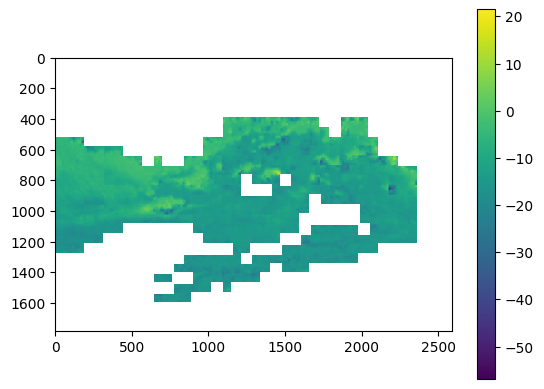

In [ ]:
# Visualize the reshaped zeroed_patches_test array
plt.imshow(reconstructed_test_area[:,:,12])
plt.colorbar()
plt.show()

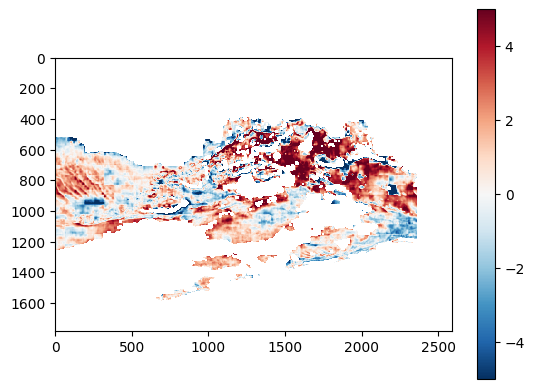

In [ ]:
error = reconstructed_test_area[:,:,12] - image2[2000:,2800:,12]

# Visualize the reshaped zeroed_patches_test array
import matplotlib.colors as mcolors
norm = mcolors.TwoSlopeNorm(vmin=-5, vmax = 5, vcenter=0)
pc = plt.imshow(error, norm=norm, cmap="RdBu_r")
plt.colorbar(pc)

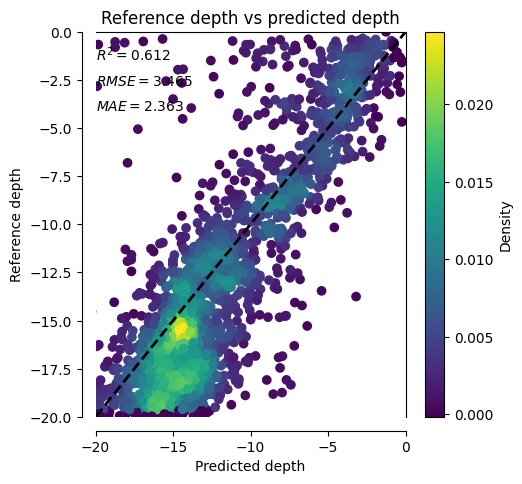

In [ ]:
df3_sample = df3.sample(n = 2000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-20,0])
    ax.set_ylim([-20,0])
    ax.set_xlabel("Predicted depth")
    ax.set_ylabel("Reference depth")
    ax.annotate("$R^2={:.3f}$".format(r2), (-20, -1.5))
    ax.annotate("$RMSE={:.3f}$".format(rmse), (-20, -2.8))
    ax.annotate("$MAE={:.3f}$".format(mae), (-20, -4.1))

    ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
    plt.title("Reference depth vs predicted depth")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('linear_regression.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Predicted'], df3_sample['Reference'], bins = [30,30])

### Reshape predictions

In [ ]:
print(pred_image_1.shape)
print(pred_image_2.shape)
print(pred_image_3.shape)
print(pred_image_4.shape)

(965, 5389, 13)
(965, 5389, 13)
(1783, 2800, 13)
(1783, 2589, 13)


In [ ]:
print(image_1.shape)
print(image_2.shape)
print(image_3.shape)
print(image_4.shape)

(965, 5389, 13)
(965, 5389, 13)
(1783, 2800, 13)
(1783, 2589, 13)


(3860, 5389)


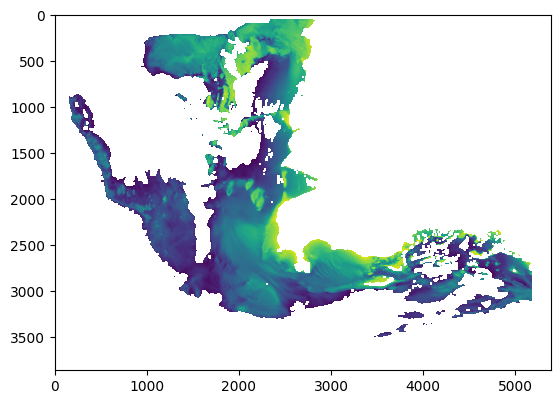

In [ ]:
ref_image_1 = image_1[:,:,-1]
ref_image_2 = image_2[:,:,-1]
ref_image_3 = image_3[:,:,-1]
ref_image_4 = image_4[:,:,-1]

ref_1_2 = np.concatenate((ref_image_1, ref_image_2), axis = 0)

ref_image_4_pad = np.pad(ref_image_4, [(0,0), (0,211)], 'constant', constant_values=(np.nan,))
ref_3_4 = np.concatenate((ref_image_3, ref_image_4_pad), axis = 1)
ref_3_4 = np.pad(ref_3_4, [(0,147), (0,0)], 'constant', constant_values=(np.nan,))
ref_3_4 = ref_3_4[:,0:5389]

ref_all = np.concatenate((ref_1_2, ref_3_4), axis = 0)
print(ref_all.shape)
pc = plt.imshow(ref_all)

In [ ]:
pred_image_1 = pred_image_1[:,:,-1]
pred_image_2 = pred_image_2[:,:,-1]
pred_image_3 = pred_image_3[:,:,-1]
pred_image_4 = pred_image_4[:,:,-1]

In [ ]:
print(pred_image_1.shape)
print(pred_image_2.shape)
print(pred_image_3.shape)
print(pred_image_4.shape)

(965, 5389)
(965, 5389)
(1783, 2800)
(1783, 2589)


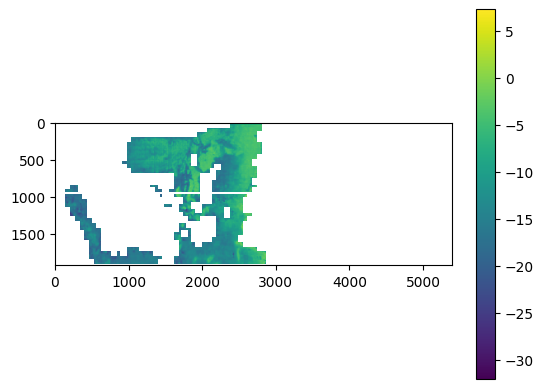

In [ ]:
y_pred_1_2 = np.concatenate((pred_image_1, pred_image_2), axis = 0)
pc = plt.imshow(y_pred_1_2)
plt.colorbar(pc)

In [ ]:
pred_image_4_pad = np.pad(pred_image_4, [(0,0), (0,211)], 'constant', constant_values=(np.nan,))

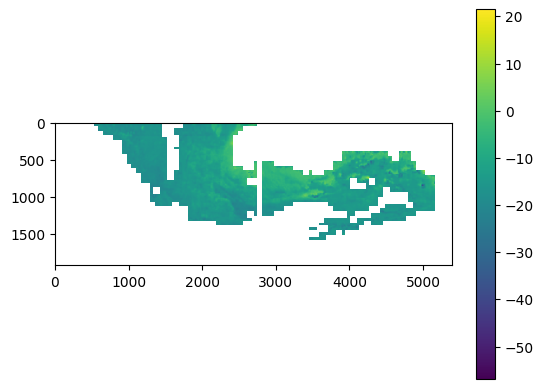

In [ ]:
y_pred_3_4 = np.concatenate((pred_image_3, pred_image_4_pad), axis = 1)
y_pred_3_4 = np.pad(y_pred_3_4, [(0,147), (0,0)], 'constant', constant_values=(np.nan,))
y_pred_3_4 = y_pred_3_4[:,0:5389]
pc = plt.imshow(y_pred_3_4)
plt.colorbar(pc)

In [ ]:
y_pred_all = np.concatenate((y_pred_1_2, y_pred_3_4), axis = 0)
y_pred_all.shape

(3860, 5389)

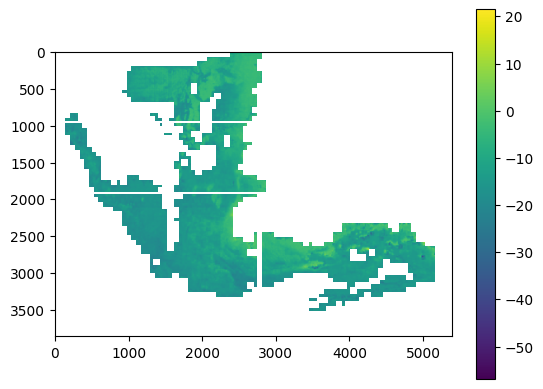

In [ ]:
pc = plt.imshow(y_pred_all)
plt.colorbar(pc)

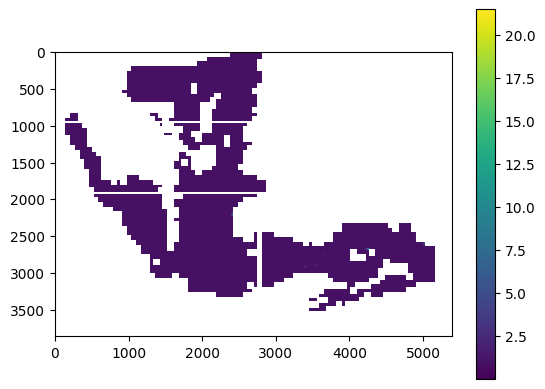

In [ ]:
y_pred_mask = y_pred_all.copy()

y_pred_mask[y_pred_mask <= 0] = 1
pc = plt.imshow(y_pred_mask)
plt.colorbar(pc)


In [ ]:
ref_all_masked = ref_all * y_pred_mask

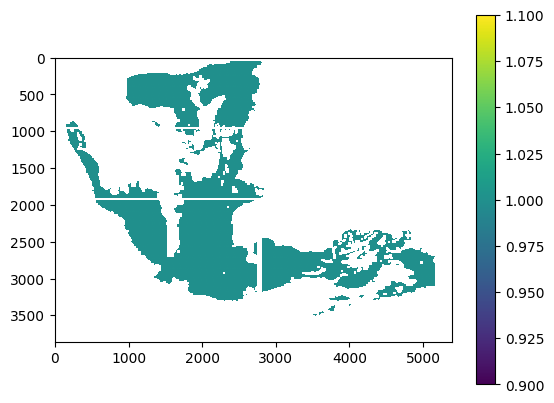

In [ ]:
ref_mask = ref_all_masked.copy()

ref_mask[ref_mask <= 0] = 1
pc = plt.imshow(ref_mask)
plt.colorbar(pc)

In [ ]:
y_pred_all_masked = y_pred_all * ref_mask

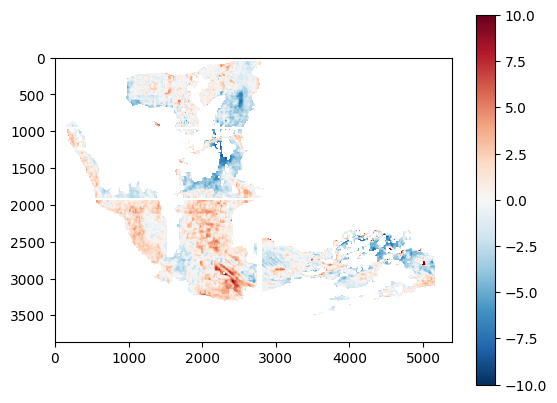

In [ ]:
error = ref_all_masked - y_pred_all_masked

# Visualize the reshaped zeroed_patches_test array
import matplotlib.colors as mcolors
norm = mcolors.TwoSlopeNorm(vmin=-10, vmax = 10, vcenter=0)
pc = plt.imshow(error, norm=norm, cmap="RdBu_r")
plt.colorbar(pc)

In [ ]:
np.save('/content/drive/My Drive/Predictions_final/8_UNet_median_predictions_20m.npy', y_pred_all_masked)

In [ ]:
np.save('/content/drive/My Drive/Predictions_final/8_UNet_median_error_20m.npy', error)

In [ ]:
np.save('/content/drive/My Drive/Predictions_final/8_UNet_median_reference_20m.npy', ref_all_masked)

In [ ]:
predictions = np.array(y_pred_all_masked)
y_test = np.array(ref_all_masked)
print(predictions.shape)

# Calculate the RMSE
rmse = np.sqrt(np.nanmean((predictions - y_test) ** 2))
print('RMSE:', rmse)

y_test_flat = y_test.flatten()
predictions_flat = predictions.flatten()
df_pred = pd.DataFrame(predictions_flat)
df_test = pd.DataFrame(y_test_flat)
df = pd.concat([df_test, df_pred], axis =1)
df2 = df.dropna() # Remove NaN values
df2.columns = ['Reference','Predicted']
df2= df2[df2['Reference'] < 0] # set max ref depth
df2= df2[df2['Predicted'] > -50] # set max ref depth
df2= df2[df2['Predicted'] < 0] # set max ref depth

#df2= df2[df2['Reference'] > -10] # set max ref depth
#df2 = df2.dropna() # Remove NaN values
df3 = df2.reset_index(drop=True)
df3['Error'] = df3['Predicted'] - df3['Reference']
df3
# Metrics
rmse = mean_squared_error(df3.Reference, df3.Predicted, squared=False)
r2 = metrics.r2_score(df3.Reference, df3.Predicted)
mae = np.mean(abs(df3.Reference - df3.Predicted))
print('MAE:',mae)
print('RMSE', rmse)
print('R2:',r2)

(3860, 5389)
RMSE: 2.7677599644493998
MAE: 2.011339697066619
RMSE 2.7448902753625295
R2: 0.6956018997565676


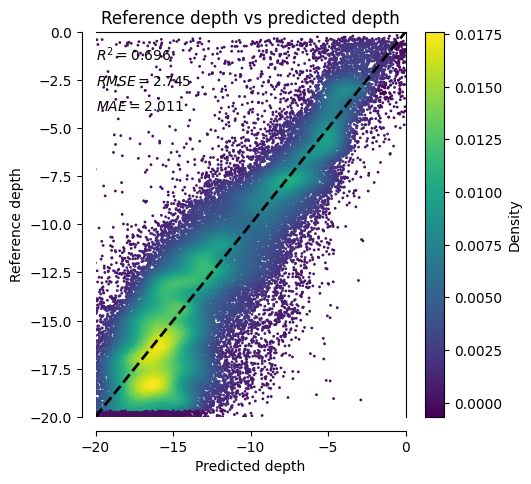

In [ ]:
df3_sample = df3.sample(n = 50000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-20,0])
    ax.set_ylim([-20,0])
    ax.set_xlabel("Predicted depth")
    ax.set_ylabel("Reference depth")
    ax.annotate("$R^2={:.3f}$".format(r2), (-20, -1.5))
    ax.annotate("$RMSE={:.3f}$".format(rmse), (-20, -2.8))
    ax.annotate("$MAE={:.3f}$".format(mae), (-20, -4.1))

    ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
    plt.title("Reference depth vs predicted depth")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('linear_regression.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Predicted'], df3_sample['Reference'], bins = [30,30], s = 1)

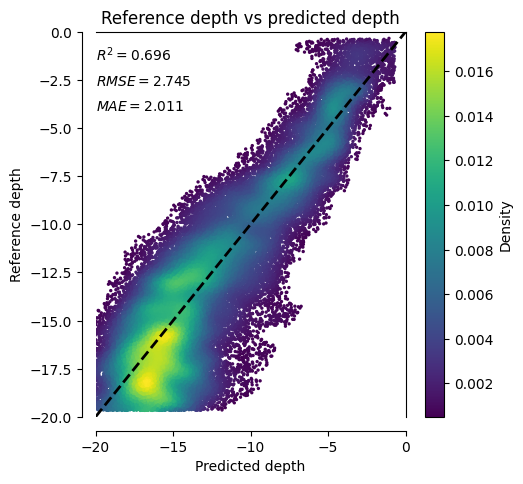

In [ ]:
df3_sample = df3.sample(n = 50000)

def density_scatter(x, y, threshold=0, ax=None, sort=True, bins=20, **kwargs):
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None:
        fig, ax = plt.subplots(figsize=(5, 5))
    data, x_e, y_e = np.histogram2d(x, y, bins=bins, density=True)
    z = interpn((0.5*(x_e[1:]+x_e[:-1]), 0.5*(y_e[1:]+y_e[:-1])), data, np.vstack([x, y]).T,
                method="splinef2d", bounds_error=False)

    # Filter pixels based on density threshold
    mask = z >= threshold
    x = x[mask]
    y = y[mask]
    z = z[mask]

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs)
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-20, 0])
    ax.set_ylim([-20, 0])
    ax.set_xlabel("Predicted depth")
    ax.set_ylabel("Reference depth")

    # Calculate regression metrics and add to plot
    ax.annotate("$R^2={:.3f}$".format(r2), (-20, -1.5))
    ax.annotate("$RMSE={:.3f}$".format(rmse), (-20, -2.8))
    ax.annotate("$MAE={:.3f}$".format(mae), (-20, -4.1))

    ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
    plt.title("Reference depth vs predicted depth")

    norm = Normalize(vmin=np.min(z), vmax=np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm=norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('linear_regression.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__:
    density_scatter(df3_sample['Predicted'], df3_sample['Reference'], threshold=0.0005, bins=[30, 30], s=2)


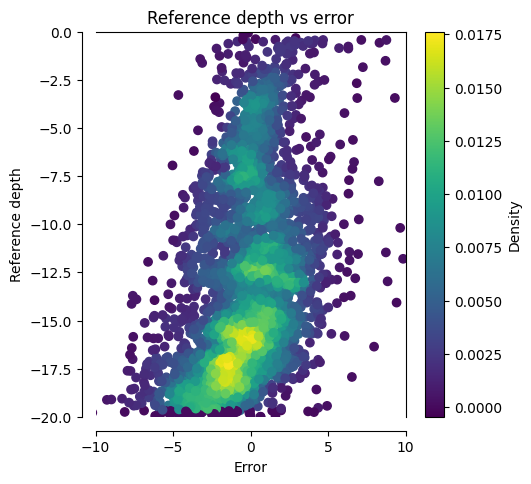

In [ ]:
# Depth vs error
#error.shape (1400,1400)
#reference.shape (1400, 1400)

error_flatten = error.flatten()
reference_flatten = ref_all_masked.flatten()

reference_df = pd.DataFrame(reference_flatten)
error_df = pd.DataFrame(error_flatten)

df = pd.concat([reference_df, error_df], axis=1) # Concatenate both dataframes
df2 = df.dropna() # Remove NaN values
df2.columns = ['Reference','Error']
df3 = df2.reset_index(drop=True)

df3_sample = df3.sample(n = 3000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-10,10])
    ax.set_ylim([-20,0])
    ax.set_xlabel("Error")
    ax.set_ylabel("Reference depth")
    ax.annotate("$R^2={:.3f}$".format(r2), (-20, -1.5))
    ax.annotate("$RMSE={:.3f}$".format(rmse), (-20, -2.8))
    ax.annotate("$MAE={:.3f}$".format(mae), (-20, -4.1))

    #ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
    plt.title("Reference depth vs error")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('linear_regression.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Error'], df3_sample['Reference'], bins = [30,30])

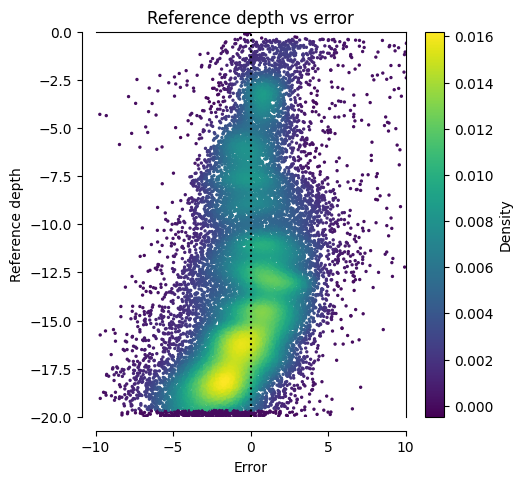

In [ ]:
df3_sample = df3.sample(n = 20000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-10,10])
    ax.set_ylim([-20,0])
    ax.set_xlabel("Error")
    ax.set_ylabel("Reference depth")
    ax.annotate("$R^2={:.3f}$".format(r2), (-20, -1.5))
    ax.annotate("$RMSE={:.3f}$".format(rmse), (-20, -2.8))
    ax.annotate("$MAE={:.3f}$".format(mae), (-20, -4.1))

    #ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
    plt.title("Reference depth vs error")
    plt.axvline(x=0, color='k', linestyle=':', label='axvline - dotted')
    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('linear_regression.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Error'], df3_sample['Reference'], bins = [30,30], s =2)

## Fully connected ANN max 20m

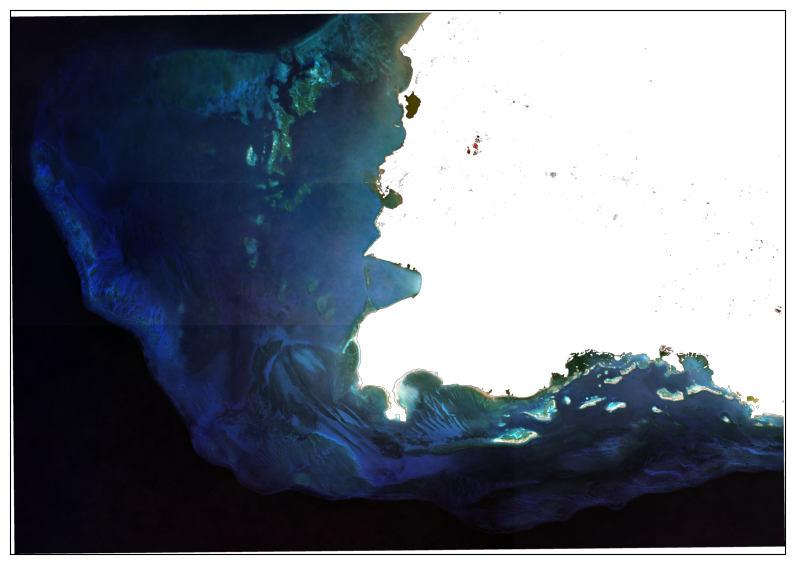

In [ ]:
## Get reference data and set all values to 1.
# Sentinel-2 image:
with rasterio.open('/content/drive/MyDrive/GEE_composites/median_reflectance_v2.tif') as src:
    image = src.read()

image = image.astype(np.float32) # from integer to float

image[image==0] = np.nan
image[image<-1000] = np.nan
image.shape

ep.plot_rgb(image,
            rgb=(3, 2, 1),
            stretch=True,
            str_clip=0.2,
            figsize=(10, 16))
plt.show()

In [ ]:
def set_nan_below_threshold(image, threshold):
    mask = image[-1,:,:] < threshold
    image[:,mask] = np.nan
    return image




In [ ]:
def remove_nan(image):
    image = image.astype(np.float32) # from integer to float
    nan_mask = np.any(np.isnan(image), axis=0)
    image[:, nan_mask] = np.nan

    return image


In [ ]:
image.shape

(13, 3783, 5389)

In [ ]:
image = remove_nan(image)

In [ ]:
image = set_nan_below_threshold(image, -20)

In [ ]:
image_t = np.transpose(image, (2, 0, 1))


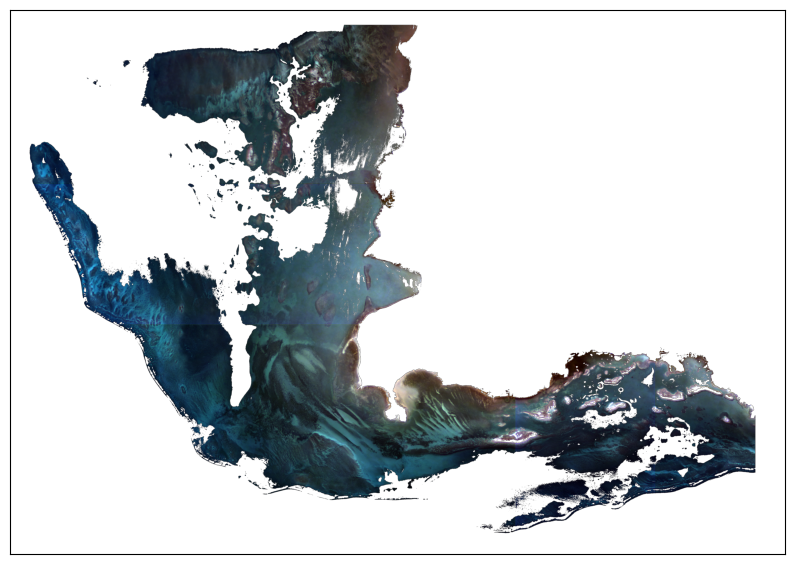

In [ ]:
ep.plot_rgb(image,
            rgb=(2, 1, 0),
            stretch=True,
            str_clip=0.2,
            figsize=(10, 16))
plt.show()

In [ ]:
image.shape

(13, 3783, 5389)

(965, 5389, 13)
(13, 965, 5389)
(1190601, 13)


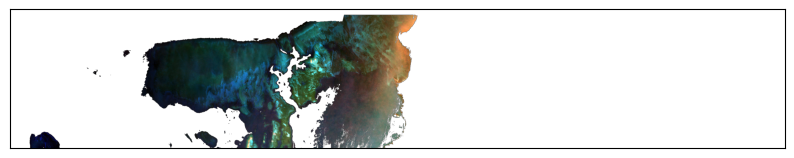

In [ ]:
image_1 = image[:,70:1035,:]
image_1_shape = np.moveaxis(image_1, 0, -1)
print(image_1_shape.shape)
image_1_no_nan = image_1_shape[~np.isnan(image_1_shape).any(axis=2)]
print(image_1.shape)
print(image_1_no_nan.shape)
ep.plot_rgb(image_1,
            rgb=(3, 2, 1),
            stretch=True,
            str_clip=0.2,
            figsize=(10, 16))
plt.show()

(13, 965, 5389)
(1032917, 13)


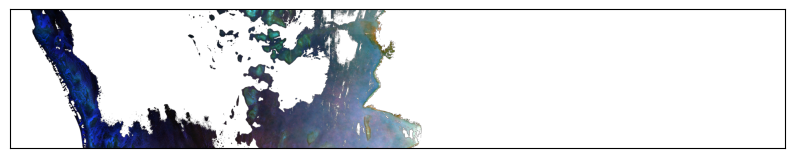

In [ ]:
image_2 = image[:,1035:2000,:]
image_2_shape = np.moveaxis(image_2, 0, -1)
image_2_no_nan = image_2_shape[~np.isnan(image_2_shape).any(axis=2)]
print(image_2.shape)
print(image_2_no_nan.shape)
ep.plot_rgb(image_2,
            rgb=(3, 2, 1),
            stretch=True,
            str_clip=0.2,
            figsize=(10, 16))
plt.show()

(13, 1783, 2800)
(1907397, 13)


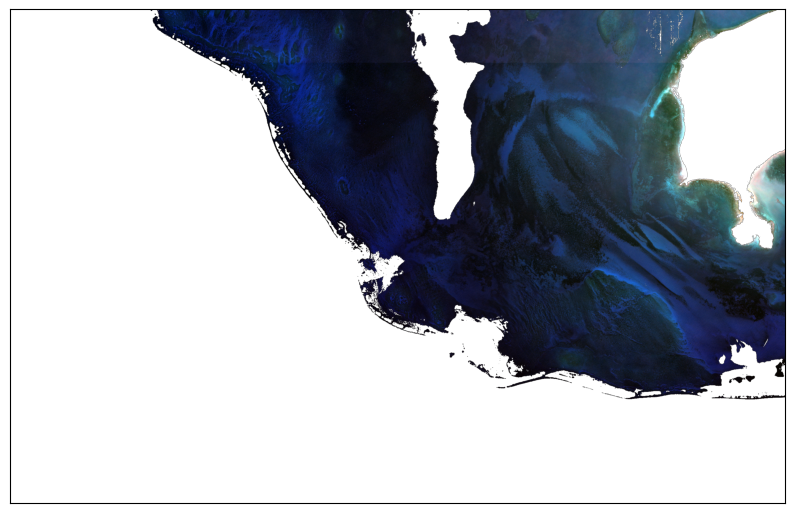

In [ ]:
image_3 = image[:,2000:,:2800]
image_3_shape = np.moveaxis(image_3, 0, -1)
image_3_no_nan = image_3_shape[~np.isnan(image_3_shape).any(axis=2)]
print(image_3.shape)
print(image_3_no_nan.shape)
ep.plot_rgb(image_3,
            rgb=(3, 2, 1),
            stretch=True,
            str_clip=0.2,
            figsize=(10, 16))
plt.show()

(13, 1783, 2589)
(1558219, 13)


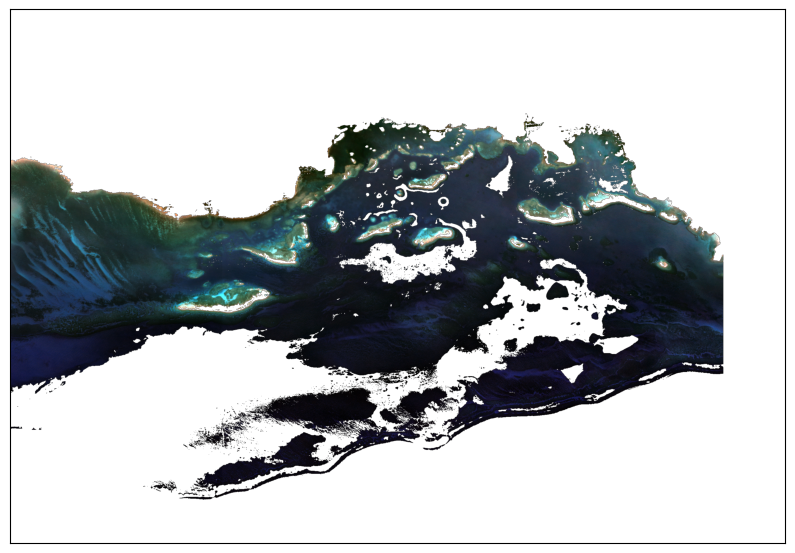

In [ ]:
image_4 = image[:,2000:,2800:]
image_4_shape = np.moveaxis(image_4, 0, -1)
image_4_no_nan = image_4_shape[~np.isnan(image_4_shape).any(axis=2)]
print(image_4.shape)
print(image_4_no_nan.shape)
ep.plot_rgb(image_4,
            rgb=(3, 2, 1),
            stretch=True,
            str_clip=0.2,
            figsize=(10, 16))
plt.show()

In [ ]:
# splits:
image_1_2_3_no_nan = np.vstack((image_1_no_nan,image_2_no_nan,image_3_no_nan))[:,0:12]
print(image_1_2_3_no_nan.shape)
image_1_2_4_no_nan = np.vstack((image_1_no_nan,image_2_no_nan,image_4_no_nan))[:,0:12]
print(image_1_2_4_no_nan.shape)
image_1_3_4_no_nan = np.vstack((image_1_no_nan,image_3_no_nan,image_4_no_nan))[:,0:12]
print(image_1_3_4_no_nan.shape)
image_2_3_4_no_nan = np.vstack((image_2_no_nan,image_3_no_nan,image_4_no_nan))[:,0:12]
print(image_2_3_4_no_nan.shape)

(4130915, 12)
(3781737, 12)
(4656217, 12)
(4498533, 12)


In [ ]:
# train splits X:
X_train_1_2_3 = np.vstack((image_1_no_nan,image_2_no_nan,image_3_no_nan))[:,0:12]
print(X_train_1_2_3.shape)
X_train_1_2_4 = np.vstack((image_1_no_nan,image_2_no_nan,image_4_no_nan))[:,0:12]
print(X_train_1_2_4.shape)
X_train_1_3_4 = np.vstack((image_1_no_nan,image_3_no_nan,image_4_no_nan))[:,0:12]
print(X_train_1_3_4.shape)
X_train_2_3_4 = np.vstack((image_2_no_nan,image_3_no_nan,image_4_no_nan))[:,0:12]
print(X_train_2_3_4.shape)

# train splits y:
y_train_1_2_3 = np.vstack((image_1_no_nan,image_2_no_nan,image_3_no_nan))[:,-1]
print(y_train_1_2_3.shape)
y_train_1_2_4 = np.vstack((image_1_no_nan,image_2_no_nan,image_4_no_nan))[:,-1]
print(y_train_1_2_4.shape)
y_train_1_3_4 = np.vstack((image_1_no_nan,image_3_no_nan,image_4_no_nan))[:,-1]
print(y_train_1_3_4.shape)
y_train_2_3_4 = np.vstack((image_2_no_nan,image_3_no_nan,image_4_no_nan))[:,-1]
print(y_train_2_3_4.shape)

(4130915, 12)
(3781737, 12)
(4656217, 12)
(4498533, 12)
(4130915,)
(3781737,)
(4656217,)
(4498533,)


In [ ]:
# Test splits X:
X_test_1 = image_1_no_nan[:,0:12]
print(X_test_1.shape)
X_test_2 = image_2_no_nan[:,0:12]
print(X_test_2.shape)
X_test_3 = image_3_no_nan[:,0:12]
print(X_test_3.shape)
X_test_4 = image_4_no_nan[:,0:12]
print(X_test_4.shape)

# Test splits y:
y_test_1 = image_1_no_nan[:,-1]
print(y_test_1.shape)
y_test_2 = image_2_no_nan[:,-1]
print(y_test_2.shape)
y_test_3 = image_3_no_nan[:,-1]
print(y_test_3.shape)
y_test_4 = image_4_no_nan[:,-1]
print(y_test_4.shape)

(1190601, 12)
(1032917, 12)
(1907397, 12)
(1558219, 12)
(1190601,)
(1032917,)
(1907397,)
(1558219,)


In [ ]:
# Make run determistic
tf.keras.backend.clear_session()
tf.random.set_seed(1234)
os.environ['TF_DETERMINISTIC_OPS'] = '1'

# Configure model architecture
input = tf.keras.layers.Input((12,))

x = tf.keras.layers.Dense(128, activation=tf.nn.leaky_relu)(input)
x = tf.keras.layers.Dense(64, activation=tf.nn.leaky_relu)(x)
x = tf.keras.layers.Dense(64, activation=tf.nn.leaky_relu)(x)
x = tf.keras.layers.Dense(64, activation=tf.nn.leaky_relu)(x)
# x = tf.keras.layers.Dense(50, activation=tf.nn.leaky_relu)(x)
# x = tf.keras.layers.Dropout(0.1)(x)

output = tf.keras.layers.Dense(1)(x)
model = tf.keras.Model(inputs=input, outputs=output)
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
model.compile(loss='mse', optimizer=optimizer, metrics=['mse'])
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 12)]              0         
                                                                 
 dense (Dense)               (None, 128)               1664      
                                                                 
 dense_1 (Dense)             (None, 64)                8256      
                                                                 
 dense_2 (Dense)             (None, 64)                4160      
                                                                 
 dense_3 (Dense)             (None, 64)                4160      
                                                                 
 dense_4 (Dense)             (None, 1)                 65        
                                                                 
Total params: 18,305
Trainable params: 18,305
Non-trainable p

In [ ]:
# Train: 1,2,3. Test: 4
history = model.fit(X_train_1_2_3, y_train_1_2_3, batch_size=1028,epochs=100, verbose=2, validation_split=0.1)
y_pred_4 = model.predict(X_test_4)
tf.keras.backend.clear_session()

Epoch 1/100
3617/3617 - 12s - loss: 2.4557 - mse: 2.4557 - val_loss: 2.9634 - val_mse: 2.9634 - 12s/epoch - 3ms/step
Epoch 2/100
3617/3617 - 12s - loss: 2.2338 - mse: 2.2338 - val_loss: 2.9817 - val_mse: 2.9817 - 12s/epoch - 3ms/step
Epoch 3/100
3617/3617 - 12s - loss: 2.1015 - mse: 2.1015 - val_loss: 3.3514 - val_mse: 3.3514 - 12s/epoch - 3ms/step
Epoch 4/100
3617/3617 - 12s - loss: 2.0310 - mse: 2.0310 - val_loss: 3.1179 - val_mse: 3.1179 - 12s/epoch - 3ms/step
Epoch 5/100
3617/3617 - 11s - loss: 1.9841 - mse: 1.9841 - val_loss: 3.1909 - val_mse: 3.1909 - 11s/epoch - 3ms/step
Epoch 6/100
3617/3617 - 11s - loss: 1.9419 - mse: 1.9419 - val_loss: 3.1930 - val_mse: 3.1930 - 11s/epoch - 3ms/step
Epoch 7/100
3617/3617 - 11s - loss: 1.9121 - mse: 1.9121 - val_loss: 2.6006 - val_mse: 2.6006 - 11s/epoch - 3ms/step
Epoch 8/100
3617/3617 - 11s - loss: 1.8844 - mse: 1.8844 - val_loss: 3.1267 - val_mse: 3.1267 - 11s/epoch - 3ms/step
Epoch 9/100
3617/3617 - 11s - loss: 1.8625 - mse: 1.8625 - val_l

In [ ]:
# Train: 1,2,4. Test: 3
history = model.fit(X_train_1_2_4, y_train_1_2_4, batch_size=1028,epochs=100, verbose=2, validation_split=0.1)
y_pred_3 = model.predict(X_test_3)
tf.keras.backend.clear_session()

Epoch 1/100
3311/3311 - 10s - loss: 2.2479 - mse: 2.2479 - val_loss: 3.4330 - val_mse: 3.4330 - 10s/epoch - 3ms/step
Epoch 2/100
3311/3311 - 10s - loss: 2.1712 - mse: 2.1712 - val_loss: 3.0512 - val_mse: 3.0512 - 10s/epoch - 3ms/step
Epoch 3/100
3311/3311 - 10s - loss: 2.1541 - mse: 2.1541 - val_loss: 4.6195 - val_mse: 4.6195 - 10s/epoch - 3ms/step
Epoch 4/100
3311/3311 - 10s - loss: 2.1401 - mse: 2.1401 - val_loss: 2.5970 - val_mse: 2.5970 - 10s/epoch - 3ms/step
Epoch 5/100
3311/3311 - 10s - loss: 2.1315 - mse: 2.1315 - val_loss: 3.1702 - val_mse: 3.1702 - 10s/epoch - 3ms/step
Epoch 6/100
3311/3311 - 10s - loss: 2.1293 - mse: 2.1293 - val_loss: 2.8472 - val_mse: 2.8472 - 10s/epoch - 3ms/step
Epoch 7/100
3311/3311 - 10s - loss: 2.1188 - mse: 2.1188 - val_loss: 2.8562 - val_mse: 2.8562 - 10s/epoch - 3ms/step
Epoch 8/100
3311/3311 - 10s - loss: 2.1171 - mse: 2.1171 - val_loss: 2.8229 - val_mse: 2.8229 - 10s/epoch - 3ms/step
Epoch 9/100
3311/3311 - 10s - loss: 2.1135 - mse: 2.1135 - val_l

In [ ]:
# Train: 1,3,4. Test: 2
history = model.fit(X_train_1_3_4, y_train_1_3_4, batch_size=1028,epochs=100, verbose=2, validation_split=0.1)
y_pred_2 = model.predict(X_test_2)
tf.keras.backend.clear_session()

Epoch 1/100
4077/4077 - 12s - loss: 1.6199 - mse: 1.6199 - val_loss: 2.7322 - val_mse: 2.7322 - 12s/epoch - 3ms/step
Epoch 2/100
4077/4077 - 12s - loss: 1.5888 - mse: 1.5888 - val_loss: 3.1503 - val_mse: 3.1503 - 12s/epoch - 3ms/step
Epoch 3/100
4077/4077 - 12s - loss: 1.5761 - mse: 1.5761 - val_loss: 3.0196 - val_mse: 3.0196 - 12s/epoch - 3ms/step
Epoch 4/100
4077/4077 - 12s - loss: 1.5703 - mse: 1.5703 - val_loss: 2.9988 - val_mse: 2.9988 - 12s/epoch - 3ms/step
Epoch 5/100
4077/4077 - 12s - loss: 1.5654 - mse: 1.5654 - val_loss: 3.4514 - val_mse: 3.4514 - 12s/epoch - 3ms/step
Epoch 6/100
4077/4077 - 12s - loss: 1.5608 - mse: 1.5608 - val_loss: 2.9523 - val_mse: 2.9523 - 12s/epoch - 3ms/step
Epoch 7/100
4077/4077 - 12s - loss: 1.5570 - mse: 1.5570 - val_loss: 3.3572 - val_mse: 3.3572 - 12s/epoch - 3ms/step
Epoch 8/100
4077/4077 - 12s - loss: 1.5547 - mse: 1.5547 - val_loss: 3.2911 - val_mse: 3.2911 - 12s/epoch - 3ms/step
Epoch 9/100
4077/4077 - 12s - loss: 1.5504 - mse: 1.5504 - val_l

In [ ]:
# Train: 2,3,4. Test: 1
history = model.fit(X_train_2_3_4, y_train_2_3_4, batch_size=1028,epochs=100, verbose=2, validation_split=0.1)
y_pred_1 = model.predict(X_test_1)
tf.keras.backend.clear_session()

Epoch 1/100
3939/3939 - 11s - loss: 2.0697 - mse: 2.0697 - val_loss: 2.9626 - val_mse: 2.9626 - 11s/epoch - 3ms/step
Epoch 2/100
3939/3939 - 11s - loss: 2.0099 - mse: 2.0099 - val_loss: 3.3684 - val_mse: 3.3684 - 11s/epoch - 3ms/step
Epoch 3/100
3939/3939 - 11s - loss: 1.9946 - mse: 1.9946 - val_loss: 3.1415 - val_mse: 3.1415 - 11s/epoch - 3ms/step
Epoch 4/100
3939/3939 - 11s - loss: 1.9862 - mse: 1.9862 - val_loss: 2.7513 - val_mse: 2.7513 - 11s/epoch - 3ms/step
Epoch 5/100
3939/3939 - 12s - loss: 1.9789 - mse: 1.9789 - val_loss: 2.8953 - val_mse: 2.8953 - 12s/epoch - 3ms/step
Epoch 6/100
3939/3939 - 11s - loss: 1.9743 - mse: 1.9743 - val_loss: 3.3634 - val_mse: 3.3634 - 11s/epoch - 3ms/step
Epoch 7/100
3939/3939 - 11s - loss: 1.9696 - mse: 1.9696 - val_loss: 3.1819 - val_mse: 3.1819 - 11s/epoch - 3ms/step
Epoch 8/100
3939/3939 - 11s - loss: 1.9668 - mse: 1.9668 - val_loss: 2.9185 - val_mse: 2.9185 - 11s/epoch - 3ms/step
Epoch 9/100
3939/3939 - 11s - loss: 1.9630 - mse: 1.9630 - val_l

In [ ]:
print(y_pred_1.shape, 'y_pred_1')
print(y_test_1.shape, 'y_test_1')
print(y_pred_2.shape, 'y_pred_2')
print(y_test_2.shape, 'y_test_2')
print(y_pred_3.shape, 'y_pred_3')
print(y_test_3.shape, 'y_test_3')
print(y_pred_4.shape, 'y_pred_4')
print(y_test_4.shape, 'y_test_4')

(1190601, 1) y_pred_1
(1190601,) y_test_1
(1032917, 1) y_pred_2
(1032917,) y_test_2
(1907397, 1) y_pred_3
(1907397,) y_test_3
(1558219, 1) y_pred_4
(1558219,) y_test_4


In [ ]:
def calculate_metrics_area(y_pred, y_test):
    """
    This function takes in two inputs, y_pred_1_2_3 and a, and outputs the rmse, r2 and mae.
    """
    y = y_pred[~np.isnan(y_pred)]
    df_y_pred = pd.DataFrame(y)
    y_test = y_test.flatten()
    y_test = y_test[~np.isnan(y_test)]
    df_y_test = pd.DataFrame(y_test)
    # concatenate the two dataframes and remove NaN values
    df = pd.concat([df_y_test, df_y_pred], axis=1)
    df = df.dropna()
    df.columns = ['Reference','Predicted']
    df = df.reset_index(drop=True)
    df['Error'] = df['Predicted'] - df['Reference']
    # calculate metrics
    rmse = mean_squared_error(df.Reference, df.Predicted, squared=False)
    r2 = r2_score(df.Reference, df.Predicted)
    mae = np.mean(abs(df.Reference - df.Predicted))
    return rmse, r2, mae

In [ ]:
rmse,r2,mae = calculate_metrics_area(y_pred_1, y_test_1)
metrics_1 = list((rmse, r2, mae))
print(metrics_1,'area 1')

rmse,r2,mae = calculate_metrics_area(y_pred_2, y_test_2)
metrics_2 = list((rmse, r2, mae))
print(metrics_2, 'area 2')

rmse,r2,mae = calculate_metrics_area(y_pred_3, y_test_3)
metrics_3 = list((rmse, r2, mae))
print(metrics_3, 'area 3')

rmse,r2,mae = calculate_metrics_area(y_pred_4, y_test_4)
metrics_4 = list((rmse, r2, mae))
print(metrics_4, 'area 4')

[2.295674, 0.7697651083465828, 1.6538273] area 1
[2.781506, 0.6759056241495742, 1.9936767] area 2
[1.787436, 0.8177429698161226, 1.3894324] area 3
[2.407719, 0.8159603156959055, 1.752403] area 4


In [ ]:
y_pred_test_1 = y_pred_1[:,0]
y_pred_test_2 = y_pred_2[:,0]
y_pred_test_3 = y_pred_3[:,0]
y_pred_test_4 = y_pred_4[:,0]


In [ ]:
y_pred_1_reshape = reshape_y_pred(image_1,y_pred_test_1)
print(y_pred_1_reshape.shape, 'y_pred_1')
y_pred_2_reshape = reshape_y_pred(image_2,y_pred_test_2)
print(y_pred_2_reshape.shape, 'y_pred_2')
y_pred_3_reshape = reshape_y_pred(image_3,y_pred_test_3)
print(y_pred_3_reshape.shape, 'y_pred_3')
y_pred_4_reshape = reshape_y_pred(image_4,y_pred_test_4)
print(y_pred_4_reshape.shape, 'y_pred_4')


(965, 5389) y_pred_1
(965, 5389) y_pred_2
(1783, 2800) y_pred_3
(1783, 2589) y_pred_4


In [ ]:
y_pred_1.shape

(1190601, 1)

In [ ]:
y_test_1_reshape = reshape_y_pred(image_1,y_test_1)
print(y_test_1_reshape.shape, 'y_pred_1')
y_test_2_reshape = reshape_y_pred(image_2,y_test_2)
print(y_test_2_reshape.shape, 'y_pred_2')
y_test_3_reshape = reshape_y_pred(image_3,y_test_3)
print(y_test_3_reshape.shape, 'y_pred_3')
y_test_4_reshape = reshape_y_pred(image_4,y_test_4)
print(y_test_4_reshape.shape, 'y_pred_4')


(965, 5389) y_pred_1
(965, 5389) y_pred_2
(1783, 2800) y_pred_3
(1783, 2589) y_pred_4


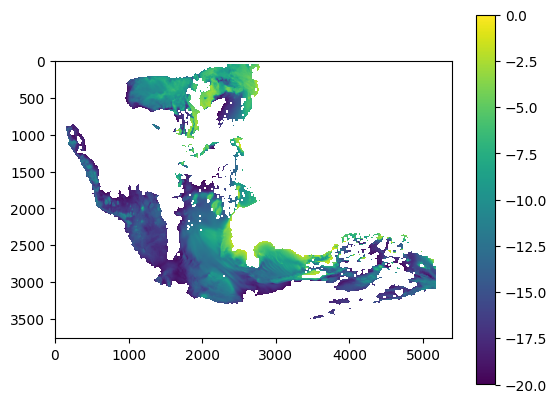

In [ ]:
y_test_3_4 = np.concatenate((y_test_3_reshape,y_test_4_reshape),axis=1)
y_test_1_2 = np.concatenate((y_test_1_reshape,y_test_2_reshape),axis=0)
y_test_3_4 = np.pad(y_test_3_4, [(0,49), (0,0)], 'constant', constant_values=(np.nan,))
y_test_1_2_3_4 = np.concatenate((y_test_1_2, y_test_3_4), axis = 0)
pc = plt.imshow(y_test_1_2_3_4)
plt.colorbar(pc)

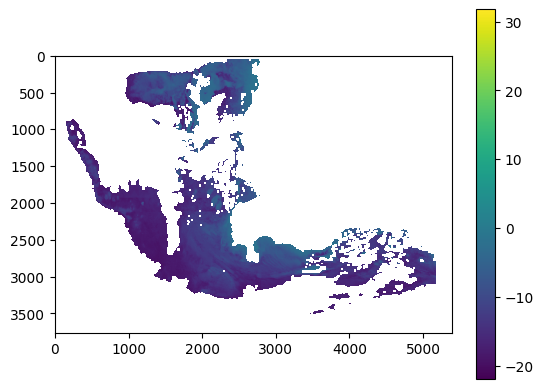

In [ ]:
y_pred_3_4 = np.concatenate((y_pred_3_reshape,y_pred_4_reshape),axis=1)
y_pred_1_2 = np.concatenate((y_pred_1_reshape,y_pred_2_reshape),axis=0)
y_pred_3_4 = np.pad(y_pred_3_4, [(0,49), (0,0)], 'constant', constant_values=(np.nan,))
y_pred_1_2_3_4 = np.concatenate((y_pred_1_2, y_pred_3_4), axis = 0)
pc = plt.imshow(y_pred_1_2_3_4)
plt.colorbar(pc)

In [ ]:
def calculate_metrics(y_pred_1_2_3, image):
    """
    This function takes in two inputs, y_pred_1_2_3 and a, and outputs the rmse, r2 and mae.
    """
    # flatten the array and remove NaN values
    a = image[12,:,:]
    y = y_pred_1_2_3.flatten()
    y = y[~np.isnan(y)]
    df_y = pd.DataFrame(y)
    r = a.flatten()
    r = r[~np.isnan(r)]
    df_r = pd.DataFrame(r)
    # concatenate the two dataframes and remove NaN values
    df = pd.concat([df_r, df_y], axis=1)
    df = df.dropna()
    df.columns = ['Reference','Predicted']
    df = df.reset_index(drop=True)
    df['Error'] = df['Predicted'] - df['Reference']
    # calculate metrics
    rmse = mean_squared_error(df.Reference, df.Predicted, squared=False)
    r2 = r2_score(df.Reference, df.Predicted)
    mae = np.mean(abs(df.Reference - df.Predicted))
    a_reshape= a[:,0:5389] # make a and y_pred_1_2_3 same shape to compute error
    y_pred_1_2_3_reshape = y_pred_1_2_3[0:3783,:]
    error3 = y_pred_1_2_3_reshape-a_reshape
    return df, rmse, r2, mae, error3

In [ ]:
def calculate_metrics_area(y_pred, y_test):
    """
    This function takes in two inputs, y_pred_1_2_3 and a, and outputs the rmse, r2 and mae.
    """
    y = y_pred[~np.isnan(y_pred)]
    df_y_pred = pd.DataFrame(y)
    y_test = y_test.flatten()
    y_test = y_test[~np.isnan(y_test)]
    df_y_test = pd.DataFrame(y_test)
    # concatenate the two dataframes and remove NaN values
    df = pd.concat([df_y_test, df_y_pred], axis=1)
    df = df.dropna()
    df.columns = ['Reference','Predicted']
    df = df.reset_index(drop=True)
    df['Error'] = df['Predicted'] - df['Reference']
    # calculate metrics
    rmse = mean_squared_error(df.Reference, df.Predicted, squared=False)
    r2 = r2_score(df.Reference, df.Predicted)
    mae = np.mean(abs(df.Reference - df.Predicted))
    return rmse, r2, mae

In [ ]:
rmse, r2, mae = calculate_metrics_area(y_pred_1_2_3_4, y_test_1_2_3_4)
metrics_total = list((rmse, r2, mae))
metrics_total

[2.2730055, 0.7960957978172769, 1.6538852]